<a href="https://colab.research.google.com/github/akritikts/Adversarial-Attacks-on-Computer-Vision/blob/master/Analysing1000ormore_IdAsNodes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
! pip install emoji --upgrade
! pip install transformers -q
! pip install emojis

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 240 kB 13.8 MB/s 
  Created wheel for emoji: filename=emoji-2.2.0-py3-none-any.whl size=234927 sha256=df7da58f38750cd7f389d9dbef3db5dc65aa1df06494ad46014e1b852d5cb03b
  Stored in directory: /root/.cache/pip/wheels/f3/e3/f2/1de1c2e3ed742e1df73e0f15d58864e50c7e64f607b548d6cf
Successfully built emoji
     |████████████████████████████████| 5.5 MB 13.6 MB/s 
     |████████████████████████████████| 7.6 MB 57.0 MB/s 
     |████████████████████████████████| 163 kB 48.4 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
import pandas as pd
import ast
import emoji
from transformers import pipeline
import seaborn as sns
%matplotlib inline
import io
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from random import randint
import operator
import regex
import re
import emojis
import statistics
from sklearn import preprocessing
from statistics import mean
from timeit import default_timer as timer
import collections
import os
from collections import defaultdict


In [ ]:
# 1571305823837753345 = "A re-elected Labor government will redevelop and expand Maroondah Hospital from the ground up. It will be renamed in honour of Her Majesty, Queen Elizabeth II."
# 1563702309284384768 = "We're making it free to study to become a nurse or midwife in Victoria."
# 1556805628974481408 = "We're making N95 masks free - starting today. Over the next few weeks we'll be handing out over 3 million free N95 and KN95 masks at testing sites, on public transport and through community health services."
# 1539377610278731779 = "In our state, nobody has the right to spread racism, hate or antisemitism. Ever. That's why last night we passed legislation to ban the Nazi symbol. And now, it's the law."
# 1539095316661604352 = "We're putting a mental health worker in every government school in the state. Every primary school. Every secondary school. Every specialist school. And it's going to make such a difference."
# 1534718570504273920 = "To Victoria's healthcare workers. Announcing winter retention and surge payments for hospital and ambulance workers."
# 1490146802309668867 = "It took a broken back to make me miss a Midsumma. But this year I'm back to march with LGBTIQ+ Victorians - today, and every day.  Because in Victoria, equality is not negotiable."
# 1482856761153703937 = "I've got some good news. 3 million free rapid antigen tests have landed in Victoria, and 41 million more are on the way."
# 1476048125076770816 = "It's good to set a resolution or two you'll actually tick off. Put your third dose on the list."
# 1474599376467083267 = "Merry Christmas Victoria"
# 1465572912987979777 = "The last few days are a reminder that this isn't over yet and our response needs to change as the virus changes. That's why - as a precaution - we're making changes to quarantine for some international arrivals to keep Victorians safe until we know more about Omicron."
# 1461114694073139200 = "At 11.59pm tonight restrictions are lifting in Victoria. There will be no density limits. No capacity limits. No restrictions on how many people can visit you at home. No masks in most places. And if you want to celebrate - you can hit the dance floor too."


In [ ]:
import os
data = dict()
for file in os.listdir('/content/'):
    if file.endswith(".csv"):
        data[file.replace(".csv","")] = pd.read_csv(os.path.join('/content/', file))

In [ ]:
for key, value in data.items():
  print("number of unique users for:", key, ":", value['author_id'].nunique())
  


number of unique users for: 1490146802309668867 : 2106
number of unique users for: 1474599376467083267 : 1218
number of unique users for: 1539095316661604352 : 1184
number of unique users for: 1563702309284384768 : 1606
number of unique users for: 1556805628974481408 : 1798
number of unique users for: 1534718570504273920 : 1191
number of unique users for: 1465572912987979777 : 742
number of unique users for: 1476048125076770816 : 1171
number of unique users for: 1461114694073139200 : 1333
number of unique users for: 1539377610278731779 : 1529
number of unique users for: 1571305823837753345 : 3100
number of unique users for: 1482856761153703937 : 1133


In [ ]:
list_of_emojis_in_conversations = []

In [ ]:
def emoji_to_text(df):

  t = []

  for index, row in df.iterrows():
      list_of_emojis_in_conversations.append(split_count(row['text']))
      t.append(emoji.demojize(row['text']))
  df['demojize_text'] = t
  return df  

In [ ]:
# from emoji import UNICODE_EMOJI

# def is_emoji(s):
# #     return s in UNICODE_EMOJI
# x = 'Birds of a feather 👎👎👎'
# [i for i in x.split() if i in emoji.UNICODE_EMOJI]

In [ ]:
def split_count(text):

    # emoji_list = []
    
    # data = regex.findall(r'\X', text)
    # # return re.findall(emoji.get_emoji_regexp(), text)
    # for word in data:
    #     if any(char in emojis.UNICODE_EMOJI['en'] for char in word):
    #         emoji_list.append(word)
    
    return emojis.get(text)

In [ ]:
# !pip install git+https://github.com/carpedm20/emoji.git


In [ ]:
def number_of_responses_to_comment(df):
  number_of_responses = []
  min_max_scaler = preprocessing.MinMaxScaler()
  for i, row in df.iterrows():
    number_of_responses.append(len(df[df['replied_to'] == row['id']]))
  df['number_of_responses'] = number_of_responses
  # df['number_of_responses_norm'] = min_max_scaler.fit_transform(df['number_of_responses'])
  df['number_of_responses_norm'] = (df['number_of_responses'] - np.min(df['number_of_responses'])) / (np.max(df['number_of_responses']) - np.min(df['number_of_responses']))
  r_df = number_users_responded_comment(df)
  return r_df

In [ ]:
def number_users_responded_comment(df):
  number_of_users = []
  for i, row in df.iterrows():
    d = df[df['replied_to'] == row['id']]
    number_of_users.append(d['author_id'].nunique())
  df['number_of_users'] = number_of_users
  df['response_factor'] = df['number_of_responses']/df['number_of_users']
  return df

In [ ]:
def add_reference_replied_to(conv_df, conv_id):  
  df = emoji_to_text(conv_df)
  l = df['referenced_tweets']
  print(l[0])
  # l = ast.literal_eval(l)
  r = []
  # [ast.literal_eval(d)['id'] for d in l]
  for d in l:
    d1 = ast.literal_eval(d)
    print(type(d1))
    r.append(d1[0]['id'])
    #print(d1)
  #print(r)
  df['replied_to'] = r
  dfu = number_of_responses_to_comment(df)
  dfu.to_csv('/content/sample_data/interm/tweets_with_reply_id'+str(conv_id)+'.csv', encoding='utf-8')

In [ ]:
for key, value in data.items():
  add_reference_replied_to(value, int(key))
# add_reference_replied_to(df_1428917763335102468, 1428917763335102468)
# add_reference_replied_to(df_1435191243105918980, 1435191243105918980)
# add_reference_replied_to(df_1440264905307811850, 1440264905307811850)
# add_reference_replied_to(df_1449967295048998913, 1449967295048998913)
# add_reference_replied_to(df_1556805628974481408, 1556805628974481408)

Streaming output truncated to the last 5000 lines.
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<class 'list'>
<cla

In [ ]:
# Emojis in the conversations
list_emojis = emojis.get(str(list_of_emojis_in_conversations))
print(len(emojis.get(str(list_of_emojis_in_conversations))))
print(emojis.get(str(list_of_emojis_in_conversations)))
list_emojis = list(emojis.get(str(list_of_emojis_in_conversations)))
unique = list(dict.fromkeys(list_emojis))
print(unique)
print(len(unique))
labels_emoji = []
for i in list_emojis:
  labels_emoji.append(emoji.demojize(i))
print(labels_emoji)

358
{'🇳🇿', '😤', '💪', '🔴', '🏥', '🤙', '♥️', '👀', '🏆', '⏲️', '🦞', '⚖️', '🎹', '👎', '✝️', '📊', '😹', '🌻', '😳', '🛠️', '™️', '🔜', '🤐', '🤥', '🤒', '🚩', '🎯', '😇', '👍', '🌍', '🕺', '🌈', '🍬', '☹️', '🥤', '💐', '😑', '🌿', '😜', '🧐', '🇺🇸', '🤷', '💤', '🆚', '❓', '❎', '💅', '⚫', '💣', '💯', '🎻', '⬛', '❗', '🔵', '🐾', '🤖', '🐈', '🔪', '🏡', '⛄', '😖', '🍎', '🍄', '🗳️', '🚔', '🙃', '❣️', '👢', '🥝', '🎼', '🦸', '🌸', '🤧', '🤩', '🥇', '🌟', '🇮🇱', '0️⃣', '📌', '🤣', '🛑', '❄️', '🦷', '🇷🇺', '🐣', '🍂', '👋', '😦', '🤗', '👩', '🍋', '🤕', '🍻', '🍩', '🍓', '😔', '🐷', '😈', '🥃', '😃', '🍡', '🔥', '🤜', '😥', '👓', '🏳️', '🍺', '❌', '💔', '🐐', '😣', '🎺', '🤦', '💥', '⬆️', '👌', '🥊', '🇻🇳', '✡️', '🤪', '😬', '☢️', '🚁', '👇', '🖖', '🏅', '🤭', '1️⃣', '🐘', '🥰', '🙅', '☺️', '😱', '😴', '⭐', '😋', '👨', '♀️', '☑️', '🙊', '🇰🇵', '⬇️', '🤬', '🐂', '✌️', '🌎', '🤫', '💝', '✔️', '⚠️', '♻️', '✅', '😄', '🧔', '🦊', '💨', '💟', '🤘', '🐎', '💕', '👄', '🧠', '☠️', '☸️', '🚀', '🧑', '🚵', '🙉', '☘️', '😏', '🥁', '💛', '🇭🇲', '🤯', '🐥', '😛', '🧴', '🤑', '💁', '🦄', '😲', '👾', '🦂', '🔫', '🐖', '😡', '💵', '🎪', '😩', '💊', '💉', '💙',

In [ ]:
def unique_users(df):
  n_unique_users = df['author_id'].nunique()
  print("Number of unique users: ", n_unique_users)

  users = df['author_id'].value_counts().nlargest(50).index.tolist()
  print("50 most active users:", users)

In [ ]:
for key, value in data.items():
  unique_users(value)

# unique_users(df_1428917763335102468)
# unique_users(df_1435191243105918980)
# unique_users(df_1440264905307811850)
# unique_users(df_1449967295048998913)
# unique_users(df_1556805628974481408)

Number of unique users:  2106
50 most active users: [1440885022064463872, 1487011723190042624, 2465824518, 949795352210583552, 21449987, 34435990, 1427998267061723142, 1300196297903808513, 93949528, 1322030027806961664, 27771782, 1269978164106637312, 1308420594841640961, 1385493303802490881, 1462752137658703874, 801547455217025025, 1427755276636098564, 1488783912021024768, 1437631049559797762, 423708896, 871312726856835073, 542378049, 1108367524679147520, 1439551402385182724, 1268023502344384513, 1151372353051344897, 258129844, 871209782912335874, 1404408636093259777, 1489164797715255296, 836545136741900288, 1018964673515753472, 1297795559260995584, 1479416138148712449, 1440854598663639045, 934200385467703297, 1475295562823979009, 1366614009189855232, 2325053262, 740582872113762304, 1423891865019904003, 1440534734, 828596254812704769, 41330173, 1028155148676124672, 1431854612449935360, 943973837036589056, 1444777106919985155, 1305810169515749376, 406112031]
Number of unique users:  121

In [ ]:
import os
data = dict()
for file in os.listdir('/content/sample_data/interm'):
    if file.endswith(".csv"):
        data[file.replace(".csv","")] = pd.read_csv(os.path.join('/content/sample_data/interm', file))

# df_1428917763335102468 = pd.read_csv('/content/tweets_with_reply_id1428917763335102468.csv')
# df_1435191243105918980 = pd.read_csv('/content/tweets_with_reply_id1435191243105918980.csv')
# df_1440264905307811850 = pd.read_csv('/content/tweets_with_reply_id1440264905307811850.csv')
# df_1449967295048998913 = pd.read_csv('/content/tweets_with_reply_id1449967295048998913.csv')
# df_1556805628974481408 = pd.read_csv('/content/tweets_with_reply_id1556805628974481408.csv')

In [ ]:
!pip install nlp

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
%matplotlib inline

import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import nlp
import random


def show_history(h):
    epochs_trained = len(h.history['loss'])
    plt.figure(figsize=(16, 6))

    plt.subplot(1, 2, 1)
    plt.plot(range(0, epochs_trained), h.history.get('accuracy'), label='Training')
    plt.plot(range(0, epochs_trained), h.history.get('val_accuracy'), label='Validation')
    plt.ylim([0., 1.])
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(range(0, epochs_trained), h.history.get('loss'), label='Training')
    plt.plot(range(0, epochs_trained), h.history.get('val_loss'), label='Validation')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    
def show_confusion_matrix(y_true, y_pred, classes):
    from sklearn.metrics import confusion_matrix
    
    cm = confusion_matrix(y_true, y_pred, normalize='true')

    plt.figure(figsize=(8, 8))
    sp = plt.subplot(1, 1, 1)
    ctx = sp.matshow(cm)
    plt.xticks(list(range(0, 6)), labels=classes)
    plt.yticks(list(range(0, 6)), labels=classes)
    plt.colorbar(ctx)
    plt.show()

    
print('Using TensorFlow version', tf.__version__)

Using TensorFlow version 2.8.2


In [ ]:
dataset = nlp.load_dataset('emotion')

Downloading:   0%|          | 0.00/3.41k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/6.01k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.66M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/204k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/207k [00:00<?, ?B/s]

0 examples [00:00, ? examples/s]

0 examples [00:00, ? examples/s]

0 examples [00:00, ? examples/s]

Dataset emotion downloaded and prepared to /root/.cache/huggingface/datasets/emotion/default/0.0.0/84e07cd366f4451464584cdbd4958f512bcaddb1e921341e07298ce8a9ce42f4. Subsequent calls will reuse this data.


In [ ]:
train = dataset['train']
val = dataset['validation']
test = dataset['test']

In [ ]:
def get_tweets(data):
    tweets = [x['text'] for x in data]
    labels = [x['label'] for x in data]
    return tweets, labels

In [ ]:
tweets, labels = get_tweets(train)

In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer
from nltk.tokenize import TweetTokenizer

tokenizer = Tokenizer(num_words=10000, oov_token='<UNK>')

tokenizer.fit_on_texts(tweets)

print(tokenizer.texts_to_sequences([tweets[0]]))


[[2, 139, 3, 679]]


In [ ]:
from nltk.tokenize import TweetTokenizer
tweet_tokenizer = TweetTokenizer()
tweet_tokens = []

for sent in tweets:
    print(tweet_tokenizer.tokenize(sent))
    tweet_tokens.append(tweet_tokenizer.tokenize(sent))

Streaming output truncated to the last 5000 lines.
['i', 'feel', 'exhausted', 'just', 'by', 'writing', 'that']
['im', 'feeling', 'a', 'little', 'regretful', 'but', 'itll', 'pass', 'because', 'thats', 'what', 'happens', 'with', 'regret']
['i', 'feel', 'stressed', 'frequently']
['i', 'can', 'feel', 'the', 'awkwardness', 'and', 'that', 'weird', 'kind', 'of', 'tension']
['i', 'know', 'i', 'just', 'ended', 'a', 'very', 'big', 'giveaway', 'here', 'on', 'the', 'muse', 'but', 'im', 'still', 'feeling', 'quite', 'generous']
['i', 'love', 'getting', 'out', 'the', 'decorations', 'and', 'feeling', 'festive', 'i', 'am', 'happy', 'to', 'put', 'them', 'away']
['i', 'point', 'these', 'things', 'out', 'so', 'as', 'to', 'make', 'clear', 'that', 'i', 'went', 'into', 'this', 'film', 'with', 'the', 'best', 'intentions', 'but', 'left', 'feeling', 'irritated', 'confused', 'and', 'wore', 'out']
['i', 'feel', 'so', 'heartbroken', 'and', 'confused', 'and', 'just', 'blah', 'blah', 'blah']
['i', 'guess', 'you', 'c

In [ ]:
tokenizer.fit_on_texts(tweet_tokens)

print(tokenizer.texts_to_sequences([tweet_tokens[0]]))

[[2, 139, 3, 679]]


In [ ]:
from tensorflow.keras.preprocessing.sequence import pad_sequences
import pandas as pd

In [ ]:
def get_sequences_(tokenizer, tweets):
    tweet_tokenizer = TweetTokenizer()
    tweet_tokens = []

    for sent in tweets:
        # print(tweet_tokenizer.tokenize(sent))
        tweet_tokens.append(tweet_tokenizer.tokenize(sent))
    sequences = tokenizer.texts_to_sequences(tweet_tokens)
    padded_sequences = pad_sequences(sequences, truncating='post', maxlen=300, padding='post')
    return padded_sequences

In [ ]:
def get_sequences(tokenizer, tweets):
    sequences = tokenizer.texts_to_sequences(tweets)
    padded_sequences = pad_sequences(sequences, truncating='post', maxlen=300, padding='post')
    return padded_sequences

In [ ]:
padded_train_sequences = get_sequences(tokenizer, tweets)

In [ ]:
padded_train_sequences.shape

(16000, 300)

In [ ]:
classes = set(labels)
print(classes)

{'joy', 'love', 'fear', 'surprise', 'sadness', 'anger'}


In [ ]:

classes_to_index = dict((c, i) for i, c in enumerate(classes))
index_to_classes = dict((v, k) for k, v in classes_to_index.items())

In [ ]:
names_to_ids = lambda labels: np.array([classes_to_index.get(x) for x in labels])

In [ ]:
train_labels = names_to_ids(labels)
print(train_labels[0])

4


In [ ]:
ids_To_names = lambda labels: np.array([index_to_classes.get(x) for x in labels])
t = ids_To_names([1, 4, 3, 2])
t[0]

'love'

In [ ]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Embedding(10000, 16, input_length=300),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(20, return_sequences=True)),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(20)),
    tf.keras.layers.Dense(27, activation='softmax')
])

model.compile(
    loss='sparse_categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 300, 16)           160000    
                                                                 
 bidirectional (Bidirectiona  (None, 300, 40)          5920      
 l)                                                              
                                                                 
 bidirectional_1 (Bidirectio  (None, 40)               9760      
 nal)                                                            
                                                                 
 dense (Dense)               (None, 27)                1107      
                                                                 
Total params: 176,787
Trainable params: 176,787
Non-trainable params: 0
_________________________________________________________________


In [ ]:
val_tweets, val_labels = get_tweets(val)
val_sequences = get_sequences(tokenizer, val_tweets)
val_labels = names_to_ids(val_labels)

In [ ]:
h = model.fit(
    padded_train_sequences, train_labels,
    validation_data=(val_sequences, val_labels),
    epochs=20,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=2)
    ]
)

Epoch 1/20
500/500 [==============================] - 167s 311ms/step - loss: 1.6909 - accuracy: 0.3304 - val_loss: 1.5931 - val_accuracy: 0.3520
Epoch 2/20
500/500 [==============================] - 152s 304ms/step - loss: 1.5078 - accuracy: 0.4222 - val_loss: 1.4195 - val_accuracy: 0.4930
Epoch 3/20
500/500 [==============================] - 180s 361ms/step - loss: 1.2820 - accuracy: 0.5454 - val_loss: 1.1845 - val_accuracy: 0.5720
Epoch 4/20
500/500 [==============================] - 180s 360ms/step - loss: 0.9512 - accuracy: 0.6479 - val_loss: 0.8233 - val_accuracy: 0.7120
Epoch 5/20
500/500 [==============================] - 158s 315ms/step - loss: 0.6425 - accuracy: 0.7539 - val_loss: 0.6976 - val_accuracy: 0.7465
Epoch 6/20
500/500 [==============================] - 156s 312ms/step - loss: 0.5033 - accuracy: 0.8208 - val_loss: 0.6000 - val_accuracy: 0.8015
Epoch 7/20
500/500 [==============================] - 156s 312ms/step - loss: 0.3911 - accuracy: 0.8757 - val_loss: 0.5370 -

In [ ]:
test_tweets, test_labels = get_tweets(test)
test_sequences = get_sequences(tokenizer, test_tweets)
test_labels = names_to_ids(test_labels)

In [ ]:
_ = model.evaluate(test_sequences, test_labels)

63/63 [==============================] - 5s 74ms/step - loss: 0.4938 - accuracy: 0.8855


In [ ]:
def get_emotion(df_col):
  test_sequences1 = get_sequences(tokenizer, df_col)
  preds = model.predict(test_sequences1)
  preds.shape, test_labels.shape
  p = np.argmax(preds,axis=1)
  s = []
  for i in range(len(preds)):
    j = p[i]
    sc = preds[i][j]
    s.append(sc)
  from collections import Counter

  c = Counter(p)
  print("Most common", c.most_common(6))
  per = [(i, c[i] / len(p) * 100.0) for i in c]
  print("Percentage distribution:", per)

  import collections
  hist = dict(collections.Counter(p))
  plt.hist(p)
  
  return ids_To_names(p), s

For tweets_with_reply_id1571305823837753345
Most common [(2, 1738), (4, 835), (0, 690), (3, 679), (5, 380), (1, 67)]
Percentage distribution: [(2, 39.59899749373433), (4, 19.024834814308498), (0, 15.72112098427888), (3, 15.47049441786284), (5, 8.658008658008658), (1, 1.5265436318067898)]
For tweets_with_reply_id1461114694073139200
Most common [(2, 1115), (0, 449), (3, 423), (4, 285), (5, 230), (1, 61)]
Percentage distribution: [(2, 43.50370659383535), (3, 16.504096761607492), (5, 8.973858759266484), (4, 11.1197815060476), (1, 2.380023410066329), (0, 17.518532969176746)]
For tweets_with_reply_id1476048125076770816
Most common [(2, 783), (3, 386), (0, 356), (4, 264), (5, 136), (1, 44)]
Percentage distribution: [(3, 19.603859827323515), (2, 39.76637887252412), (0, 18.0802437785678), (4, 13.40782122905028), (5, 6.9070594210259015), (1, 2.2346368715083798)]
For tweets_with_reply_id1534718570504273920
Most common [(2, 778), (0, 373), (3, 346), (4, 270), (5, 171), (1, 35)]
Percentage distribu

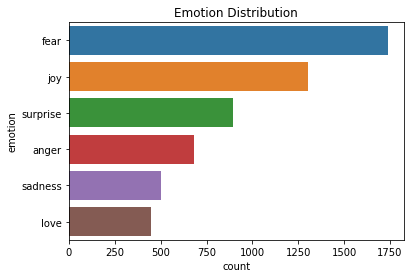

In [ ]:
for key, value in data.items():
  print("For", key)
  df = value
  df['emotion'], df['emotion_score'] = get_emotion(df['demojize_text'])
  swarm_plot = sns.countplot(data = df, y = 'emotion').set_title("Emotion Distribution")
  fig = swarm_plot.get_figure()
  #fig.savefig("1428917763335102468.png") 
  df.to_csv('/content/sample_data/interm/tweets_with_emotion_label_score'+key+'.csv', encoding='utf-8')


# df_1428917763335102468['emotion'], df_1428917763335102468['emotion_score'] = get_emotion(df_1428917763335102468['demojize_text'])
# # df_1428917763335102468['emotion_score'] = df_1428917763335102468['demojize_text'].apply(get_emotion_score)
# swarm_plot = sns.countplot(data = df_1428917763335102468, y = 'emotion').set_title("Emotion Distribution")
# fig = swarm_plot.get_figure()
# fig.savefig("1428917763335102468.png") 
# df_1428917763335102468.to_csv('tweets_with_emotion_label_score'+str(1428917763335102468)+'.csv', encoding='utf-8')

 
# df_1435191243105918980['emotion'], df_1435191243105918980['emotion_score'] = get_emotion(df_1435191243105918980['demojize_text'])
# # df_1435191243105918980['emotion_score'] = df_1435191243105918980['demojize_text'].apply(get_emotion_score)
# swarm_plot = sns.countplot(data = df_1435191243105918980, y = 'emotion').set_title("Emotion Distribution")
# fig = swarm_plot.get_figure()
# fig.savefig("1435191243105918980.png") 
# df_1435191243105918980.to_csv('tweets_with_emotion_label_score'+str(1435191243105918980)+'.csv', encoding='utf-8')


# df_1440264905307811850['emotion'], df_1440264905307811850['emotion_score'] = get_emotion(df_1440264905307811850['demojize_text'])
# # df_1440264905307811850['emotion_score'] = df_1440264905307811850['demojize_text'].apply(get_emotion_score)
# swarm_plot = sns.countplot(data = df_1440264905307811850, y = 'emotion').set_title("Emotion Distribution")
# fig = swarm_plot.get_figure()
# fig.savefig("1440264905307811850.png") 
# df_1440264905307811850.to_csv('tweets_with_emotion_label_score'+str(1440264905307811850)+'.csv', encoding='utf-8')


# df_1449967295048998913['emotion'], df_1449967295048998913['emotion_score'] = get_emotion(df_1449967295048998913['demojize_text'])
# # df_1449967295048998913['emotion_score'] = df_1449967295048998913['demojize_text'].apply(get_emotion_score)
# swarm_plot = sns.countplot(data = df_1449967295048998913, y = 'emotion').set_title("Emotion Distribution")
# fig = swarm_plot.get_figure()
# fig.savefig("1449967295048998913.png") 
# df_1449967295048998913.to_csv('tweets_with_emotion_label_score'+str(1449967295048998913)+'.csv', encoding='utf-8')


# df_1556805628974481408['emotion'], df_1556805628974481408['emotion_score'] = get_emotion(df_1556805628974481408['demojize_text'])
# # df_1556805628974481408['emotion_score'] = df_1556805628974481408['demojize_text'].apply(get_emotion_score)
# swarm_plot = sns.countplot(data = df_1556805628974481408, y = 'emotion').set_title("Emotion Distribution")
# fig = swarm_plot.get_figure()
# fig.savefig("1556805628974481408.png") 
# df_1556805628974481408.to_csv('tweets_with_emotion_label_score'+str(1556805628974481408)+'.csv', encoding='utf-8')


# {'joy', 'sadness', 'surprise', 'love', 'fear', 'anger'}

In [3]:
def read_graph_file(gf):
  G=nx.read_gexf(gf,relabel=False)
  fig, ax = plt.subplots(figsize=(15, 9))
  ax.axis("off")
  plot_options = {"node_size": 10, "with_labels": False, "width": 0.15}
  nx.draw_networkx(G, pos=nx.random_layout(G), ax=ax, **plot_options)

  pos = nx.spring_layout(G, iterations=85, seed=1721)
  fig, ax = plt.subplots(figsize=(15, 9))
  ax.axis("off")
  nx.draw_networkx(G, pos=pos, ax=ax, **plot_options)
  return G 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':


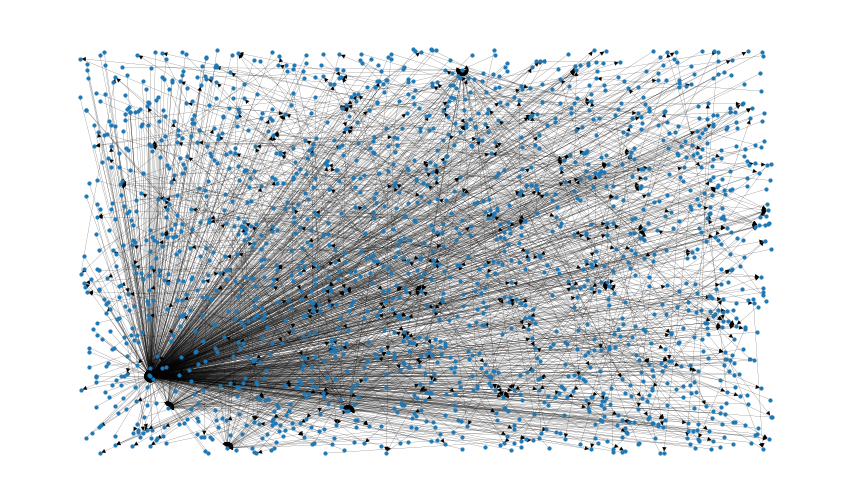

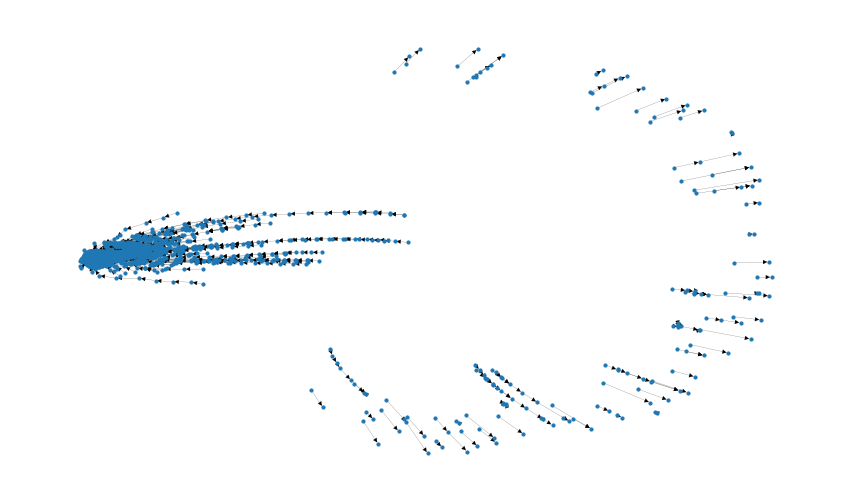

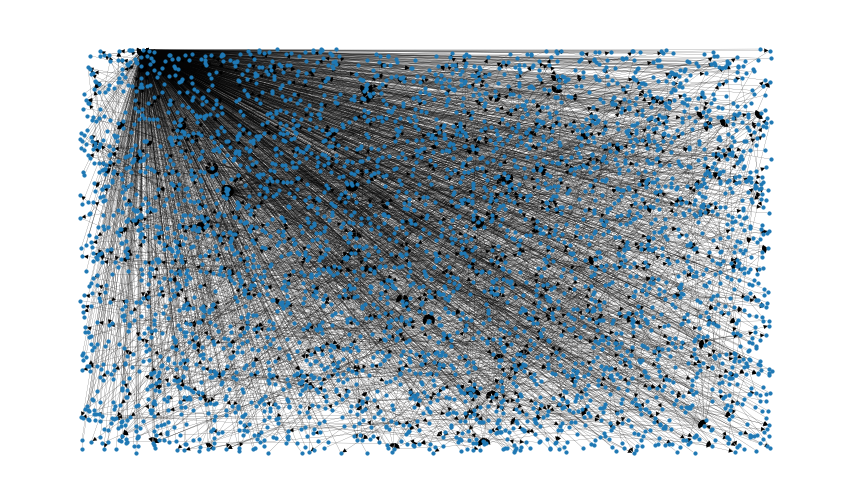

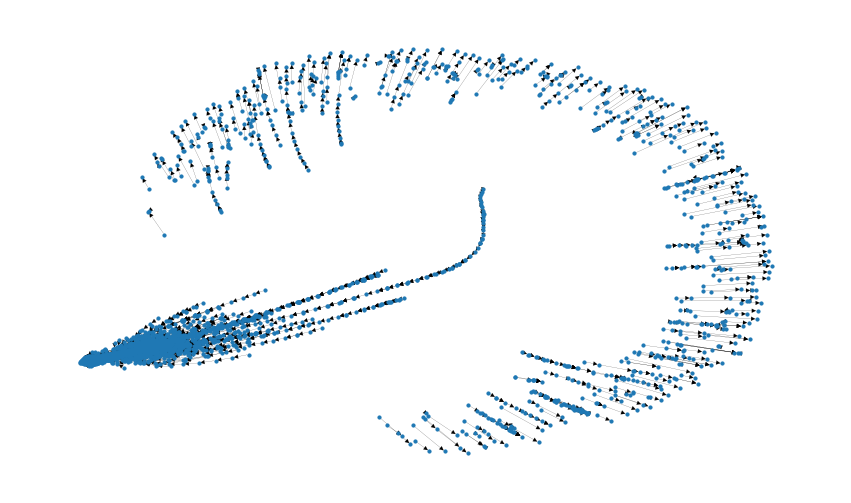

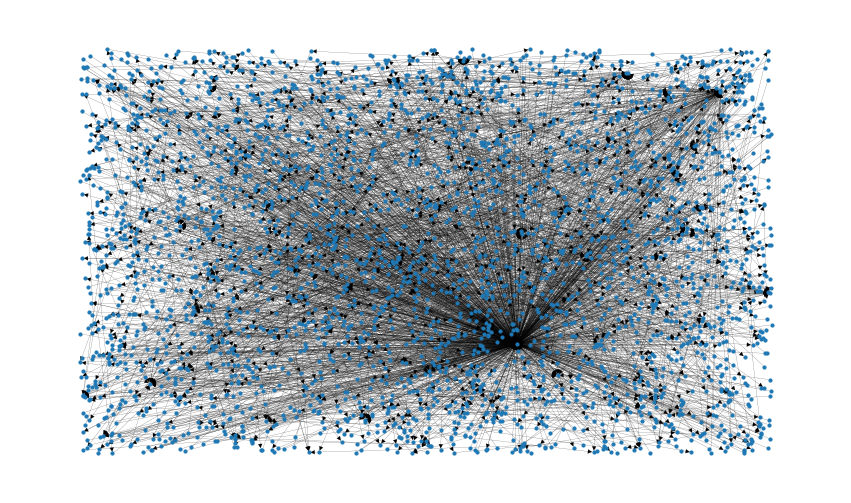

...

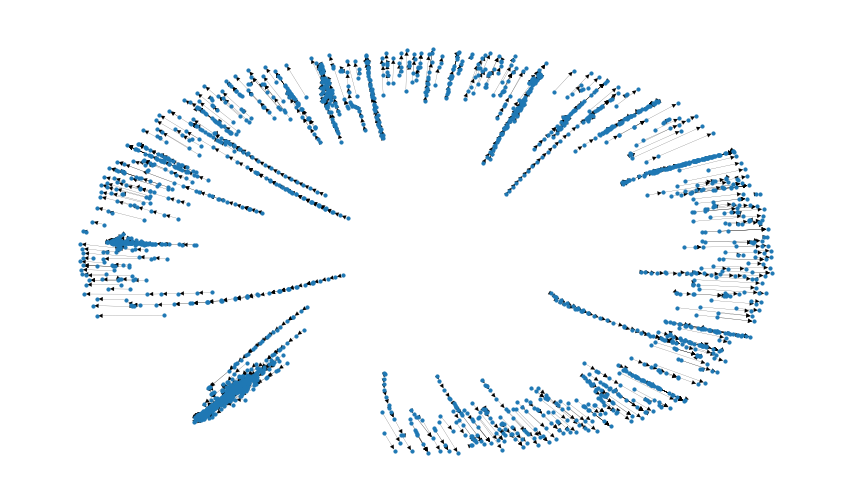

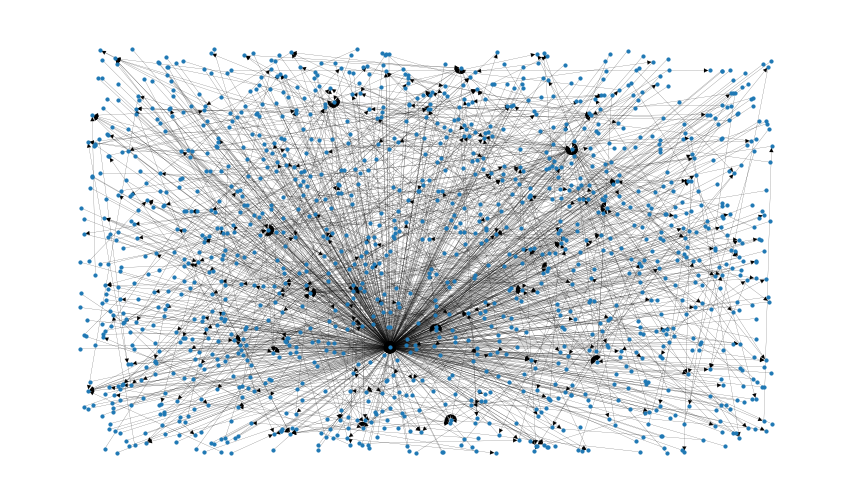

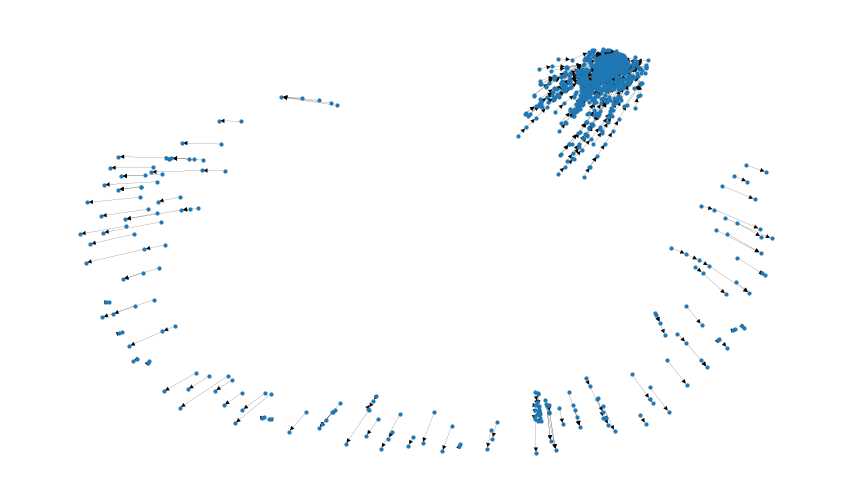

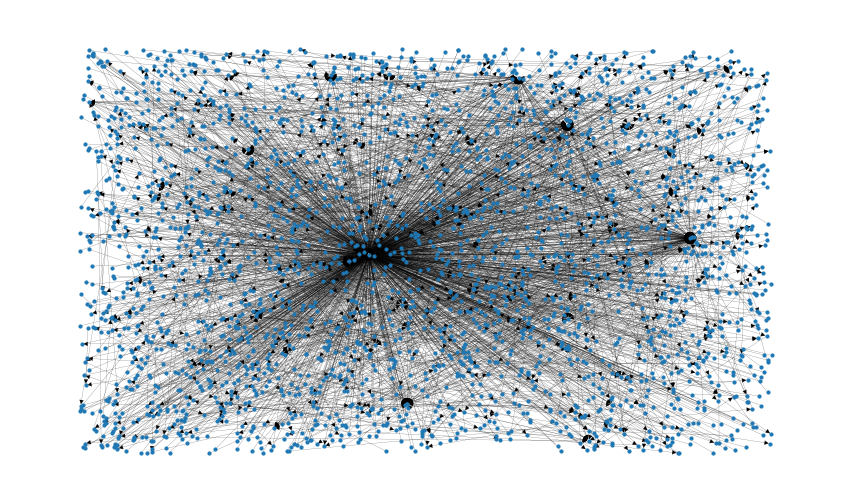

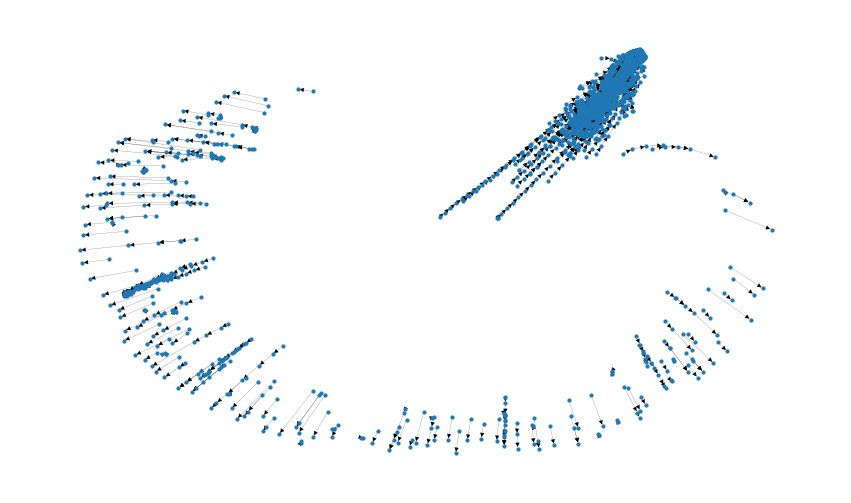

In [4]:
data = dict()
for file in os.listdir('/content/sample_data/interm/graph_files'):
    if file.endswith(".gexf"):
        data[file.replace(".gexf","")] = read_graph_file(os.path.join('/content/sample_data/interm/graph_files', file))

# G_1428917763335102468 = read_graph_file('/content/Network1428917763335102468.gexf')
# G_1435191243105918980 = read_graph_file('/content/Network1435191243105918980.gexf')
# G_1440264905307811850 = read_graph_file('/content/Network1440264905307811850.gexf')
# G_1449967295048998913 = read_graph_file('/content/Network1449967295048998913.gexf')
# G_1556805628974481408 = read_graph_file('/content/Network1556805628974481408.gexf')

In [5]:
def root_of_graph_(G):
  root = [n for n,d in G.out_degree() if d==0]
  return root[0]

In [6]:
def root_of_graph_(G):
  return list(nx.topological_sort(G))[0]  

In [7]:
def root_of_graph(G):
  return sorted(G.in_degree, key=lambda x: x[1], reverse=True)[0][0]

In [8]:
# Eigenvector centrality is the metric to show how connected a node is to other important nodes in the network. 
# It measures a node’s influence based on how well it is connected inside the network and how many links its connections have and so on. 
# This measure can identify the nodes with the most influence over the whole network. 
# A high eigenvector centrality means that the node is connected to other nodes who themselves have high eigenvector centralities. 

def eigenvector_centrality(G):
  eigenvector_centrality = nx.centrality.eigenvector_centrality(G, max_iter=600)  
  eigen_cent = (sorted(eigenvector_centrality.items(), key=lambda item: item[1], reverse=True))

  for i, j in eigen_cent:
    for node in list(G.nodes(data=True)):
      if node[0] == i:
        G.nodes[node[0]]['eigen_v'] = j
  return G

In [9]:
def distance_from_root(G, root):
  for node in list(G.nodes(data=True)):
    if nx.has_path(G, node[0], root):
      G.nodes[node[0]]['distance_from_root'] = nx.shortest_path_length(G, source=node[0], target=root, weight='len')
    else:
      G.nodes[node[0]]['distance_from_root'] = nx.dag_longest_path_length(G) + 2
  return G

In [10]:
def type_of_node(G):
  for node in list(G.nodes(data=True)):
    if sorted(G.in_degree, key=lambda x: x[1], reverse=True)[0][0] == node[0]:
      G.nodes[node[0]]['type_of_node'] =  'R'
      G.nodes[node[0]]['type_of_node_factor'] =  1
    elif G.in_degree(node[0]) == 0:
      if G.out_degree(node[0]) > 0:
        G.nodes[node[0]]['type_of_node'] =  'T'
        G.nodes[node[0]]['type_of_node_factor'] =  0.5
    else:
      G.nodes[node[0]]['type_of_node'] =  'C'
      G.nodes[node[0]]['type_of_node_factor'] =  2
  return G

In [11]:
def type_of_node_when_root_known(G, root):
  for node in list(G.nodes(data=True)):
    if root == node[0]:
      G.nodes[node[0]]['type_of_node'] =  'R'
      G.nodes[node[0]]['type_of_node_factor'] =  1
    elif G.in_degree(node[0]) == 0:
      if G.out_degree(node[0]) > 0:
        G.nodes[node[0]]['type_of_node'] =  'T'
        G.nodes[node[0]]['type_of_node_factor'] =  0.5
    else:
      G.nodes[node[0]]['type_of_node'] =  'C'
      G.nodes[node[0]]['type_of_node_factor'] =  2
  return G

In [12]:
def total_responses_thread(G, node):
  nodes = [n for n,v in G.nodes(data=True) if n in list(nx.ancestors(G, node))]  
  return len(nodes)

In [13]:
def total_responses_thread_norm(G, node):
  t = []
  for i in list(G.nodes(data=True)):
    nodes = [n for n,v in G.nodes(data=True) if n in list(nx.ancestors(G, i[0]))]
    t.append(len(nodes))
  max_ans = max(t)
  t_nodes = [n for n,v in G.nodes(data=True) if n in list(nx.ancestors(G, node))]  
  return len(t_nodes)/max_ans
  

In [14]:
def graph_pagerank(G):
  pr = nx.pagerank(G, max_iter=600)
  for node in list(G.nodes(data=True)):
    G.nodes[node[0]]['page_rank'] = pr.get(node[0])
  return G

In [15]:
def number_pred(G, node):
  return len(list(G.predecessors(node)))

In [16]:
def number_of_preds(G):
  for node in list(G.nodes(data=True)):
    if node[1]['type_of_node'] == 'C':
      G.nodes[node[0]]['number_preds'] = len(list(G.predecessors(node[0])))
    else:
      G.nodes[node[0]]['number_preds'] = 0

In [17]:
def longest_path_graph(G, node):
  selected_nodes = [n for n,v in G.nodes(data=True) if n in list(nx.ancestors(G, node))]  
  selected_nodes.append(node)
  H = G.subgraph(selected_nodes)
  return nx.dag_longest_path_length(H)

In [18]:
def emotion_representation_subgraphs(G):
  highest_emotion = nx.get_node_attributes(G, 'emotion_highest_score')
  df = pd.DataFrame.from_dict(highest_emotion, orient='index', columns=['h_emotion'])
  #print(pd.get_dummies(df.h_emotion))
  df = pd.get_dummies(df.h_emotion)
  df['id'] = df.index
  node_attr = df.set_index('id').to_dict('index')
  nx.set_node_attributes(G, node_attr)
  return G

In [19]:
def draw_graph(G):
  fig, ax = plt.subplots(figsize=(15, 9))
  ax.axis("off")
  plot_options = {"node_size": 10, "with_labels": False, "width": 0.15}
  nx.draw_networkx(G, pos=nx.random_layout(G), ax=ax, **plot_options)

  pos = nx.spring_layout(G, iterations=85, seed=1721)
  fig, ax = plt.subplots(figsize=(15, 9))
  ax.axis("off")
  nx.draw_networkx(G, pos=pos, ax=ax, **plot_options)

In [20]:
def emotional_impact(G1):
  # G1 = G_1428917763335102468
  G2 = eigenvector_centrality(G1)
  root = root_of_graph(G2)
  print("Root of graph", root)
  

  Gd = distance_from_root(G2, root)
  gt = type_of_node(Gd)
  G = graph_pagerank(gt)
  #print("root node", G.nodes[root])
  #print("Root", root_of_graph(G))
  emotion_scores = nx.get_node_attributes(G, 'emotion_score')
  emotions = nx.get_node_attributes(G, 'emotion')
  emotion28 = ['surprise', 'love', 'joy', 'anger', 'sadness', 'fear']
  emotion_dict = dict(zip(emotion28, [0] * 6))

  a = emotions.values()
  counter = collections.Counter(a)
  print("Emotion distribution across nodes:", counter)
  per = [(i, counter[i] / len(a) * 100.0) for i in counter]
  print("Percentage distribution:", per)
  print("In degree of root", G.in_degree(root))
  # emotion_dict.update({emotions[root]:float(float(emotion_scores[root])/float(G.in_degree(root)))})
  print(list(G.nodes(data=True)))

  print("emotion_dict before loop", emotion_dict)
  for node in list(G.nodes(data=True)):
    print("Node", node[0])
    print("Node data", node[1])
    print("emotion_dict in loop", emotion_dict)
    if node[0] != root:
      if node[1]['type_of_node'] == 'C':
        if 'emotion' in node[1]:
          print("total_responses_thread(G, node[0])", total_responses_thread(G, node[0]))
          print("node[1]['type_of_node_factor']", node[1]['type_of_node_factor'])
          print("node[1]['page_rank']", node[1]['page_rank'])
          print("distance_from_root", node[1]['distance_from_root'])
          print("number_pred(G, node[0])", number_pred(G, node[0]))
          G.nodes[node[0]]['influence_factor']= float(node[1]['type_of_node_factor'])*float(number_pred(G, node[0]))*float(node[1]['page_rank'])*float(1/node[1]['distance_from_root'])*float(total_responses_thread(G, node[0]))
          G.nodes[node[0]]['emotion_highest_score']=node[1]['emotion']
          print("influence_factor", node[1]['influence_factor'])
          print("type: influence_factor", type(node[1]['influence_factor']))
          print("Inside C", emotion_dict)
          current_value_emotion_in_emotion_dict = float(emotion_dict.get(emotions[node[0]]))
          print("Emotion", emotions[node[0]])
          print("current_value_emotion_in_emotion_dict", current_value_emotion_in_emotion_dict)
          emotion_dict.update({emotions[node[0]]:float(current_value_emotion_in_emotion_dict) + float((node[1]['influence_factor'])*float(node[1]['emotion_score']))})
      elif node[1]['type_of_node'] == 'T':
        if 'emotion' in node[1]:
          print("Inside T", emotion_dict)
          G.nodes[node[0]]['influence_factor']= float(node[1]['type_of_node_factor'])*float(node[1]['page_rank'])*float(1/node[1]['distance_from_root'])
          print(node[1]['influence_factor'])
          print("Emotion", emotions[node[0]])
          G.nodes[node[0]]['emotion_highest_score']=node[1]['emotion']
          current_value_emotion_in_emotion_dict = emotion_dict.get(emotions[node[0]])
          emotion_dict.update({emotions[node[0]]:float(current_value_emotion_in_emotion_dict) + float((node[1]['influence_factor'])*float(node[1]['emotion_score']))})
    # print("emotion_dict inside loop after if", emotion_dict)
      else:
        G.nodes[node[0]]['influence_factor']= float(node[1]['type_of_node_factor'])*float(node[1]['page_rank'])
      print("emotion_dict inside loop after if", emotion_dict)
  influence_scores = nx.get_node_attributes(G, 'influence_factor')
  mean_value = mean(influence_scores.values())
  count = 0
  for node in list(G.nodes(data=True)):
    if 'influence_factor' in node[1]:
      if node[0] != root:
        #print(node[1])
        if node[1]['influence_factor'] >= mean_value:
          count = count + 1
          G.nodes[node[0]]['influential']=1
        else:
          G.nodes[node[0]]['influential']=0
    else:
      G.nodes[node[0]]['influential']=0
      G.nodes[node[0]]['influence_factor']=0
  print("Number of influential nodes for the root node: ", count)


  eigen_scores = nx.get_node_attributes(G, 'eigen_v')
  e_mean_value = mean(eigen_scores.values())
  ecount = 0
  for node in list(G.nodes(data=True)):
    if 'eigen_v' in node[1]:
      if node[0] != root:
        #print(node[1])
        if node[1]['eigen_v'] >= mean_value:
          ecount = ecount + 1
          G.nodes[node[0]]['sinfluential']=1
        else:
          G.nodes[node[0]]['sinfluential']=0
  print("Number of ststistical influential nodes for the root node: ", ecount)

  G.nodes[root]['emotion_board'] = emotion_dict
  G.nodes[root]['influential'] = 1
  new_dict = {k:float(v) for k, v in emotion_dict.items()}
  G.nodes[root]['emotion_highest_score'] = max(new_dict.items(), key=operator.itemgetter(1))[0]
  print(G.nodes[root])

  return emotion_representation_subgraphs(G)

In [21]:
def emotional_impact_without_node_type_factor(G1):
  # G1 = G_1428917763335102468
  G2 = eigenvector_centrality(G1)
  root = root_of_graph(G2)
  #print("Root of graph", root)
  

  Gd = distance_from_root(G2, root)
  gt = type_of_node(Gd)
  G = graph_pagerank(gt)
  #print("root node", G.nodes[root])
  #print("Root", root_of_graph(G))
  emotion_scores = nx.get_node_attributes(G, 'emotion_score')
  emotions = nx.get_node_attributes(G, 'emotion')
  emotion28 = ['surprise', 'love', 'joy', 'anger', 'sadness', 'fear']
  emotion_dict = dict(zip(emotion28, [0] * 6))
  a = emotions.values()
  counter = collections.Counter(a)
  print("Emotion distribution across nodes:", counter)
  per = [(i, counter[i] / len(a) * 100.0) for i in counter]
  print("Percentage distribution:", per)
  #print("In degree of root", G.in_degree(root))
  #emotion_dict.update({emotions[root]:float(float(emotion_scores[root])/float(G.in_degree(root)))})
  #print(list(G.nodes(data=True)))

  #print("emotion_dict before loop", emotion_dict)
  for node in list(G.nodes(data=True)):
    # print("Node", node[0])
    # print("Node data", node[1])
    # print("emotion_dict in loop", emotion_dict)
    if node[0] != root:
      if node[1]['type_of_node'] == 'C':
        if 'emotion' in node[1]:
          # print("total_responses_thread(G, node[0])", total_responses_thread(G, node[0]))
          # print("node[1]['type_of_node_factor']", node[1]['type_of_node_factor'])
          # print("node[1]['page_rank']", node[1]['page_rank'])
          # print("distance_from_root", node[1]['distance_from_root'])
          # print("number_pred(G, node[0])", number_pred(G, node[0]))
          G.nodes[node[0]]['influence_factor']= float(number_pred(G, node[0]))*float(node[1]['page_rank'])*float(1/node[1]['distance_from_root'])*float(total_responses_thread(G, node[0]))
          G.nodes[node[0]]['emotion_highest_score']=node[1]['emotion']
          # print("influence_factor", node[1]['influence_factor'])
          # print("type: influence_factor", type(node[1]['influence_factor']))
          # print("Inside C", emotion_dict)
          current_value_emotion_in_emotion_dict = float(emotion_dict.get(emotions[node[0]]))
          # print("Emotion", emotions[node[0]])
          # print("current_value_emotion_in_emotion_dict", current_value_emotion_in_emotion_dict)
          emotion_dict.update({emotions[node[0]]:float(current_value_emotion_in_emotion_dict) + float((node[1]['influence_factor'])*float(node[1]['emotion_score']))})
      elif node[1]['type_of_node'] == 'T':
        if 'emotion' in node[1]:
          # print("Inside T", emotion_dict)
          G.nodes[node[0]]['influence_factor']= float(node[1]['page_rank'])*float(1/node[1]['distance_from_root'])
          # print(node[1]['influence_factor'])
          # print("Emotion", emotions[node[0]])
          G.nodes[node[0]]['emotion_highest_score']=node[1]['emotion']
          current_value_emotion_in_emotion_dict = emotion_dict.get(emotions[node[0]])
          emotion_dict.update({emotions[node[0]]:float(current_value_emotion_in_emotion_dict) + float((node[1]['influence_factor'])*float(node[1]['emotion_score']))})
    # print("emotion_dict inside loop after if", emotion_dict)
      else:
        G.nodes[node[0]]['influence_factor']= float(node[1]['page_rank'])
  influence_scores = nx.get_node_attributes(G, 'influence_factor')
  mean_value = mean(influence_scores.values())
  count = 0
  for node in list(G.nodes(data=True)):
    if 'influence_factor' in node[1]:
      if node[0] != root:
        #print(node[1])
        if node[1]['influence_factor'] >= mean_value:
          count = count + 1
          G.nodes[node[0]]['influential']=1
        else:
          G.nodes[node[0]]['influential']=0
    else:
      G.nodes[node[0]]['influential']=0
      G.nodes[node[0]]['influence_factor']=0
  print("Number of influential nodes for the root node: ", count)


  eigen_scores = nx.get_node_attributes(G, 'eigen_v')
  e_mean_value = mean(eigen_scores.values())
  ecount = 0
  for node in list(G.nodes(data=True)):
    if 'eigen_v' in node[1]:
      if node[0] != root:
        #print(node[1])
        if node[1]['eigen_v'] >= mean_value:
          ecount = ecount + 1
          G.nodes[node[0]]['sinfluential']=1
        else:
          G.nodes[node[0]]['sinfluential']=0
  print("Number of ststistical influential nodes for the root node: ", ecount)

  G.nodes[root]['emotion_board'] = emotion_dict
  G.nodes[root]['influential'] = 1
  new_dict = {k:float(v) for k, v in emotion_dict.items()}
  G.nodes[root]['emotion_highest_score'] = max(new_dict.items(), key=operator.itemgetter(1))[0]
  print(G.nodes[root])

  return emotion_representation_subgraphs(G)

In [22]:
def emotional_impact_without_emotion_score_(G1):
  # G1 = G_1428917763335102468
  G2 = eigenvector_centrality(G1)
  root = root_of_graph(G2)
  #print("Root of graph", root)
  

  Gd = distance_from_root(G2, root)
  gt = type_of_node(Gd)
  G = graph_pagerank(gt)
  #print("root node", G.nodes[root])
  #print("Root", root_of_graph(G))
  emotion_scores = nx.get_node_attributes(G, 'emotion_score')
  emotions = nx.get_node_attributes(G, 'emotion')
  emotion28 = ['surprise', 'love', 'joy', 'anger', 'sadness', 'fear']
  emotion_dict = dict(zip(emotion28, [1] * 6))
  a = emotions.values()
  counter = collections.Counter(a)
  print("Emotion distribution across nodes:", counter)
  per = [(i, counter[i] / len(a) * 100.0) for i in counter]
  print("Percentage distribution:", per)
  #print("In degree of root", G.in_degree(root))
  #emotion_dict.update({emotions[root]:float(float(emotion_scores[root])/float(G.in_degree(root)))})
  #print(list(G.nodes(data=True)))

  #print("emotion_dict before loop", emotion_dict)
  for node in list(G.nodes(data=True)):
    # print("Node", node[0])
    # print("Node data", node[1])
    # print("emotion_dict in loop", emotion_dict)
    if node[0] != root:
      if node[1]['type_of_node'] == 'C':
        if 'emotion' in node[1]:
          # print("total_responses_thread(G, node[0])", total_responses_thread(G, node[0]))
          # print("node[1]['type_of_node_factor']", node[1]['type_of_node_factor'])
          # print("node[1]['page_rank']", node[1]['page_rank'])
          # print("distance_from_root", node[1]['distance_from_root'])
          # print("number_pred(G, node[0])", number_pred(G, node[0]))
          G.nodes[node[0]]['influence_factor']= float(number_pred(G, node[0]))*float(node[1]['page_rank'])*float(1/node[1]['distance_from_root'])*float(total_responses_thread(G, node[0]))
          G.nodes[node[0]]['emotion_highest_score']=node[1]['emotion']
          # print("influence_factor", node[1]['influence_factor'])
          # print("type: influence_factor", type(node[1]['influence_factor']))
          # print("Inside C", emotion_dict)
          current_value_emotion_in_emotion_dict = float(emotion_dict.get(emotions[node[0]]))
          # print("Emotion", emotions[node[0]])
          # print("current_value_emotion_in_emotion_dict", current_value_emotion_in_emotion_dict)
          emotion_dict.update({emotions[node[0]]:float(current_value_emotion_in_emotion_dict) + float((node[1]['influence_factor']))})
      elif node[1]['type_of_node'] == 'T':
        if 'emotion' in node[1]:
          # print("Inside T", emotion_dict)
          G.nodes[node[0]]['influence_factor']= float(node[1]['page_rank'])*float(1/node[1]['distance_from_root'])
          # print(node[1]['influence_factor'])
          # print("Emotion", emotions[node[0]])
          G.nodes[node[0]]['emotion_highest_score']=node[1]['emotion']
          current_value_emotion_in_emotion_dict = emotion_dict.get(emotions[node[0]])
          emotion_dict.update({emotions[node[0]]:float(current_value_emotion_in_emotion_dict) + float((node[1]['influence_factor']))})
    # print("emotion_dict inside loop after if", emotion_dict)
      else:
        G.nodes[node[0]]['influence_factor']= float(node[1]['page_rank'])
  influence_scores = nx.get_node_attributes(G, 'influence_factor')
  mean_value = mean(influence_scores.values())
  count = 0
  for node in list(G.nodes(data=True)):
    if 'influence_factor' in node[1]:
      if node[0] != root:
        #print(node[1])
        if node[1]['influence_factor'] >= mean_value:
          count = count + 1
          G.nodes[node[0]]['influential']=1
        else:
          G.nodes[node[0]]['influential']=0
    else:
      G.nodes[node[0]]['influential']=0
      G.nodes[node[0]]['influence_factor']=0
  print("Number of influential nodes for the root node: ", count)


  eigen_scores = nx.get_node_attributes(G, 'eigen_v')
  e_mean_value = mean(eigen_scores.values())
  ecount = 0
  for node in list(G.nodes(data=True)):
    if 'eigen_v' in node[1]:
      if node[0] != root:
        #print(node[1])
        if node[1]['eigen_v'] >= mean_value:
          ecount = ecount + 1
          G.nodes[node[0]]['sinfluential']=1
        else:
          G.nodes[node[0]]['sinfluential']=0
  print("Number of ststistical influential nodes for the root node: ", ecount)

  G.nodes[root]['emotion_board'] = emotion_dict
  G.nodes[root]['influential'] = 1
  new_dict = {k:float(v) for k, v in emotion_dict.items()}
  G.nodes[root]['emotion_highest_score'] = max(new_dict.items(), key=operator.itemgetter(1))[0]
  print(G.nodes[root])

  return emotion_representation_subgraphs(G)

In [23]:
def emotional_impact_without_emotion_score(G1, key):
  # G1 = G_1428917763335102468
  G2 = eigenvector_centrality(G1)
  root = root_of_graph(G2)
  #print("Root of graph", root)
  

  Gd = distance_from_root(G2, root)
  gt = type_of_node(Gd)
  G = graph_pagerank(gt)
  #print("root node", G.nodes[root])
  #print("Root", root_of_graph(G))
  emotion_scores = nx.get_node_attributes(G, 'emotion_score')
  emotions = nx.get_node_attributes(G, 'emotion')
  emotion28 = ['surprise', 'love', 'joy', 'anger', 'sadness', 'fear']
  emotion_dict = dict(zip(emotion28, [1] * 6))
  a = emotions.values()
  counter = collections.Counter(a)
  print("Emotion distribution across nodes:", counter)
  per = [(i, counter[i] / len(a) * 100.0) for i in counter]
  print("Percentage distribution:", per)
  #print("In degree of root", G.in_degree(root))
  #emotion_dict.update({emotions[root]:float(float(emotion_scores[root])/float(G.in_degree(root)))})
  #print(list(G.nodes(data=True)))

  #print("emotion_dict before loop", emotion_dict)
  for node in list(G.nodes(data=True)):
    # print("Node", node[0])
    # print("Node data", node[1])
    # print("emotion_dict in loop", emotion_dict)
    if node[0] != root:
      if node[1]['type_of_node'] == 'C':
        if 'emotion' in node[1]:
          # print("total_responses_thread(G, node[0])", total_responses_thread(G, node[0]))
          # print("node[1]['type_of_node_factor']", node[1]['type_of_node_factor'])
          # print("node[1]['page_rank']", node[1]['page_rank'])
          # print("distance_from_root", node[1]['distance_from_root'])
          # print("number_pred(G, node[0])", number_pred(G, node[0]))
          G.nodes[node[0]]['influence_factor']= float(number_pred(G, node[0]))*float(node[1]['page_rank'])*float(1/node[1]['distance_from_root'])
          #G.nodes[node[0]]['emotion_highest_score']=node[1]['emotion']
          # print("influence_factor", node[1]['influence_factor'])
          # print("type: influence_factor", type(node[1]['influence_factor']))
          # print("Inside C", emotion_dict)
          #current_value_emotion_in_emotion_dict = float(emotion_dict.get(emotions[node[0]]))
          # print("Emotion", emotions[node[0]])
          # print("current_value_emotion_in_emotion_dict", current_value_emotion_in_emotion_dict)
          #emotion_dict.update({emotions[node[0]]:float(current_value_emotion_in_emotion_dict) + float((node[1]['influence_factor']))})
      elif node[1]['type_of_node'] == 'T':
        if 'emotion' in node[1]:
          # print("Inside T", emotion_dict)
          G.nodes[node[0]]['influence_factor']= float(node[1]['page_rank'])*float(1/node[1]['distance_from_root'])
          # print(node[1]['influence_factor'])
          # print("Emotion", emotions[node[0]])
          # G.nodes[node[0]]['emotion_highest_score']=node[1]['emotion']
          # current_value_emotion_in_emotion_dict = emotion_dict.get(emotions[node[0]])
          # emotion_dict.update({emotions[node[0]]:float(current_value_emotion_in_emotion_dict) + float((node[1]['influence_factor']))})
    # print("emotion_dict inside loop after if", emotion_dict)
      else:
        G.nodes[node[0]]['influence_factor']= float(node[1]['page_rank'])
  influence_scores = nx.get_node_attributes(G, 'influence_factor')
  mean_value = mean(influence_scores.values())
  count = 0
  for node in list(G.nodes(data=True)):
    if 'influence_factor' in node[1]:
      if node[0] != root:
        #print(node[1])
        if node[1]['influence_factor'] >= mean_value:
          count = count + 1
          G.nodes[node[0]]['influential']=1
        else:
          G.nodes[node[0]]['influential']=0
    else:
      G.nodes[node[0]]['influential']=0
      G.nodes[node[0]]['influence_factor']=0
  print("Number of influential nodes for the root node: ", count)


  eigen_scores = nx.get_node_attributes(G, 'eigen_v')
  e_mean_value = mean(eigen_scores.values())
  ecount = 0
  for node in list(G.nodes(data=True)):
    if 'eigen_v' in node[1]:
      if node[0] != root:
        #print(node[1])
        if node[1]['eigen_v'] >= mean_value:
          ecount = ecount + 1
          G.nodes[node[0]]['sinfluential']=1
        else:
          G.nodes[node[0]]['sinfluential']=0
  print("Number of ststistical influential nodes for the root node: ", ecount)

  # G.nodes[root]['emotion_board'] = emotion_dict
  G.nodes[root]['influential'] = 1
  # new_dict = {k:float(v) for k, v in emotion_dict.items()}
  # G.nodes[root]['emotion_highest_score'] = max(new_dict.items(), key=operator.itemgetter(1))[0]
  print(G.nodes[root])

  # return emotion_representation_subgraphs(G)
  return calibrating_influential_nodes(G, key)

In [24]:
def find_emotion_represented_by_influential_node(G, influential_node):
  root = influential_node
  # print("Root of graph", root)
  # print("Root of graph equal to the influential node:", root is influential_node)
  Gd = distance_from_root(G, root)
  gt = type_of_node_when_root_known(Gd, root)
  G = graph_pagerank(gt)
  emotions = nx.get_node_attributes(G, 'emotion')
  emotion28 = ['surprise', 'love', 'joy', 'anger', 'sadness', 'fear']
  emotion_dict = dict(zip(emotion28, [1] * 6))
  a = emotions.values()
  counter = collections.Counter(a)
  # print("Emotion distribution across nodes:", counter)
  per = [(i, counter[i] / len(a) * 100.0) for i in counter]
  print("Percentage distribution:", per)
  print("wiener_index", nx.wiener_index(G.to_undirected()))
  print("Depth", nx.dag_longest_path_length(G))
  print("Number of connected components:", nx.number_connected_components(G.to_undirected()))
  child_nodes_anger = [n for n,v in G.nodes(data=True) if ((v['type_of_node'] == 'C') &(v['emotion'] == 'anger'))]  
  leaf_nodes_anger = [n for n,v in G.nodes(data=True) if ((v['type_of_node'] == 'T') &(v['emotion'] == 'anger'))]  

  # print("child_nodes_anger", len(child_nodes_anger))
  # print("leaf_nodes_anger", len(leaf_nodes_anger))
  for node in list(G.nodes(data=True)):
    
    if node[0] != root:
      if node[1]['type_of_node'] == 'C':
        if 'emotion' in node[1]:
          #print("From child influence calculation", node[1]['emotion'], number_pred(G, node[0]), total_responses_thread(G, node[0]))
          G.nodes[node[0]]['influence_factor'] = float(number_pred(G, node[0]))*float(node[1]['page_rank'])*float(1/node[1]['distance_from_root'])
          current_value_emotion_in_emotion_dict = float(emotion_dict.get(emotions[node[0]]))
          emotion_dict.update({emotions[node[0]]:float(current_value_emotion_in_emotion_dict) + float((node[1]['influence_factor']))})
          
      elif node[1]['type_of_node'] == 'T':
        if 'emotion' in node[1]:
          G.nodes[node[0]]['influence_factor'] = float(node[1]['page_rank'])*float(1/node[1]['distance_from_root'])
          current_value_emotion_in_emotion_dict = emotion_dict.get(emotions[node[0]])
          emotion_dict.update({emotions[node[0]]:float(current_value_emotion_in_emotion_dict) + float((node[1]['influence_factor']))})
  new_dict = {k:float(v) for k, v in emotion_dict.items()}
  represented_emotion = max(new_dict.items(), key=operator.itemgetter(1))[0]
  return represented_emotion, float(emotion_dict.get(represented_emotion))

In [25]:
def calibrating_influential_nodes(G, key):

# store dict as csv before return statement, plot the csv directly
  list_inf_nodes = []
  root = root_of_graph(G)
  emotion28 = ['surprise', 'love', 'joy', 'anger', 'sadness', 'fear']
  counter_emotion_influential_node = dict(zip(emotion28, [0] * 6))
  number_of_nodes_in_subgraph = {'anger':list(), 'joy':list(), 'love':list(), 'sadness':list(), 'fear':list(), 'surprise':list()} #total responses generated, num nodes in subgraph-1
  dag_in_subgraph = {'anger':[], 'joy':[], 'love':[], 'sadness':[], 'fear':[], 'surprise':[]}
  number_of_direct_replies = {'anger':[], 'joy':[], 'love':[], 'sadness':[], 'fear':[], 'surprise':[]}
  emotion_distribution_list = []
  number_of_unique_users = []#number of nodes divided by number of unique users
  perr = []
  wiener = []
  depth = []
  perr_love = []
  perr_joy = []
  perr_fear = []
  perr_sad = []
  perr_surp = []



  for node in list(G.nodes(data=True)):
    if node[0] != root:
      if ('influential' in node[1]):
        if (node[1]['influential'] == 1):
          list_inf_nodes.append(node[0])
          #print(node[0], node[1]['emotion'])
          nodes_in_reply_tree = [n for n,v in G.nodes(data=True) if n in list(nx.ancestors(G, node[0]))]  
          # print(nodes_in_reply_tree)
          nodes_in_reply_tree.append(node[0])
          # print(nodes_in_reply_tree)
          H = G.subgraph(nodes_in_reply_tree)
          # print("subgraph", H)
          current_value_counter_emotion_influential_node = int(counter_emotion_influential_node.get(node[1]['emotion']))
          counter_emotion_influential_node.update({node[1]['emotion']:int(current_value_counter_emotion_influential_node + 1)})
          current_value_number_of_nodes_in_subgraph = number_of_nodes_in_subgraph.get(node[1]['emotion'])
          #number_of_nodes_in_subgraph.update({node[1]['emotion']:current_value_number_of_nodes_in_subgraph.append(H.number_of_nodes()-1)})
          number_of_nodes_in_subgraph[node[1]['emotion']].append(H.number_of_nodes()-1)
          current_value_dag_in_subgraph = dag_in_subgraph.get(node[1]['emotion'])
          #dag_in_subgraph.update({node[1]['emotion']:current_value_dag_in_subgraph.append(nx.dag_longest_path_length(H))})
          dag_in_subgraph[node[1]['emotion']].append(nx.dag_longest_path_length(H))
          current_value_number_of_direct_replies = number_of_direct_replies.get(node[1]['emotion'])
          #number_of_direct_replies.update({node[1]['emotion']:current_value_number_of_direct_replies.append(number_pred(G, node[0]))})
          number_of_direct_replies[node[1]['emotion']].append(number_pred(G, node[0]))
          #draw_graph(H)
          emotions = nx.get_node_attributes(H, 'emotion')
          authors = nx.get_node_attributes(H, 'author_id')
          list_of_authors = list(authors.values())
          number_of_unique_authors = len(np.unique(list_of_authors))
          number_of_unique_users.append(H.number_of_nodes()/number_of_unique_authors)
          a = emotions.values()
          counter = collections.Counter(a)
          per = [(i, counter[i] / len(a) * 100.0) for i in counter]
          emotion_distribution_list.append(dict(per))
          # print("Emotion distribution across nodes:", per)
          if H.number_of_nodes() > 1:
            if(nx.dag_longest_path_length(H) > 1):
              em = nx.get_node_attributes(H, 'emotion')
              a = em.values()
              counter = collections.Counter(a)
              # print("Emotion distribution across nodes:", counter)
              per = [(i, counter[i] / len(a) * 100.0) for i in counter]
              print("Percentage distribution:", per)
              perr.append(dict(per).get("anger"))
              perr_love.append(dict(per).get("love"))
              perr_joy.append(dict(per).get("joy"))
              perr_fear.append(dict(per).get("fear"))
              perr_sad.append(dict(per).get("sadness"))
              perr_surp.append(dict(per).get("surprise"))
              print("wiener_index", nx.wiener_index(H.to_undirected()))
              wiener.append(nx.wiener_index(H.to_undirected()))
              print("Depth", nx.dag_longest_path_length(H))
              depth.append(nx.dag_longest_path_length(H))
              print("Number of connected components:", nx.number_connected_components(H.to_undirected()))
            G.nodes[node[0]]['emotion_represented_by_influential_node'], G.nodes[node[0]]['emotion_representation_influence'] = find_emotion_represented_by_influential_node(H, node[0])
            # print("returned from finding emotion")
            # print("emotion_represented_by_influential_node", G.nodes[node[0]]['emotion_represented_by_influential_node'])
            # print("emotion_representation_influence", G.nodes[node[0]]['emotion_representation_influence'])
  fig = plt.figure(figsize = (10, 5))
 
  # creating the bar plot
  print(perr)
  print(wiener)
  perr = [0 if v is None else v for v in perr]
  perr_love = [0 if v is None else v for v in perr_love]
  perr_joy = [0 if v is None else v for v in perr_joy]
  perr_fear = [0 if v is None else v for v in perr_fear]
  perr_sad = [0 if v is None else v for v in perr_sad]
  perr_surp = [0 if v is None else v for v in perr_surp]

  plt.bar(perr, wiener, color ='blue', width = 0.4)
  plt.xlabel("Anger%")
  plt.ylabel("Wiener index")
  plt.title("Wiener index vs anger "+str(key))
  plt.show()

  plt.bar(perr_love, wiener, color ='red', width = 0.4)
  plt.xlabel("Love%")
  plt.ylabel("Wiener index")
  plt.title("Wiener index vs love "+str(key))
  plt.show()

  plt.bar(perr_joy, wiener, color ='green', width = 0.4)
  plt.xlabel("Joy%")
  plt.ylabel("Wiener index")
  plt.title("Wiener index vs joy "+str(key))
  plt.show()

  plt.bar(perr_fear, wiener, color ='green', width = 0.4)
  plt.xlabel("Fear%")
  plt.ylabel("Wiener index")
  plt.title("Wiener index vs fear "+str(key))
  plt.show()

  plt.bar(perr_sad, wiener, color ='green', width = 0.4)
  plt.xlabel("Sadness%")
  plt.ylabel("Wiener index")
  plt.title("Wiener index vs sadness "+str(key))
  plt.show()

  plt.bar(perr_surp, wiener, color ='green', width = 0.4)
  plt.xlabel("Surprise%")
  plt.ylabel("Wiener index")
  plt.title("Wiener index vs surprise "+str(key))
  plt.show()

  # plt.bar(range(len(number_of_direct_replies)), list(number_of_direct_replies.values()), align='center')
  # plt.xticks(range(len(number_of_direct_replies)), list(number_of_direct_replies.keys()))
  # plt.show()
  # plt.bar(*zip(*number_of_direct_replies.items()))
  # plt.show()
  from matplotlib import pyplot

  # fig, ax = pyplot.subplots()
  # ax.plot(number_of_direct_replies.keys(), number_of_direct_replies.values(), 'k-')
  print("Average number of nodes in the reply tree of an influential node (Emotion-wise): ", { k:sum(number_of_nodes_in_subgraph[k]) / len(number_of_nodes_in_subgraph[k]) for k in number_of_nodes_in_subgraph if len(number_of_nodes_in_subgraph[k])!=0})
  print("Average direct responses to an influential node (Emotion-wise): ", { k:sum(number_of_direct_replies[k]) / len(number_of_direct_replies[k]) for k in number_of_direct_replies if len(number_of_direct_replies[k])!=0})
  print("Average length of the reply tree of an influential node (Emotion-wise): ", { k:sum(dag_in_subgraph[k]) / len(dag_in_subgraph[k]) for k in dag_in_subgraph if len(dag_in_subgraph[k])!=0})
  df_number_of_nodes_in_subgraph = pd.concat([pd.DataFrame(v, columns=[k]) for k, v in number_of_nodes_in_subgraph.items()], axis=1)
  # df_number_of_nodes_in_subgraph = df_number_of_nodes_in_subgraph.explode(1)
  df_number_of_nodes_in_subgraph.to_csv('/content/sample_data/interm/number_of_nodes_in_subgraph'+key+'.csv', encoding='utf-8')
  
  df_number_of_direct_replies = pd.concat([pd.DataFrame(v, columns=[k]) for k, v in number_of_direct_replies.items()], axis=1)
  # df_number_of_direct_replies = df_number_of_direct_replies.explode(1)
  df_number_of_direct_replies.to_csv('/content/sample_data/interm/number_of_direct_replies'+key+'.csv', encoding='utf-8')
  
  df_dag_in_subgraph = pd.concat([pd.DataFrame(v, columns=[k]) for k, v in dag_in_subgraph.items()], axis=1)
  # df_dag_in_subgraph = df_dag_in_subgraph.explode(1)
  df_dag_in_subgraph.to_csv('/content/sample_data/interm/dag_in_subgraph'+key+'.csv', encoding='utf-8')

  res = defaultdict(list)

  for d in emotion_distribution_list:
    for k, v in d.items():
      res[k].append(v)
  print("Average emotion distribution in influential nodes: ", { k:sum(res[k]) / len(res[k]) for k in res if len(res[k])!=0})
  print("Average number of users involved in an influential node:", mean(number_of_unique_users))
  df_res = pd.concat([pd.DataFrame(v, columns=[k]) for k, v in res.items()], axis=1)
  df_res.to_csv('/content/sample_data/interm/EmotionDistribution'+key+'.csv', encoding='utf-8')
  kinds_of_responses(G, key, list_inf_nodes)
  evaluating_propagation_rule(G, key, list_inf_nodes)
  return calculating_propagation_of_emotion_impact(G)

In [26]:
def calculating_propagation_of_emotion_impact(G):
  root = root_of_graph(G)
  # print("Root of graph", root)
  Gd = distance_from_root(G, root)
  gt = type_of_node(Gd)
  G = graph_pagerank(gt)

  emotions = nx.get_node_attributes(G, 'emotion')
  emotion_represented_by_influential_node = nx.get_node_attributes(G, 'emotion_represented_by_influential_node')
  emotion_representation_influence = nx.get_node_attributes(G, 'emotion_representation_influence')

  emotion28 = ['surprise', 'love', 'joy', 'anger', 'sadness', 'fear']
  emotion_dict = dict(zip(emotion28, [1] * 6))

  a = emotions.values()
  counter = collections.Counter(a)
  print("Emotion distribution across nodes:", counter)
  per = [(i, counter[i] / len(a) * 100.0) for i in counter]
  print("Percentage distribution:", per)


  for node in list(G.nodes(data=True)):
    if node[0] != root:
      if 'emotion_represented_by_influential_node' in node[1]:
        if node[1]['type_of_node'] == 'C':
          if 'emotion' in node[1]:
            current_value_emotion_in_emotion_dict = float(emotion_dict.get(emotion_represented_by_influential_node[node[0]]))
            emotion_dict.update({emotion_represented_by_influential_node[node[0]]:float(current_value_emotion_in_emotion_dict) + float((node[1]['emotion_representation_influence']))})
            
        elif node[1]['type_of_node'] == 'T':
          if 'emotion' in node[1]:
            current_value_emotion_in_emotion_dict = emotion_dict.get(emotion_represented_by_influential_node[node[0]])
            emotion_dict.update({emotion_represented_by_influential_node[node[0]]:float(current_value_emotion_in_emotion_dict) + float((node[1]['emotion_representation_influence']))})
      else:
        if node[1]['type_of_node'] == 'C':
          if 'emotion' in node[1]:
            current_value_emotion_in_emotion_dict = float(emotion_dict.get(emotions[node[0]]))
            emotion_dict.update({emotions[node[0]]:float(current_value_emotion_in_emotion_dict) + float((node[1]['influence_factor']))})
            
        elif node[1]['type_of_node'] == 'T':
          if 'emotion' in node[1]:
            current_value_emotion_in_emotion_dict = emotion_dict.get(emotions[node[0]])
            emotion_dict.update({emotions[node[0]]:float(current_value_emotion_in_emotion_dict) + float((node[1]['influence_factor']))})
  G.nodes[root]['emotion_board'] = emotion_dict
  new_dict = {k:float(v) for k, v in emotion_dict.items()}
  G.nodes[root]['emotion_highest_score'] = max(new_dict.items(), key=operator.itemgetter(1))[0]
  print(G.nodes[root])

  return emotion_representation_subgraphs(G)


In [27]:
def set_attr_total_responses(G):
  for node in list(G.nodes(data=True)):
    G.nodes[node[0]]['total_responses'] =  total_responses_thread(G, node[0])
  return G

In [28]:
def set_attr_longest_path(G):
  for node in list(G.nodes(data=True)):
    G.nodes[node[0]]['longest_path_length'] =  longest_path_graph(G, node[0])
  return G

In [29]:
def set_attr_longest_path_total_resp(G):
  for node in list(G.nodes(data=True)):
    G.nodes[node[0]]['longest_path_length_total_Resp'] =  float(node[1]['longest_path_length'])*float(node[1]['total_responses'])
  return G

In [30]:
def evaluating_propagation_rule(G, key, list_inf_nodes):
  number_inf_nodes = len(list_inf_nodes)
  attr = ['nodes_w_high_indegree', 'nodes_w_high_degree', 'nodes_w_high_toal_resp', 'nodes_w_high_dag', 'nodes_w_high_dag_total_resp']
  values = []

  nodes_w_high_indegree_t = sorted(G.in_degree, key=lambda x: x[1], reverse=True)[:number_inf_nodes]
  print(nodes_w_high_indegree_t)
  nodes_w_high_indegree = map(operator.itemgetter(0), nodes_w_high_indegree_t)
  # number/% match between two lists
  match = len(set(list_inf_nodes)&set(nodes_w_high_indegree)) / float(len(set(list_inf_nodes) | set(nodes_w_high_indegree))) * 100
  values.append(match)
  print("% match, influential nodes and nodes with highest in-degree", match)

  nodes_w_high_degree_t = sorted(G.degree, key=lambda x: x[1], reverse=True)[:number_inf_nodes]
  print(nodes_w_high_degree_t)
  nodes_w_high_degree = map(operator.itemgetter(0), nodes_w_high_degree_t)
  # number/% match between two lists
  print(nodes_w_high_degree)
  match = len(set(list_inf_nodes)&set(nodes_w_high_degree)) / float(len(set(list_inf_nodes) | set(nodes_w_high_degree))) * 100
  values.append(match)
  print("% match, influential nodes and nodes with highest degree", match)

  nodes_w_high_toal_resp = sorted(set_attr_total_responses(G).nodes(), key=lambda n: G.nodes[n]['total_responses'], reverse=True)[:number_inf_nodes]
  # number/% match between two lists
  print(nodes_w_high_toal_resp)
  match = len(set(list_inf_nodes)&set(nodes_w_high_toal_resp)) / float(len(set(list_inf_nodes) | set(nodes_w_high_toal_resp))) * 100
  values.append(match)
  # print("% match, influential nodes and nodes with highest total_resp", match)

  nodes_w_high_dag = sorted(set_attr_longest_path(G).nodes(), key=lambda n: G.nodes[n]['longest_path_length'], reverse=True)[:number_inf_nodes]
  # number/% match between two lists
  print(nodes_w_high_dag)
  match = len(set(list_inf_nodes)&set(nodes_w_high_dag)) / float(len(set(list_inf_nodes) | set(nodes_w_high_dag))) * 100
  values.append(match)
  # print("% match, influential nodes and nodes with highest dag", match)

  nodes_w_high_dag_total_resp = sorted(set_attr_longest_path_total_resp(G).nodes(), key=lambda n: G.nodes[n]['longest_path_length_total_Resp'], reverse=True)[:number_inf_nodes]
  # number/% match between two lists
  print(nodes_w_high_dag_total_resp)
  match = len(set(list_inf_nodes)&set(nodes_w_high_dag_total_resp)) / float(len(set(list_inf_nodes) | set(nodes_w_high_dag_total_resp))) * 100
  values.append(match)
  # print("% match, influential nodes and nodes with longest_path_length_total_Resp", match)

  fig = plt.figure(figsize = (10, 5))
 
  # creating the bar plot
  plt.bar(attr, values, color ='maroon', width = 0.4)
  plt.xlabel("Attributes")
  plt.ylabel("Percent match")
  plt.title("Influential nodes from propagation rule vs. graph attributes for graph "+str(key))
  plt.show()

  return 1



In [41]:
def kinds_of_responses(G, key, list_inf_nodes):
  original_emotion_inf_node = []#pie chart 
  propagated_emotion_inf_node = []#pie chart
  six_emotions = ['surprise', 'love', 'joy', 'anger', 'sadness', 'fear']
  #added_emotions##########################################whether to add values or list to list[anger], [fear] etc..
  emotions_in_responses = dict([(key, []) for key in six_emotions]) #list of tuples, (joy 2, anger 2...etc)
  emotions_in_responses_below_60 = dict([(key, []) for key in six_emotions])

  fig, ax = plt.subplots()
  for node in list(G.nodes(data=True)):
    if node[0] in list_inf_nodes:
      if 'emotion' in node[1]:
        original_emotion_inf_node.append(node[1]['emotion'])
        if 'emotion_represented_by_influential_node' in node[1]:
          propagated_emotion_inf_node.append(node[1]['emotion_represented_by_influential_node'])
          nodes_in_reply_tree = [n for n,v in G.nodes(data=True) if n in list(nx.ancestors(G, node[0]))]  
          nodes_in_reply_tree.append(node[0])
          H = G.subgraph(nodes_in_reply_tree)
          em = nx.get_node_attributes(H, 'emotion_represented_by_influential_node')
          a = em.values()
          counter = collections.Counter(a)
          per = [(i, counter[i] / len(a) * 100.0) for i in counter]
          # print("anger %", dict(per).get("anger"))
          
          ax.bar(*zip(*emotions_in_direct_replies(G, node).items()))
          dict1 = emotions_in_direct_replies(G, node)
          print("Dict1:", dict1)
          print("before loop, emotions_in_responses", emotions_in_responses)
          for key, value in dict1.items():
            print("inside loop, emotions_in_responses", emotions_in_responses)
            print("key", key)
            print("value", value)
            current_value = emotions_in_responses[key]
            print("current_value:", current_value)
            updated_value = current_value.append(value)
            emotions_in_responses[key].append(value)
            # number_of_nodes_in_subgraph[node[1]['emotion']].append(H.number_of_nodes()-1)
          labels, data = [*zip(*emotions_in_responses.items())]
          plt.boxplot(data)
          plt.xticks(range(1, len(labels) + 1), labels)
          plt.show()
          # [sum(x) for x in zip(list1, list2)]
          # plt.boxplot([n for v in emotions_in_direct_replies(G, node).values() for n in v])
          # dict1 = emotions_in_direct_replies(G, node)
          # labels, data = [*zip(*dict1.items())]  # 'transpose' items to parallel key, value lists
          # print("Dict1:", dict1)
          # # or backwards compatable    
          # # labels, data = dict1.keys(), dict1.values()

          # plt.boxplot(data)
          # plt.xticks(range(1, len(labels) + 1), labels)
          # plt.show()
          # plt.boxplot(*zip(*emotions_in_direct_replies(G, node).items()))

#whole_data_wtime.boxplot(by ='grid_id', column =['hour'], grid = False)

          # if dict(per).get("anger") != None:
          #   if float(dict(per).get("anger")) >= 60:
          #     d = defaultdict(list)
          #     for k, v in emotions_in_responses.items():
          #         d[k].append(v)
          #     sd = emotions_in_direct_replies(G, node)
          #     for k, v in sd.items():
          #         d[k].append(v)
          #     emotions_in_responses = d
          #     print("from for loop", emotions_in_responses)
          #   else:
          #     d = defaultdict(list)
          #     for k, v in emotions_in_responses_below_60.items():
          #         d[k].append(v)
          #     sd = emotions_in_direct_replies(G, node)
          #     for k, v in sd.items():
          #         d[k].append(v)
          #     emotions_in_responses_below_60 = d 
  plt.show() 
  print("Emotions in responses", emotions_in_responses)
  print("Original emotion:")
  status_d = collections.Counter(original_emotion_inf_node)
  key_list = list(status_d.keys())
  val_list = list(status_d.values())

  fig1, ax1 = plt.subplots()
  ax1.pie(val_list, labels=key_list, autopct='%1.1f%%',
          shadow=True, startangle=90)
  ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
  plt.show()
  print("Propagated emotion:")
  status_d = collections.Counter(propagated_emotion_inf_node)
  key_list = list(status_d.keys())
  val_list = list(status_d.values())

  fig1, ax1 = plt.subplots()
  ax1.pie(val_list, labels=key_list, autopct='%1.1f%%',
          shadow=True, startangle=90)
  ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
  plt.show()
  print("Higher than 60")
  # print(emotions_in_responses, type(emotions_in_responses))
  # x = [dict(zip(d.keys(), [np.array(d.values()).mean().round().astype(int)])) for d in emotions_in_responses]

  # print(type(x), x)
  # emotions_in_responses_dict = { k:sum(emotions_in_responses[k]) / len(emotions_in_responses[k]) for k in emotions_in_responses }
  # plt.bar(*zip(*emotions_in_responses_dict.items()))
  # plt.show()
  # print("Less than 60")
  # # float(sum(d['value'] for d in total)) / len(total)
  # emotions_in_responses__below60_dict = { k:sum(emotions_in_responses_below_60[k]) / len(emotions_in_responses_below_60[k]) for k in emotions_in_responses_below_60 if len(emotions_in_responses_below_60[k])!=0}
  # plt.bar(*zip(*emotions_in_responses__below60_dict.items()))
  # plt.show()
  # plt.pie(propagated_emotion_inf_node)
  # plt.show() 
  return 1

In [32]:
def emotions_in_direct_replies(G, node):
  six_emotions = ['surprise', 'love', 'joy', 'anger', 'sadness', 'fear']
  emotion_dict = dict(zip(six_emotions, [0] * 6))
  emotions = nx.get_node_attributes(G, 'emotion')
  number_preds = number_pred(G, node[0])
  preds = list(G.predecessors(node[0]))
  if len(preds) > 0:

    for i in preds:
      current_value_emotion_in_emotion_dict = emotion_dict.get(emotions[i])
      emotion_dict.update({emotions[i]:float(current_value_emotion_in_emotion_dict) + 1/len(preds)})

    new_dict = {k:float(v) for k, v in emotion_dict.items()}
    emotion_highest_score = max(new_dict.items(), key=operator.itemgetter(1))[0]
    a = emotion_dict.values()
    counter = collections.Counter(a)
    # print("Emotion distribution:", counter)
    per = [(i, counter[i] / len(a) * 100.0) for i in counter]
    # print("Percentage distribution:", per)
    G.nodes[node[0]]['emotion_board_preds'] = counter # saving % of emotions in the node
  else:
    G.nodes[node[0]]['emotion_board_preds'] = {}
  # plt.bar(*zip(*emotion_dict.items()))
  # plt.show()
  return emotion_dict

In [33]:
# find list of nodes for influential, in a list, distance from root, avg
# find list of nodes for sinfluential, in a list, distance from root, avg
# find % of nodes with emotion as angry

# for node in list(G.nodes(data=True)):
#   if node is influential:
#   elif node is sinfluential:
#     distance from root
def analysis(G):
  #print(list(G.nodes(data=True)))
  num_nodes = G.number_of_nodes()
  num_edges = G.number_of_edges()
  print("Number of nodes: ", num_nodes)
  print("Number of edges: ", num_edges)
  influential_nodes = []
  em = []

  for n in G.nodes(data=True):
    if ('influential' in n[1]):
      if (n[1]['influential'] == 1):
          influential_nodes.append(n[0])
          #print("Influential node: ", number_pred(G, n[0]))
          if ('emotion' in n[1]):
            em.append(n[1]['emotion'])
  print("List of influential nodes with high emotional impact:", influential_nodes)
  print("Number of nodes with high emotional impact: ", len(influential_nodes), "that is", len(influential_nodes)/num_nodes, "%")
  influential_nodes_distance_root = nx.get_node_attributes(G, 'distance_from_root')
  influential_nodes_emotion = nx.get_node_attributes(G, 'emotion')
  distance = []

  adistance = []
  #H = nx.DiGraph()
  for node in influential_nodes:
    distance.append(float(influential_nodes_distance_root.get(node)))
    if node in influential_nodes_emotion:
      if influential_nodes_emotion[node] == 'anger':
        adistance.append(float(influential_nodes_distance_root.get(node)))
  print("Average distance from root, for influential nodes:", mean(distance))
  print("Average distance from root, for influential nodes with anger expression:", mean(adistance))
  print("Min distance from root, for influential nodes:", min(distance))
  print("Max distance from root, for influential nodes:", max(distance))
  values, counts = np.unique(em, return_counts=True)
  print("Emotions in influential nodes: ", values, counts)
  root = root_of_graph(G)
  print("Emotion score board of the root node:", G.nodes[root]['emotion_board'])


  sinfluential_nodes = []
  for n in G.nodes(data=True):
    if ('sinfluential' in n[1]):
      if (n[1]['sinfluential'] == 1):
          sinfluential_nodes.append(n[0])
  print("List of statistically influential nodes:", sinfluential_nodes)
  print("Number of nodes with high statistical importance: ", len(sinfluential_nodes), "that is",  len(sinfluential_nodes)/num_nodes, "%")
  sinfluential_nodes_distance_root = nx.get_node_attributes(G, 'distance_from_root')
  sdistance = []
  for node in sinfluential_nodes:
    sdistance.append(float(sinfluential_nodes_distance_root.get(node)))
  if len(sdistance) > 0:
    print("Average distance from root, for influential nodes:", mean(sdistance))
    print("Min distance from root, for statistically influential nodes:", min(sdistance))
    print("Max distance from root, for statistically influential nodes:", max(sdistance))
  print("Intersection of influential nodes:", set(influential_nodes).intersection(set(sinfluential_nodes)))
  common_influence = [x for x in influential_nodes if x in sinfluential_nodes]
  #print("Common nodes:", common_influence)
  print("-----------------------------------------------------------------")

  emotion_influence = list(sorted(G.nodes(), key=lambda n: G.nodes[n]['influence_factor']))[:20]
  print(emotion_influence)
  statis_influence = list(sorted(G.nodes(), key=lambda n: G.nodes[n]['eigen_v']))[:20]
  print(statis_influence)
  print("Intersection:", set(emotion_influence).intersection(set(statis_influence)))
  # return emotion_cal_influential_nodes(G, influential_nodes)

In [34]:
for key, value in data.items():
  print("Graph: ", key)
  print("Number of nodes: ", value.number_of_nodes())
  print("Number of edges: ", value.number_of_edges())
  G = emotional_impact(value)
  analysis(G)
  Gn = emotional_impact_without_node_type_factor(value)
  analysis(Gn)
  Gs = emotional_impact_without_emotion_score(value)
  analysis(Gs)
  nx.write_gexf(Gs, key+".gexf")


Streaming output truncated to the last 5000 lines.
Emotion anger
emotion_dict inside loop after if {'surprise': 0, 'love': 31.831676370819448, 'joy': 1.667228586871722, 'anger': 154.49580034951316, 'sadness': 304.32414705147374, 'fear': 0.2063134021681938}
Node id_4add31ca0ac83bd37096c9516b5db9b2
Node data {'Type': 'id', 'Occurrences Count': 1, 'id': '1539206736971972609', 'text': '@DanielAndrewsMP Too little too late. You’ve destroyed the mental health of every Melbournian. Look around you - it’s a wasteland', 'author_id': '1162359378', 'in_reply_to_user_id': '228535666', 'entities': '{"mentions":[{"start":0,"end":16,"username":"DanielAndrewsMP","id":"228535666"}]}', 'replied_to': '1539095316661604352', 'number_of_responses': '0', 'number_of_responses_norm': '', 'number_of_users': '0', 'response_factor': '', 'emotion': 'anger', 'emotion_score': '0.97441113', 'label': '1539206736971972609', 'eigen_v': 6.414519550531185e-24, 'distance_from_root': 1, 'type_of_node': 'T', 'type_of_node_fa

TypeError: ignored

In [ ]:
# in nodes with higher anger percentage, is the wiener index higher
# nodes where depth>1, plot wiener index vs anger percentage, can be used to prove that high anger spreads like viral as compared to low anger which is broadcast

Graph:  1539377610278731779
Number of nodes:  3343
Number of edges:  2934
Emotion distribution across nodes: Counter({'anger': 1945, 'love': 395, 'joy': 299, 'sadness': 162, 'fear': 133})
Percentage distribution: [('anger', 66.29175187457396), ('love', 13.462849352419903), ('fear', 4.533060668029993), ('joy', 10.190865712338105), ('sadness', 5.521472392638037)]
Number of influential nodes for the root node:  39
Number of ststistical influential nodes for the root node:  4
{'eigen_v': 0.9714628995445884, 'distance_from_root': 0, 'type_of_node': 'R', 'type_of_node_factor': 1, 'page_rank': 0.14989888135933885, 'influential': 1, 'influence_factor': 0}
Percentage distribution: [('fear', 50.0), ('sadness', 50.0)]
wiener_index 10.0
Depth 2.0
Number of connected components: 1
Percentage distribution: [('fear', 50.0), ('sadness', 50.0)]
wiener_index 10.0
Depth 2.0
Number of connected components: 1
Percentage distribution: [('anger', 65.51724137931035), ('love', 17.24137931034483), ('joy', 10.34

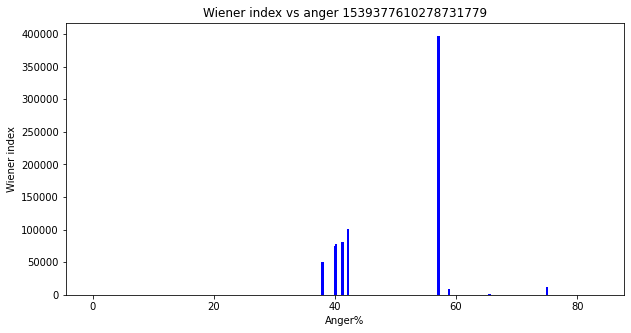

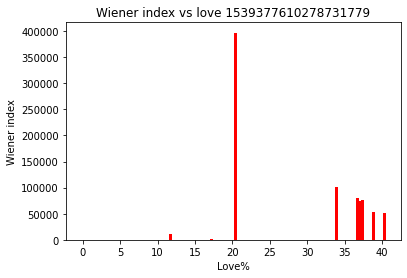

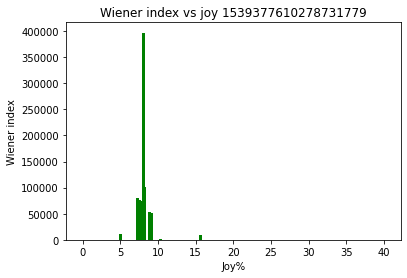

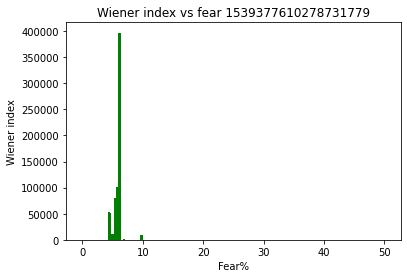

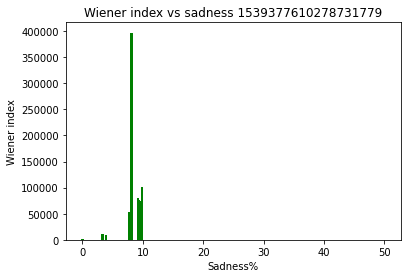

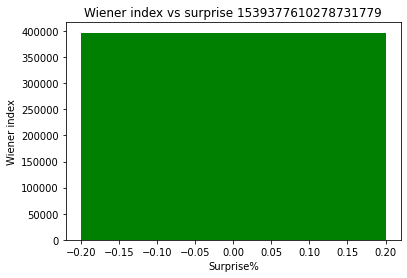

Average number of nodes in the reply tree of an influential node (Emotion-wise):  {'anger': 34.476190476190474, 'joy': 7.0, 'love': 25.833333333333332, 'sadness': 16.25, 'fear': 54.25}
Average direct responses to an influential node (Emotion-wise):  {'anger': 9.0, 'joy': 2.0, 'love': 4.166666666666667, 'sadness': 2.75, 'fear': 5.0}
Average length of the reply tree of an influential node (Emotion-wise):  {'anger': 7.333333333333333, 'joy': 4.0, 'love': 7.0, 'sadness': 6.75, 'fear': 13.0}
Average emotion distribution in influential nodes:  {'fear': 14.51446371472611, 'sadness': 13.211406470615293, 'anger': 59.59471457498763, 'love': 21.692188611784147, 'joy': 16.216568122235884}
Average number of users involved in an influential node: 4.026442622102303
Dict1: {'surprise': 0, 'love': 0, 'joy': 0, 'anger': 0, 'sadness': 0, 'fear': 1.0}
before loop, emotions_in_responses {'surprise': [], 'love': [], 'joy': [], 'anger': [], 'sadness': [], 'fear': []}
inside loop, emotions_in_responses {'surp

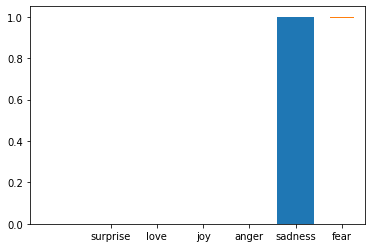

Dict1: {'surprise': 0, 'love': 0.07692307692307693, 'joy': 0.15384615384615385, 'anger': 0.6923076923076923, 'sadness': 0, 'fear': 0.07692307692307693}
before loop, emotions_in_responses {'surprise': [0, 0], 'love': [0, 0], 'joy': [0, 0], 'anger': [0, 0], 'sadness': [0, 0], 'fear': [1.0, 1.0]}
inside loop, emotions_in_responses {'surprise': [0, 0], 'love': [0, 0], 'joy': [0, 0], 'anger': [0, 0], 'sadness': [0, 0], 'fear': [1.0, 1.0]}
key surprise
value 0
current_value: [0, 0]
inside loop, emotions_in_responses {'surprise': [0, 0, 0, 0], 'love': [0, 0], 'joy': [0, 0], 'anger': [0, 0], 'sadness': [0, 0], 'fear': [1.0, 1.0]}
key love
value 0.07692307692307693
current_value: [0, 0]
inside loop, emotions_in_responses {'surprise': [0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693], 'joy': [0, 0], 'anger': [0, 0], 'sadness': [0, 0], 'fear': [1.0, 1.0]}
key joy
value 0.15384615384615385
current_value: [0, 0]
inside loop, emotions_in_responses {'surprise': [0, 0, 0, 0], 'lov

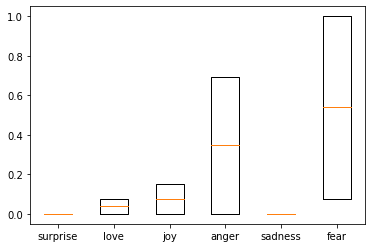

Dict1: {'surprise': 0, 'love': 0, 'joy': 0.3333333333333333, 'anger': 0.6666666666666666, 'sadness': 0, 'fear': 0}
before loop, emotions_in_responses {'surprise': [0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385], 'anger': [0, 0, 0.6923076923076923, 0.6923076923076923], 'sadness': [0, 0, 0, 0], 'fear': [1.0, 1.0, 0.07692307692307693, 0.07692307692307693]}
inside loop, emotions_in_responses {'surprise': [0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385], 'anger': [0, 0, 0.6923076923076923, 0.6923076923076923], 'sadness': [0, 0, 0, 0], 'fear': [1.0, 1.0, 0.07692307692307693, 0.07692307692307693]}
key surprise
value 0
current_value: [0, 0, 0, 0]
inside loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385], 'anger': [0

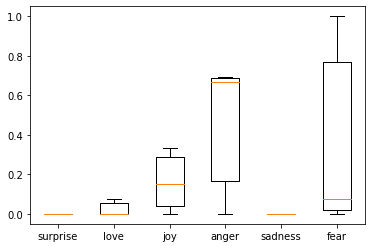

Dict1: {'surprise': 0, 'love': 0.06666666666666667, 'joy': 0.13333333333333333, 'anger': 0.7999999999999999, 'sadness': 0, 'fear': 0}
before loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385, 0.3333333333333333, 0.3333333333333333], 'anger': [0, 0, 0.6923076923076923, 0.6923076923076923, 0.6666666666666666, 0.6666666666666666], 'sadness': [0, 0, 0, 0, 0, 0], 'fear': [1.0, 1.0, 0.07692307692307693, 0.07692307692307693, 0, 0]}
inside loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385, 0.3333333333333333, 0.3333333333333333], 'anger': [0, 0, 0.6923076923076923, 0.6923076923076923, 0.6666666666666666, 0.6666666666666666], 'sadness': [0, 0, 0, 0, 0, 0], 'fear': [1.0, 1.0, 0.07692307692307693, 0.07692307692307693, 0, 0]}
key surprise
val

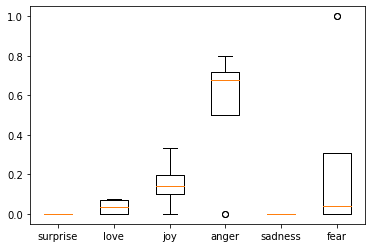

Dict1: {'surprise': 0, 'love': 0.3333333333333333, 'joy': 0.3333333333333333, 'anger': 0.3333333333333333, 'sadness': 0, 'fear': 0}
before loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0.06666666666666667, 0.06666666666666667], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333], 'anger': [0, 0, 0.6923076923076923, 0.6923076923076923, 0.6666666666666666, 0.6666666666666666, 0.7999999999999999, 0.7999999999999999], 'sadness': [0, 0, 0, 0, 0, 0, 0, 0], 'fear': [1.0, 1.0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0, 0]}
inside loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0.06666666666666667, 0.06666666666666667], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13

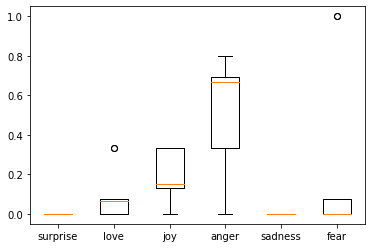

Dict1: {'surprise': 0, 'love': 0, 'joy': 0, 'anger': 1.0, 'sadness': 0, 'fear': 0}
before loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0.06666666666666667, 0.06666666666666667, 0.3333333333333333, 0.3333333333333333], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.3333333333333333, 0.3333333333333333], 'anger': [0, 0, 0.6923076923076923, 0.6923076923076923, 0.6666666666666666, 0.6666666666666666, 0.7999999999999999, 0.7999999999999999, 0.3333333333333333, 0.3333333333333333], 'sadness': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'fear': [1.0, 1.0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0, 0, 0, 0]}
inside loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0.06666666666666667, 0.06666666666666667, 0.3333333333333333, 0.33333

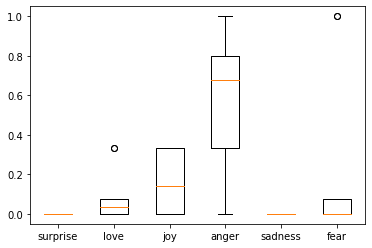

Dict1: {'surprise': 0, 'love': 0.09183673469387754, 'joy': 0.0510204081632653, 'anger': 0.7040816326530618, 'sadness': 0.08163265306122448, 'fear': 0.07142857142857142}
before loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0.06666666666666667, 0.06666666666666667, 0.3333333333333333, 0.3333333333333333, 0, 0], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.3333333333333333, 0.3333333333333333, 0, 0], 'anger': [0, 0, 0.6923076923076923, 0.6923076923076923, 0.6666666666666666, 0.6666666666666666, 0.7999999999999999, 0.7999999999999999, 0.3333333333333333, 0.3333333333333333, 1.0, 1.0], 'sadness': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'fear': [1.0, 1.0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0, 0, 0, 0, 0, 0]}
inside loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 

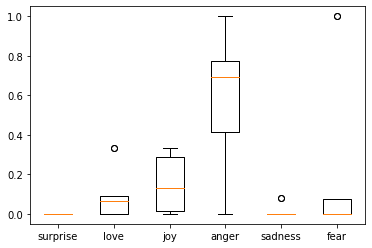

Dict1: {'surprise': 0, 'love': 0, 'joy': 0, 'anger': 0.6666666666666666, 'sadness': 0, 'fear': 0.3333333333333333}
before loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0.06666666666666667, 0.06666666666666667, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.09183673469387754, 0.09183673469387754], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.0510204081632653, 0.0510204081632653], 'anger': [0, 0, 0.6923076923076923, 0.6923076923076923, 0.6666666666666666, 0.6666666666666666, 0.7999999999999999, 0.7999999999999999, 0.3333333333333333, 0.3333333333333333, 1.0, 1.0, 0.7040816326530618, 0.7040816326530618], 'sadness': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.08163265306122448, 0.08163265306122448], 'fear': [1.0, 1.0, 0.07692307692307693, 0.07692307692307

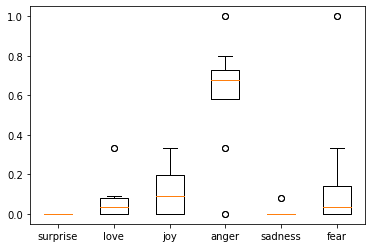

Dict1: {'surprise': 0, 'love': 0, 'joy': 0.3333333333333333, 'anger': 0.6666666666666666, 'sadness': 0, 'fear': 0}
before loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0.06666666666666667, 0.06666666666666667, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.09183673469387754, 0.09183673469387754, 0, 0], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.0510204081632653, 0.0510204081632653, 0, 0], 'anger': [0, 0, 0.6923076923076923, 0.6923076923076923, 0.6666666666666666, 0.6666666666666666, 0.7999999999999999, 0.7999999999999999, 0.3333333333333333, 0.3333333333333333, 1.0, 1.0, 0.7040816326530618, 0.7040816326530618, 0.6666666666666666, 0.6666666666666666], 'sadness': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.08163265306122448, 0.08163265306122448,

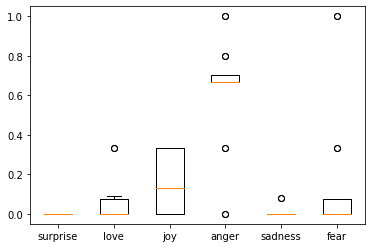

Dict1: {'surprise': 0, 'love': 0, 'joy': 0.13333333333333333, 'anger': 0.8666666666666666, 'sadness': 0, 'fear': 0}
before loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0.06666666666666667, 0.06666666666666667, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.09183673469387754, 0.09183673469387754, 0, 0, 0, 0], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.0510204081632653, 0.0510204081632653, 0, 0, 0.3333333333333333, 0.3333333333333333], 'anger': [0, 0, 0.6923076923076923, 0.6923076923076923, 0.6666666666666666, 0.6666666666666666, 0.7999999999999999, 0.7999999999999999, 0.3333333333333333, 0.3333333333333333, 1.0, 1.0, 0.7040816326530618, 0.7040816326530618, 0.6666666666666666, 0.6666666666666666, 0.6666666666666666, 0.666666666666666

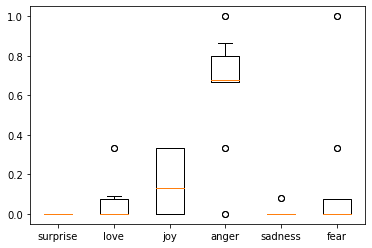

Dict1: {'surprise': 0, 'love': 0, 'joy': 0.5, 'anger': 0, 'sadness': 0, 'fear': 0.5}
before loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0.06666666666666667, 0.06666666666666667, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.09183673469387754, 0.09183673469387754, 0, 0, 0, 0, 0, 0], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.0510204081632653, 0.0510204081632653, 0, 0, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333], 'anger': [0, 0, 0.6923076923076923, 0.6923076923076923, 0.6666666666666666, 0.6666666666666666, 0.7999999999999999, 0.7999999999999999, 0.3333333333333333, 0.3333333333333333, 1.0, 1.0, 0.7040816326530618, 0.7040816326530618, 0.6666666666666666, 0.6666666666666666, 0.666666666666

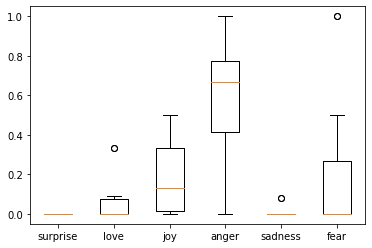

Dict1: {'surprise': 0, 'love': 0.2, 'joy': 0.2, 'anger': 0.6000000000000001, 'sadness': 0, 'fear': 0}
before loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0.06666666666666667, 0.06666666666666667, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.09183673469387754, 0.09183673469387754, 0, 0, 0, 0, 0, 0, 0, 0], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.0510204081632653, 0.0510204081632653, 0, 0, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.5, 0.5], 'anger': [0, 0, 0.6923076923076923, 0.6923076923076923, 0.6666666666666666, 0.6666666666666666, 0.7999999999999999, 0.7999999999999999, 0.3333333333333333, 0.3333333333333333, 1.0, 1.0, 0.7040816326530618, 0.7040816326530618, 0.6666666666666

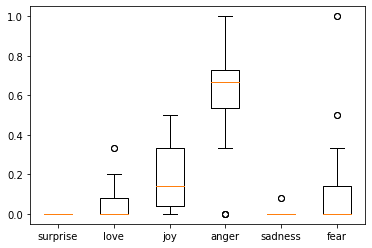

Dict1: {'surprise': 0, 'love': 0.5, 'joy': 0, 'anger': 0, 'sadness': 0, 'fear': 0.5}
before loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0.06666666666666667, 0.06666666666666667, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.09183673469387754, 0.09183673469387754, 0, 0, 0, 0, 0, 0, 0, 0, 0.2, 0.2], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.0510204081632653, 0.0510204081632653, 0, 0, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.5, 0.5, 0.2, 0.2], 'anger': [0, 0, 0.6923076923076923, 0.6923076923076923, 0.6666666666666666, 0.6666666666666666, 0.7999999999999999, 0.7999999999999999, 0.3333333333333333, 0.3333333333333333, 1.0, 1.0, 0.7040816326530618, 0.7040816326530618, 0.6666

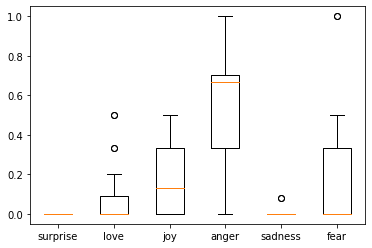

Dict1: {'surprise': 0, 'love': 0, 'joy': 0, 'anger': 1.0, 'sadness': 0, 'fear': 0}
before loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0.06666666666666667, 0.06666666666666667, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.09183673469387754, 0.09183673469387754, 0, 0, 0, 0, 0, 0, 0, 0, 0.2, 0.2, 0.5, 0.5], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.0510204081632653, 0.0510204081632653, 0, 0, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.5, 0.5, 0.2, 0.2, 0, 0], 'anger': [0, 0, 0.6923076923076923, 0.6923076923076923, 0.6666666666666666, 0.6666666666666666, 0.7999999999999999, 0.7999999999999999, 0.3333333333333333, 0.3333333333333333, 1.0, 1.0, 0.7040816326530618, 0.7040

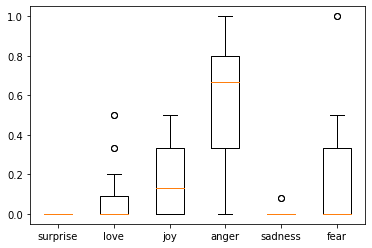

Dict1: {'surprise': 0, 'love': 0, 'joy': 0, 'anger': 1.0, 'sadness': 0, 'fear': 0}
before loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0.06666666666666667, 0.06666666666666667, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.09183673469387754, 0.09183673469387754, 0, 0, 0, 0, 0, 0, 0, 0, 0.2, 0.2, 0.5, 0.5, 0, 0], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.0510204081632653, 0.0510204081632653, 0, 0, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.5, 0.5, 0.2, 0.2, 0, 0, 0, 0], 'anger': [0, 0, 0.6923076923076923, 0.6923076923076923, 0.6666666666666666, 0.6666666666666666, 0.7999999999999999, 0.7999999999999999, 0.3333333333333333, 0.3333333333333333, 1.0, 1.0, 0.704081

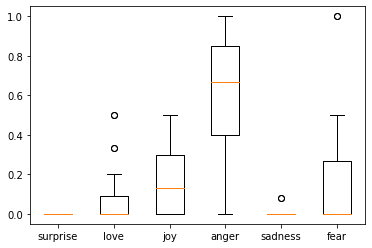

Dict1: {'surprise': 0, 'love': 0, 'joy': 0, 'anger': 1.0, 'sadness': 0, 'fear': 0}
before loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0.06666666666666667, 0.06666666666666667, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.09183673469387754, 0.09183673469387754, 0, 0, 0, 0, 0, 0, 0, 0, 0.2, 0.2, 0.5, 0.5, 0, 0, 0, 0], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.0510204081632653, 0.0510204081632653, 0, 0, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.5, 0.5, 0.2, 0.2, 0, 0, 0, 0, 0, 0], 'anger': [0, 0, 0.6923076923076923, 0.6923076923076923, 0.6666666666666666, 0.6666666666666666, 0.7999999999999999, 0.7999999999999999, 0.3333333333333333, 0.3333333333333333, 

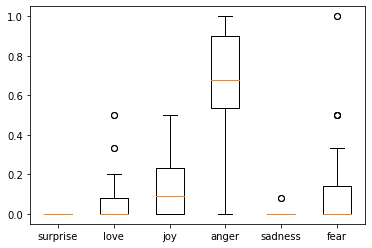

Dict1: {'surprise': 0, 'love': 0.5, 'joy': 0.5, 'anger': 0, 'sadness': 0, 'fear': 0}
before loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0.06666666666666667, 0.06666666666666667, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.09183673469387754, 0.09183673469387754, 0, 0, 0, 0, 0, 0, 0, 0, 0.2, 0.2, 0.5, 0.5, 0, 0, 0, 0, 0, 0], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.0510204081632653, 0.0510204081632653, 0, 0, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.5, 0.5, 0.2, 0.2, 0, 0, 0, 0, 0, 0, 0, 0], 'anger': [0, 0, 0.6923076923076923, 0.6923076923076923, 0.6666666666666666, 0.6666666666666666, 0.7999999999999999, 0.7999999999999999, 0.3333333333333333, 

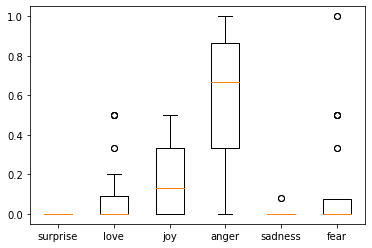

Dict1: {'surprise': 0, 'love': 0.16666666666666666, 'joy': 0.3333333333333333, 'anger': 0.3333333333333333, 'sadness': 0, 'fear': 0.16666666666666666}
before loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0.06666666666666667, 0.06666666666666667, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.09183673469387754, 0.09183673469387754, 0, 0, 0, 0, 0, 0, 0, 0, 0.2, 0.2, 0.5, 0.5, 0, 0, 0, 0, 0, 0, 0.5, 0.5], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.0510204081632653, 0.0510204081632653, 0, 0, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.5, 0.5, 0.2, 0.2, 0, 0, 0, 0, 0, 0, 0, 0, 0.5, 0.5], 'anger': [0, 0, 0.6923076923076923, 0.6923076923076923, 0.666666

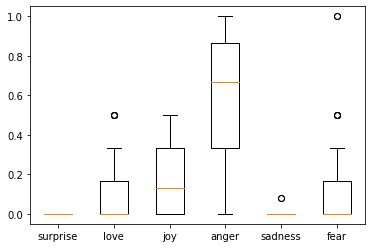

Dict1: {'surprise': 0, 'love': 0, 'joy': 0.25, 'anger': 0.5, 'sadness': 0.25, 'fear': 0}
before loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0.06666666666666667, 0.06666666666666667, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.09183673469387754, 0.09183673469387754, 0, 0, 0, 0, 0, 0, 0, 0, 0.2, 0.2, 0.5, 0.5, 0, 0, 0, 0, 0, 0, 0.5, 0.5, 0.16666666666666666, 0.16666666666666666], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.0510204081632653, 0.0510204081632653, 0, 0, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.5, 0.5, 0.2, 0.2, 0, 0, 0, 0, 0, 0, 0, 0, 0.5, 0.5, 0.3333333333333333, 0.3333333333333333], 'anger': [0, 0, 0.6923076923076923, 0.

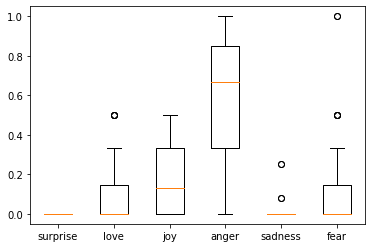

Dict1: {'surprise': 0, 'love': 0.08333333333333333, 'joy': 0, 'anger': 0.8333333333333334, 'sadness': 0.08333333333333333, 'fear': 0}
before loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0.06666666666666667, 0.06666666666666667, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.09183673469387754, 0.09183673469387754, 0, 0, 0, 0, 0, 0, 0, 0, 0.2, 0.2, 0.5, 0.5, 0, 0, 0, 0, 0, 0, 0.5, 0.5, 0.16666666666666666, 0.16666666666666666, 0, 0], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.0510204081632653, 0.0510204081632653, 0, 0, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.5, 0.5, 0.2, 0.2, 0, 0, 0, 0, 0, 0, 0, 0, 0.5, 0.5, 0.3333333333333333, 0.

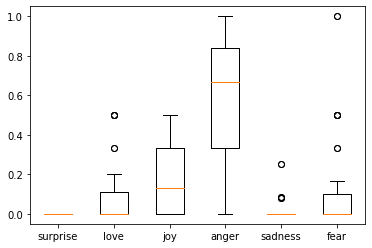

Dict1: {'surprise': 0, 'love': 0.5, 'joy': 0, 'anger': 0.5, 'sadness': 0, 'fear': 0}
before loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0.06666666666666667, 0.06666666666666667, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.09183673469387754, 0.09183673469387754, 0, 0, 0, 0, 0, 0, 0, 0, 0.2, 0.2, 0.5, 0.5, 0, 0, 0, 0, 0, 0, 0.5, 0.5, 0.16666666666666666, 0.16666666666666666, 0, 0, 0.08333333333333333, 0.08333333333333333], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.0510204081632653, 0.0510204081632653, 0, 0, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.5, 0.5, 0.2, 0.2, 0, 0, 0, 0, 0, 0, 0, 0, 0.5, 0.5, 0.3333333333333333, 0.3

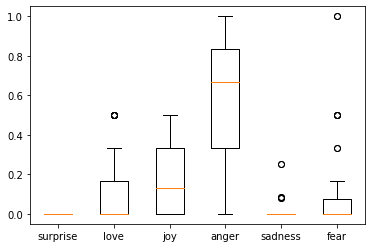

Dict1: {'surprise': 0, 'love': 0.14285714285714285, 'joy': 0.14285714285714285, 'anger': 0.7142857142857142, 'sadness': 0, 'fear': 0}
before loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0.06666666666666667, 0.06666666666666667, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.09183673469387754, 0.09183673469387754, 0, 0, 0, 0, 0, 0, 0, 0, 0.2, 0.2, 0.5, 0.5, 0, 0, 0, 0, 0, 0, 0.5, 0.5, 0.16666666666666666, 0.16666666666666666, 0, 0, 0.08333333333333333, 0.08333333333333333, 0.5, 0.5], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.0510204081632653, 0.0510204081632653, 0, 0, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.5, 0.5, 0.

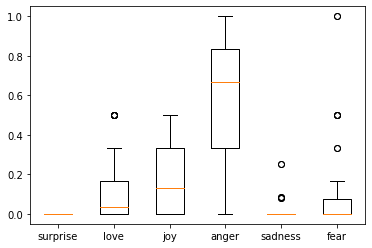

Dict1: {'surprise': 0, 'love': 0, 'joy': 0, 'anger': 1.0, 'sadness': 0, 'fear': 0}
before loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0.06666666666666667, 0.06666666666666667, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.09183673469387754, 0.09183673469387754, 0, 0, 0, 0, 0, 0, 0, 0, 0.2, 0.2, 0.5, 0.5, 0, 0, 0, 0, 0, 0, 0.5, 0.5, 0.16666666666666666, 0.16666666666666666, 0, 0, 0.08333333333333333, 0.08333333333333333, 0.5, 0.5, 0.14285714285714285, 0.14285714285714285], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.0510204081632653, 0.0510204081632653, 0, 0, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.5, 0.5, 0.2, 

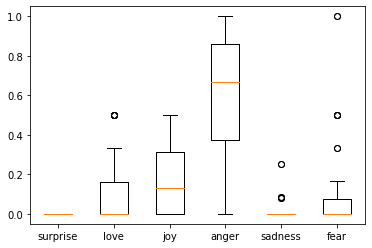

Dict1: {'surprise': 0, 'love': 0.4, 'joy': 0, 'anger': 0.4, 'sadness': 0, 'fear': 0.2}
before loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0.06666666666666667, 0.06666666666666667, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.09183673469387754, 0.09183673469387754, 0, 0, 0, 0, 0, 0, 0, 0, 0.2, 0.2, 0.5, 0.5, 0, 0, 0, 0, 0, 0, 0.5, 0.5, 0.16666666666666666, 0.16666666666666666, 0, 0, 0.08333333333333333, 0.08333333333333333, 0.5, 0.5, 0.14285714285714285, 0.14285714285714285, 0, 0], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.0510204081632653, 0.0510204081632653, 0, 0, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333,

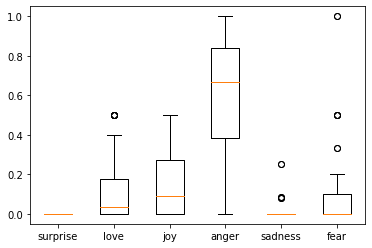

Dict1: {'surprise': 0, 'love': 0, 'joy': 0, 'anger': 0.6666666666666666, 'sadness': 0, 'fear': 0.3333333333333333}
before loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0.06666666666666667, 0.06666666666666667, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.09183673469387754, 0.09183673469387754, 0, 0, 0, 0, 0, 0, 0, 0, 0.2, 0.2, 0.5, 0.5, 0, 0, 0, 0, 0, 0, 0.5, 0.5, 0.16666666666666666, 0.16666666666666666, 0, 0, 0.08333333333333333, 0.08333333333333333, 0.5, 0.5, 0.14285714285714285, 0.14285714285714285, 0, 0, 0.4, 0.4], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.0510204081632653, 0.0510204081632653, 0, 0, 0.3333333333333333, 0.333333333333333

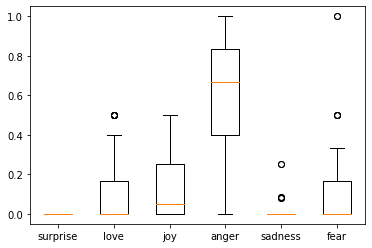

Dict1: {'surprise': 0, 'love': 0, 'joy': 0, 'anger': 0.3333333333333333, 'sadness': 0.3333333333333333, 'fear': 0.3333333333333333}
before loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0.06666666666666667, 0.06666666666666667, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.09183673469387754, 0.09183673469387754, 0, 0, 0, 0, 0, 0, 0, 0, 0.2, 0.2, 0.5, 0.5, 0, 0, 0, 0, 0, 0, 0.5, 0.5, 0.16666666666666666, 0.16666666666666666, 0, 0, 0.08333333333333333, 0.08333333333333333, 0.5, 0.5, 0.14285714285714285, 0.14285714285714285, 0, 0, 0.4, 0.4, 0, 0], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.0510204081632653, 0.0510204081632653, 0, 0, 0.333333

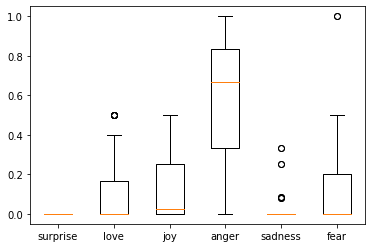

Dict1: {'surprise': 0, 'love': 0.5, 'joy': 0, 'anger': 0.5, 'sadness': 0, 'fear': 0}
before loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0.06666666666666667, 0.06666666666666667, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.09183673469387754, 0.09183673469387754, 0, 0, 0, 0, 0, 0, 0, 0, 0.2, 0.2, 0.5, 0.5, 0, 0, 0, 0, 0, 0, 0.5, 0.5, 0.16666666666666666, 0.16666666666666666, 0, 0, 0.08333333333333333, 0.08333333333333333, 0.5, 0.5, 0.14285714285714285, 0.14285714285714285, 0, 0, 0.4, 0.4, 0, 0, 0, 0], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.0510204081632653, 0.0510204081632653, 0, 0, 0.3333333333333333, 0.3333333333333333, 0.1

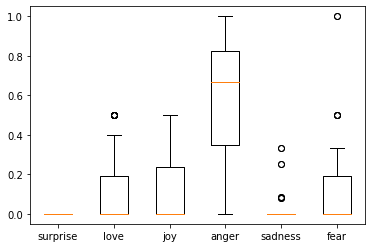

Dict1: {'surprise': 0, 'love': 0, 'joy': 0, 'anger': 1.0, 'sadness': 0, 'fear': 0}
before loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0.06666666666666667, 0.06666666666666667, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.09183673469387754, 0.09183673469387754, 0, 0, 0, 0, 0, 0, 0, 0, 0.2, 0.2, 0.5, 0.5, 0, 0, 0, 0, 0, 0, 0.5, 0.5, 0.16666666666666666, 0.16666666666666666, 0, 0, 0.08333333333333333, 0.08333333333333333, 0.5, 0.5, 0.14285714285714285, 0.14285714285714285, 0, 0, 0.4, 0.4, 0, 0, 0, 0, 0.5, 0.5], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.0510204081632653, 0.0510204081632653, 0, 0, 0.3333333333333333, 0.3333333

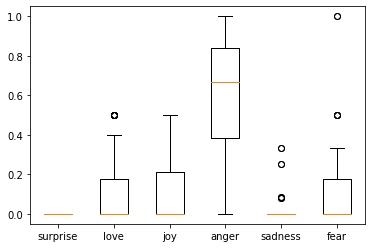

Dict1: {'surprise': 0, 'love': 0, 'joy': 0.5, 'anger': 0.5, 'sadness': 0, 'fear': 0}
before loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0.06666666666666667, 0.06666666666666667, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.09183673469387754, 0.09183673469387754, 0, 0, 0, 0, 0, 0, 0, 0, 0.2, 0.2, 0.5, 0.5, 0, 0, 0, 0, 0, 0, 0.5, 0.5, 0.16666666666666666, 0.16666666666666666, 0, 0, 0.08333333333333333, 0.08333333333333333, 0.5, 0.5, 0.14285714285714285, 0.14285714285714285, 0, 0, 0.4, 0.4, 0, 0, 0, 0, 0.5, 0.5, 0, 0], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.0510204081632653, 0.0510204081632653, 0, 0, 0.3333333333333

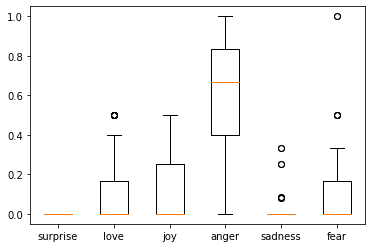

Dict1: {'surprise': 0, 'love': 0, 'joy': 0, 'anger': 0.75, 'sadness': 0.25, 'fear': 0}
before loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0.06666666666666667, 0.06666666666666667, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.09183673469387754, 0.09183673469387754, 0, 0, 0, 0, 0, 0, 0, 0, 0.2, 0.2, 0.5, 0.5, 0, 0, 0, 0, 0, 0, 0.5, 0.5, 0.16666666666666666, 0.16666666666666666, 0, 0, 0.08333333333333333, 0.08333333333333333, 0.5, 0.5, 0.14285714285714285, 0.14285714285714285, 0, 0, 0.4, 0.4, 0, 0, 0, 0, 0.5, 0.5, 0, 0, 0, 0], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.0510204081632653, 0.0510204081632653, 0, 0, 0

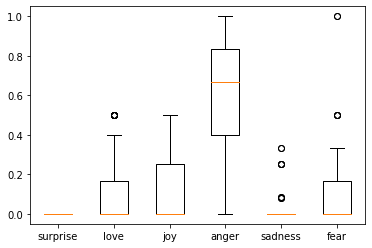

Dict1: {'surprise': 0, 'love': 0, 'joy': 0, 'anger': 1.0, 'sadness': 0, 'fear': 0}
before loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0.06666666666666667, 0.06666666666666667, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.09183673469387754, 0.09183673469387754, 0, 0, 0, 0, 0, 0, 0, 0, 0.2, 0.2, 0.5, 0.5, 0, 0, 0, 0, 0, 0, 0.5, 0.5, 0.16666666666666666, 0.16666666666666666, 0, 0, 0.08333333333333333, 0.08333333333333333, 0.5, 0.5, 0.14285714285714285, 0.14285714285714285, 0, 0, 0.4, 0.4, 0, 0, 0, 0, 0.5, 0.5, 0, 0, 0, 0, 0, 0], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.0510204081632653, 0.0510204081632653,

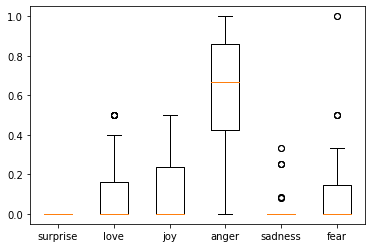

Dict1: {'surprise': 0, 'love': 0.5, 'joy': 0, 'anger': 0.5, 'sadness': 0, 'fear': 0}
before loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0.06666666666666667, 0.06666666666666667, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.09183673469387754, 0.09183673469387754, 0, 0, 0, 0, 0, 0, 0, 0, 0.2, 0.2, 0.5, 0.5, 0, 0, 0, 0, 0, 0, 0.5, 0.5, 0.16666666666666666, 0.16666666666666666, 0, 0, 0.08333333333333333, 0.08333333333333333, 0.5, 0.5, 0.14285714285714285, 0.14285714285714285, 0, 0, 0.4, 0.4, 0, 0, 0, 0, 0.5, 0.5, 0, 0, 0, 0, 0, 0, 0, 0], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.0510204081632653, 0.051

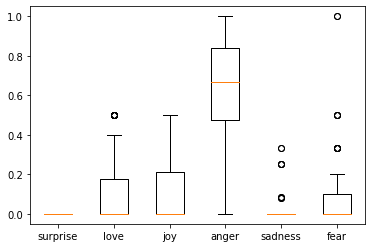

Dict1: {'surprise': 0, 'love': 0, 'joy': 0, 'anger': 0.5, 'sadness': 0.5, 'fear': 0}
before loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0.06666666666666667, 0.06666666666666667, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.09183673469387754, 0.09183673469387754, 0, 0, 0, 0, 0, 0, 0, 0, 0.2, 0.2, 0.5, 0.5, 0, 0, 0, 0, 0, 0, 0.5, 0.5, 0.16666666666666666, 0.16666666666666666, 0, 0, 0.08333333333333333, 0.08333333333333333, 0.5, 0.5, 0.14285714285714285, 0.14285714285714285, 0, 0, 0.4, 0.4, 0, 0, 0, 0, 0.5, 0.5, 0, 0, 0, 0, 0, 0, 0, 0, 0.5, 0.5], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.0510204

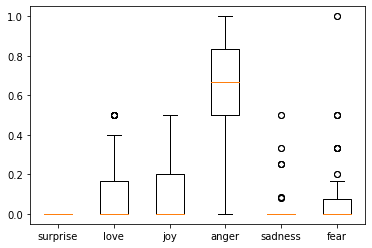

Dict1: {'surprise': 0, 'love': 0.25, 'joy': 0, 'anger': 0.75, 'sadness': 0, 'fear': 0}
before loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0.06666666666666667, 0.06666666666666667, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.09183673469387754, 0.09183673469387754, 0, 0, 0, 0, 0, 0, 0, 0, 0.2, 0.2, 0.5, 0.5, 0, 0, 0, 0, 0, 0, 0.5, 0.5, 0.16666666666666666, 0.16666666666666666, 0, 0, 0.08333333333333333, 0.08333333333333333, 0.5, 0.5, 0.14285714285714285, 0.14285714285714285, 0, 0, 0.4, 0.4, 0, 0, 0, 0, 0.5, 0.5, 0, 0, 0, 0, 0, 0, 0, 0, 0.5, 0.5, 0, 0], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.3333333333333333, 0.3333333333333333, 0

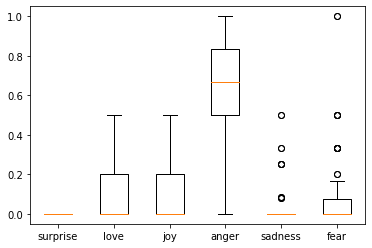

Dict1: {'surprise': 0, 'love': 0, 'joy': 0, 'anger': 1.0, 'sadness': 0, 'fear': 0}
before loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0.06666666666666667, 0.06666666666666667, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.09183673469387754, 0.09183673469387754, 0, 0, 0, 0, 0, 0, 0, 0, 0.2, 0.2, 0.5, 0.5, 0, 0, 0, 0, 0, 0, 0.5, 0.5, 0.16666666666666666, 0.16666666666666666, 0, 0, 0.08333333333333333, 0.08333333333333333, 0.5, 0.5, 0.14285714285714285, 0.14285714285714285, 0, 0, 0.4, 0.4, 0, 0, 0, 0, 0.5, 0.5, 0, 0, 0, 0, 0, 0, 0, 0, 0.5, 0.5, 0, 0, 0.25, 0.25], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.3333333333333333, 0.33333

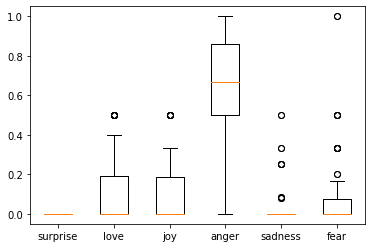

Dict1: {'surprise': 0, 'love': 0.5, 'joy': 0.5, 'anger': 0, 'sadness': 0, 'fear': 0}
before loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0.06666666666666667, 0.06666666666666667, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.09183673469387754, 0.09183673469387754, 0, 0, 0, 0, 0, 0, 0, 0, 0.2, 0.2, 0.5, 0.5, 0, 0, 0, 0, 0, 0, 0.5, 0.5, 0.16666666666666666, 0.16666666666666666, 0, 0, 0.08333333333333333, 0.08333333333333333, 0.5, 0.5, 0.14285714285714285, 0.14285714285714285, 0, 0, 0.4, 0.4, 0, 0, 0, 0, 0.5, 0.5, 0, 0, 0, 0, 0, 0, 0, 0, 0.5, 0.5, 0, 0, 0.25, 0.25, 0, 0], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.33333333333

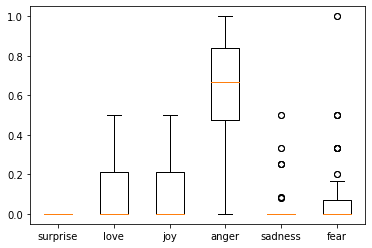

Dict1: {'surprise': 0, 'love': 0.5, 'joy': 0, 'anger': 0.5, 'sadness': 0, 'fear': 0}
before loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0.06666666666666667, 0.06666666666666667, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.09183673469387754, 0.09183673469387754, 0, 0, 0, 0, 0, 0, 0, 0, 0.2, 0.2, 0.5, 0.5, 0, 0, 0, 0, 0, 0, 0.5, 0.5, 0.16666666666666666, 0.16666666666666666, 0, 0, 0.08333333333333333, 0.08333333333333333, 0.5, 0.5, 0.14285714285714285, 0.14285714285714285, 0, 0, 0.4, 0.4, 0, 0, 0, 0, 0.5, 0.5, 0, 0, 0, 0, 0, 0, 0, 0, 0.5, 0.5, 0, 0, 0.25, 0.25, 0, 0, 0.5, 0.5], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.1333333333333333

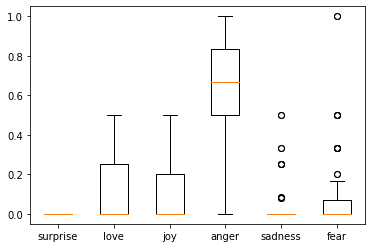

Dict1: {'surprise': 0, 'love': 0.3333333333333333, 'joy': 0, 'anger': 0.3333333333333333, 'sadness': 0, 'fear': 0.3333333333333333}
before loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0.06666666666666667, 0.06666666666666667, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.09183673469387754, 0.09183673469387754, 0, 0, 0, 0, 0, 0, 0, 0, 0.2, 0.2, 0.5, 0.5, 0, 0, 0, 0, 0, 0, 0.5, 0.5, 0.16666666666666666, 0.16666666666666666, 0, 0, 0.08333333333333333, 0.08333333333333333, 0.5, 0.5, 0.14285714285714285, 0.14285714285714285, 0, 0, 0.4, 0.4, 0, 0, 0, 0, 0.5, 0.5, 0, 0, 0, 0, 0, 0, 0, 0, 0.5, 0.5, 0, 0, 0.25, 0.25, 0, 0, 0.5, 0.5, 0.5, 0.5], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385, 0.33333333333333

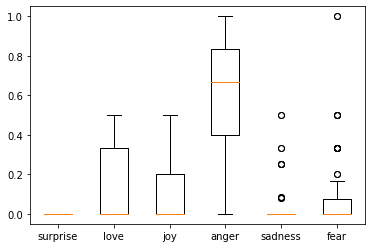

Dict1: {'surprise': 0, 'love': 0, 'joy': 0, 'anger': 1.0, 'sadness': 0, 'fear': 0}
before loop, emotions_in_responses {'surprise': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0.06666666666666667, 0.06666666666666667, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.09183673469387754, 0.09183673469387754, 0, 0, 0, 0, 0, 0, 0, 0, 0.2, 0.2, 0.5, 0.5, 0, 0, 0, 0, 0, 0, 0.5, 0.5, 0.16666666666666666, 0.16666666666666666, 0, 0, 0.08333333333333333, 0.08333333333333333, 0.5, 0.5, 0.14285714285714285, 0.14285714285714285, 0, 0, 0.4, 0.4, 0, 0, 0, 0, 0.5, 0.5, 0, 0, 0, 0, 0, 0, 0, 0, 0.5, 0.5, 0, 0, 0.25, 0.25, 0, 0, 0.5, 0.5, 0.5, 0.5, 0.3333333333333333, 0.3333333333333333], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385, 0.3333333333333333,

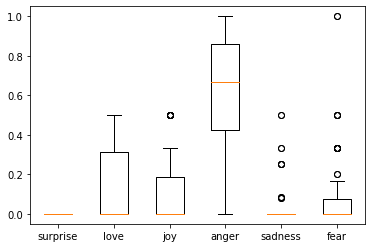

Emotions in responses {'surprise': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'love': [0, 0, 0.07692307692307693, 0.07692307692307693, 0, 0, 0.06666666666666667, 0.06666666666666667, 0.3333333333333333, 0.3333333333333333, 0, 0, 0.09183673469387754, 0.09183673469387754, 0, 0, 0, 0, 0, 0, 0, 0, 0.2, 0.2, 0.5, 0.5, 0, 0, 0, 0, 0, 0, 0.5, 0.5, 0.16666666666666666, 0.16666666666666666, 0, 0, 0.08333333333333333, 0.08333333333333333, 0.5, 0.5, 0.14285714285714285, 0.14285714285714285, 0, 0, 0.4, 0.4, 0, 0, 0, 0, 0.5, 0.5, 0, 0, 0, 0, 0, 0, 0, 0, 0.5, 0.5, 0, 0, 0.25, 0.25, 0, 0, 0.5, 0.5, 0.5, 0.5, 0.3333333333333333, 0.3333333333333333, 0, 0], 'joy': [0, 0, 0.15384615384615385, 0.15384615384615385, 0.3333333333333333, 0.3333333333333333, 0.13333333333333333, 0.13333333333333333, 0.3333333333333333, 0

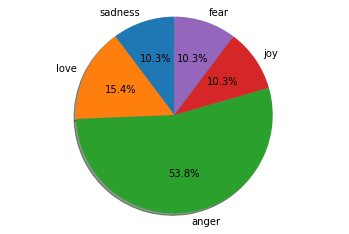

Propagated emotion:


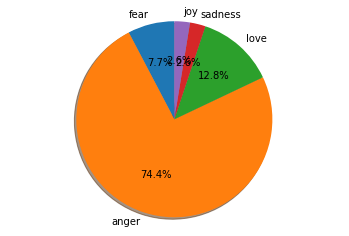

Higher than 60
[('id_8e5702f6dfbac3746625f59a35eefeb2', 1084), ('id_930f9e2ec1772fc1a801990e6505e1bc', 98), ('id_66dc0469afad92b10577699583b5bb57', 35), ('id_117721750ac7c7418a1023c1d676d15e', 31), ('id_60a0857b79f7cc5bc870f8c729109878', 30), ('id_023779d27d71387efd11ffa40fa8c38b', 18), ('id_5d05e921f4cdca87458b4559093712c3', 15), ('id_a374a2b772a899c18842b376b9cdd435', 15), ('id_9ca09d09604638b9bc102ef92051c186', 15), ('id_f8caa64b40f7324c83fe7e1dc55474cf', 13), ('id_9dde379ef050b188ccaffcc0f7d23caa', 13), ('id_1757d443623513037590e1e946fa5bf2', 12), ('id_afb218ee049a7362fd1d33986d2a3f17', 12), ('id_608202f042818e0f9168da091b9c7e35', 10), ('id_46c7e9f4c6a452771529e23cdde46463', 9), ('id_7d9c2741b94cf6338ab2b385e2e2e910', 9), ('id_ec389446b8b558801c6f703360e172b2', 9), ('id_a546dcc5d76aab4fd3671fce9ed0a7f3', 8), ('id_bc3234f161d8e1c3ba3bcd8502dfc581', 8), ('id_bd360e35ed41115131b9fab3d1a09fda', 8), ('id_91347ae789b4ef55069b14523a67f6ea', 7), ('id_03861e8e174578f6da2755354bd39b20', 7), 

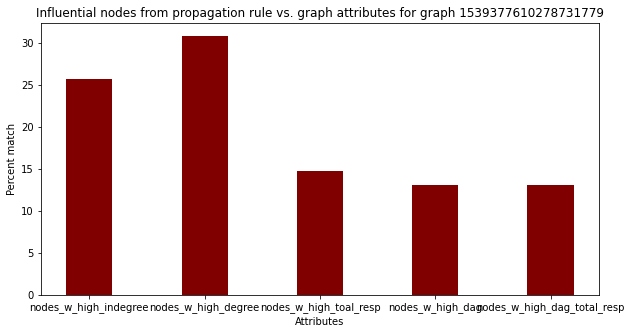

Emotion distribution across nodes: Counter({'anger': 1945, 'love': 395, 'joy': 299, 'sadness': 162, 'fear': 133})
Percentage distribution: [('anger', 66.29175187457396), ('love', 13.462849352419903), ('fear', 4.533060668029993), ('joy', 10.190865712338105), ('sadness', 5.521472392638037)]
{'eigen_v': 0.9714628995445884, 'distance_from_root': 0, 'type_of_node': 'R', 'type_of_node_factor': 1, 'page_rank': 0.14989888135933885, 'influential': 1, 'influence_factor': 0, 'total_responses': 1558, 'longest_path_length': 30.0, 'longest_path_length_total_Resp': 46740.0, 'emotion_board': {'surprise': 1, 'love': 9.36296071222982, 'joy': 3.86655926661599, 'anger': 49.91929441550781, 'sadness': 2.9234616893107708, 'fear': 6.742589636070612}, 'emotion_highest_score': 'anger'}


In [42]:
for key, value in data.items():
  if str(1539377610278731779) == key:
    print("Graph: ", key)
    print("Number of nodes: ", value.number_of_nodes())
    print("Number of edges: ", value.number_of_edges())
    G = emotional_impact_without_emotion_score(value, key)
  ##############################
  # before printing the bar chart, print emotion percentages of the inf node

Graph:  1490146802309668867
Number of nodes:  3971
Number of edges:  3727
Emotion distribution across nodes: Counter({'anger': 2509, 'love': 445, 'joy': 385, 'sadness': 216, 'fear': 172})
Percentage distribution: [('anger', 67.31955996780252), ('sadness', 5.795546015562114), ('love', 11.939898041320095), ('joy', 10.330024148108398), ('fear', 4.614971827206869)]
Number of influential nodes for the root node:  86
Number of ststistical influential nodes for the root node:  5
{'eigen_v': 0.9527134459094752, 'distance_from_root': 0, 'type_of_node': 'R', 'type_of_node_factor': 1, 'page_rank': 0.21923112856655502, 'influential': 1, 'influence_factor': 0}
Percentage distribution: [('anger', 78.94736842105263), ('joy', 10.526315789473683), ('love', 10.526315789473683)]
wiener_index 414.0
Depth 3.0
Number of connected components: 1
Percentage distribution: [('anger', 78.94736842105263), ('joy', 10.526315789473683), ('love', 10.526315789473683)]
wiener_index 414.0
Depth 3.0
Number of connected co

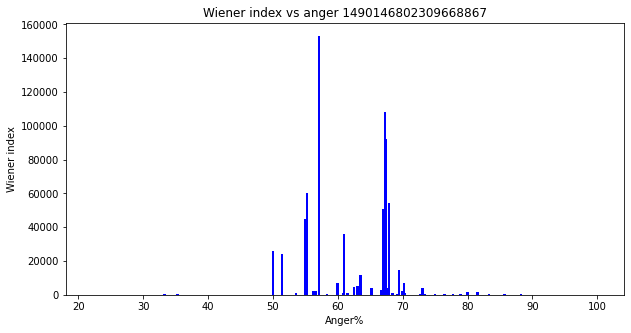

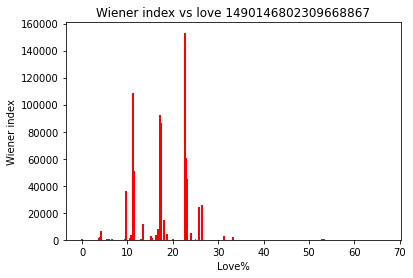

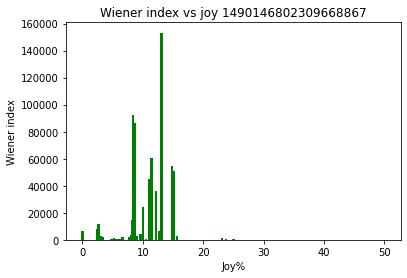

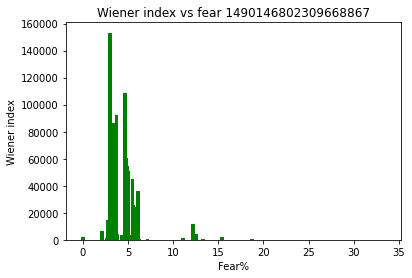

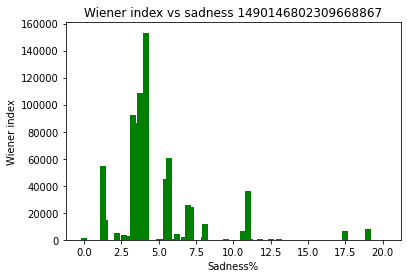

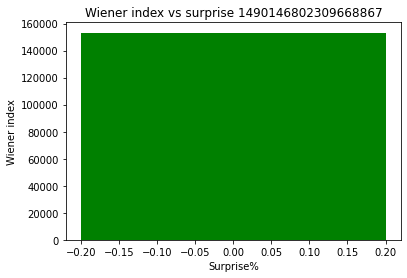

Average number of nodes in the reply tree of an influential node (Emotion-wise):  {'anger': 25.934426229508198, 'joy': 51.6, 'love': 51.142857142857146, 'sadness': 21.5, 'fear': 20.166666666666668}
Average direct responses to an influential node (Emotion-wise):  {'anger': 6.655737704918033, 'joy': 9.8, 'love': 25.857142857142858, 'sadness': 2.5, 'fear': 5.0}
Average length of the reply tree of an influential node (Emotion-wise):  {'anger': 6.836065573770492, 'joy': 14.7, 'love': 6.285714285714286, 'sadness': 11.0, 'fear': 6.0}
Average emotion distribution in influential nodes:  {'anger': 64.79410407394221, 'joy': 13.408399303022804, 'love': 19.32593961034478, 'fear': 9.05783462315783, 'sadness': 8.993911956824833}
Average number of users involved in an influential node: 2.3561215790911905


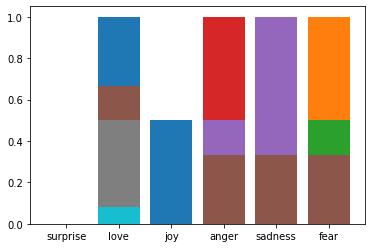

Original emotion:


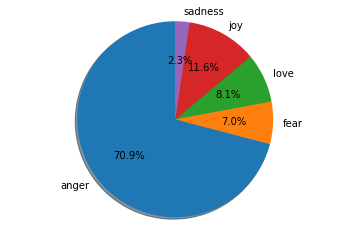

Propagated emotion:


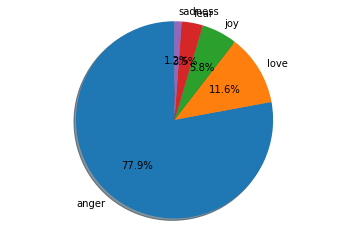

Higher than 60
[('id_3071f534bba78c0eec9cd3eb19cead6d', 1709), ('id_1d13dde1ba20b66253b4841359a71e6b', 123), ('id_fbf7d9cbf648b7866ae97303883087bf', 39), ('id_022cbe2a7f1f54ca36e1dae00e726f1e', 30), ('id_2804a5c796ef326cdc81a6a9c940dc4c', 27), ('id_f025fe57e61e74da1fd1d863cdc8b6bc', 26), ('id_cb8caf40127bbdf2801fe8182a9fe001', 23), ('id_b2350867a809ccf7c72cbffe59dfa095', 21), ('id_31f214d947a1438bd6b28a72fe39d3c8', 20), ('id_1ca20de3b4352856040c516fc7267e90', 18), ('id_82979a4312cdbd3a271ad70aa7495efa', 17), ('id_3e5bc2bfe001e76ed2aa266d3a746ee7', 15), ('id_cb40b2d7e2f3fcaff7b4609f277187fe', 14), ('id_982716990f264773c312fff3c0de6ee9', 14), ('id_b4feff15b217283b82549a1b3c08143b', 13), ('id_c08f717432a3397366fa79614a71417c', 13), ('id_6a5bcf3232a4c500d7b084a9db3c3352', 12), ('id_0ff3b4e52210941f6eef73b53aeb0afb', 12), ('id_6e4caf9e23052d7afe8fc28a9c4a5b31', 12), ('id_74680cc9f8e3c47d292cf257cd2ca261', 12), ('id_cf521da31d042aee9a7d696e9a99c9d2', 11), ('id_7843efa9f7cca3e00365c17184426e1

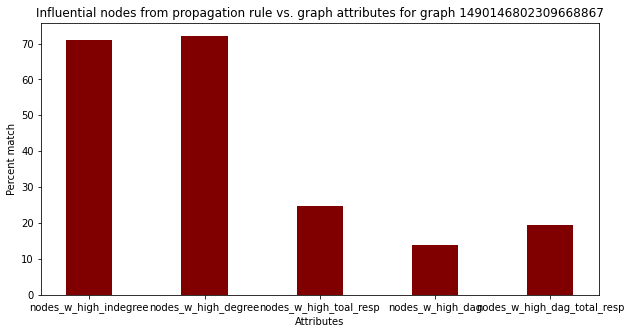

Emotion distribution across nodes: Counter({'anger': 2509, 'love': 445, 'joy': 385, 'sadness': 216, 'fear': 172})
Percentage distribution: [('anger', 67.31955996780252), ('sadness', 5.795546015562114), ('love', 11.939898041320095), ('joy', 10.330024148108398), ('fear', 4.614971827206869)]
{'eigen_v': 0.9527134459094752, 'distance_from_root': 0, 'type_of_node': 'R', 'type_of_node_factor': 1, 'page_rank': 0.21923112856655502, 'influential': 1, 'influence_factor': 0, 'total_responses': 3150, 'longest_path_length': 49.0, 'longest_path_length_total_Resp': 154350.0, 'emotion_board': {'surprise': 1, 'love': 51.61369496508173, 'joy': 11.726842417092891, 'anger': 127.36283325251429, 'sadness': 3.8734323423314616, 'fear': 7.4811775477706055}, 'emotion_highest_score': 'anger'}
Graph:  1534718570504273920
Number of nodes:  2066
Number of edges:  1973
Emotion distribution across nodes: Counter({'anger': 1227, 'love': 290, 'joy': 214, 'sadness': 139, 'fear': 101, 'surprise': 2})
Percentage distribut

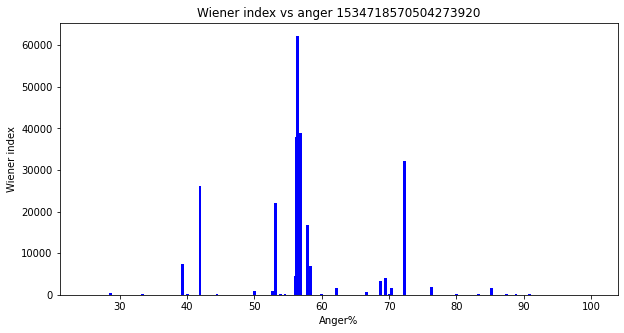

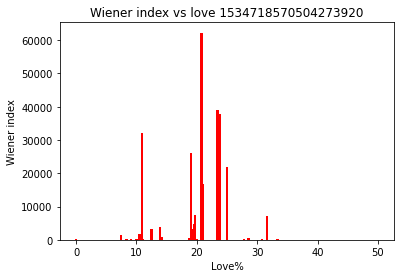

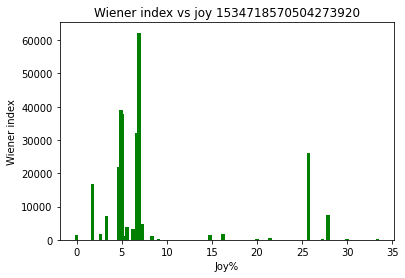

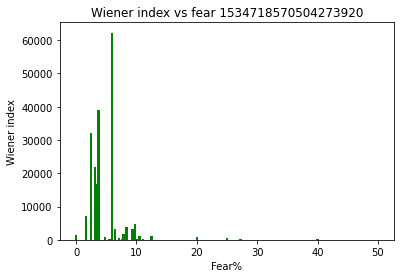

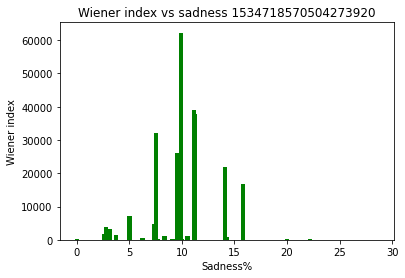

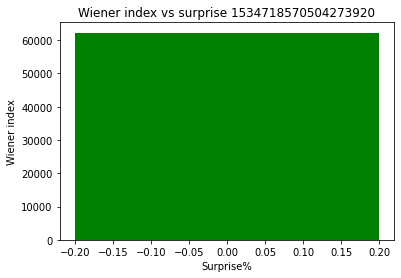

Average number of nodes in the reply tree of an influential node (Emotion-wise):  {'anger': 16.75, 'joy': 22.0, 'love': 33.666666666666664, 'sadness': 8.0, 'fear': 4.5}
Average direct responses to an influential node (Emotion-wise):  {'anger': 4.75, 'joy': 10.555555555555555, 'love': 8.722222222222221, 'sadness': 2.75, 'fear': 3.0}
Average length of the reply tree of an influential node (Emotion-wise):  {'anger': 6.03125, 'joy': 5.222222222222222, 'love': 7.0, 'sadness': 3.25, 'fear': 2.5}
Average emotion distribution in influential nodes:  {'anger': 59.93370339953316, 'fear': 11.395159963306718, 'love': 20.242337555472588, 'joy': 14.599854309963819, 'sadness': 11.777930714517193, 'surprise': 8.333333333333332}
Average number of users involved in an influential node: 2.201585215049308


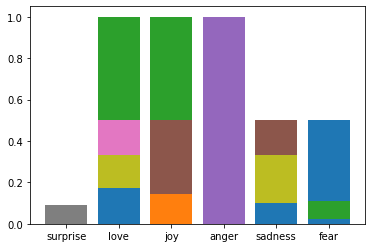

Original emotion:


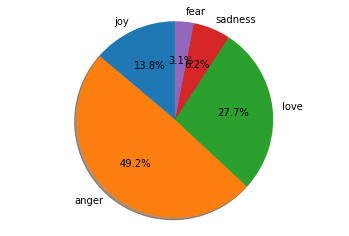

Propagated emotion:


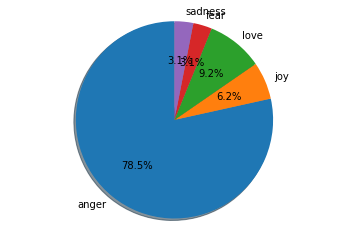

Higher than 60
[('id_ccaf7645935c623f2849a6afee27c443', 868), ('id_786e8624d09ed89004721224fa6c263e', 40), ('id_8f05e1c96b28fc69ab67f46ab9e70570', 29), ('id_9846bd268246a0039e82f3c9654223c4', 27), ('id_18b24c409c70bf2954031b5c1f520485', 27), ('id_fd22d1cc95d26af6d580d38e41e0aa50', 25), ('id_4b7a393dbf4f471963b23b20ae7f635e', 18), ('id_a737104a4224e70e79d27278aa68bfb5', 16), ('id_4f20ca8384fe7da6aa2aa22cc876f537', 14), ('id_2a4803806978fe13dc574bf127083759', 13), ('id_f8b47c71364ccb0a7c6103b44c1fcb62', 12), ('id_daeccf8db2056d97a4b9522999eec327', 11), ('id_e80bd46d76443b5dfac92f84502a2947', 11), ('id_fab8b13593c8705d04d4fc80d0d2bc72', 10), ('id_7546aa756ad5e4e34812a8cae8666125', 10), ('id_2f421d618e3fc6e5b55fd516b3b2b822', 8), ('id_dc5b281991a2f5de54a3f0760460380f', 7), ('id_3d05d1b3d31df29b116ba835c42f1e69', 7), ('id_ac3625803badef63ccee9b0b1739c899', 7), ('id_3ce109267b9357bbe3ac2809befa4a40', 7), ('id_8dd3e0fe9e482e6f39f36ea4a56fbc87', 6), ('id_7f424e860faa543bae0db01c7f580adc', 6), 

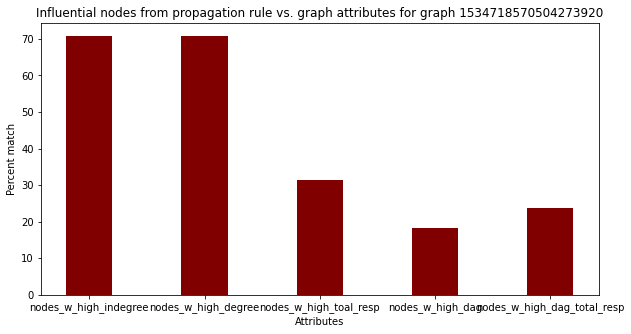

Emotion distribution across nodes: Counter({'anger': 1227, 'love': 290, 'joy': 214, 'sadness': 139, 'fear': 101, 'surprise': 2})
Percentage distribution: [('joy', 10.846426761277243), ('anger', 62.18955904713634), ('love', 14.69842878864673), ('sadness', 7.045108971109985), ('fear', 5.119107957425241), ('surprise', 0.10136847440446022)]
{'eigen_v': 0.9819745609449245, 'distance_from_root': 0, 'type_of_node': 'R', 'type_of_node_factor': 1, 'page_rank': 0.2349567744559642, 'influential': 1, 'influence_factor': 0, 'total_responses': 1773, 'longest_path_length': 28.0, 'longest_path_length_total_Resp': 49644.0, 'emotion_board': {'surprise': 1.0471869297683287, 'love': 13.582196696181855, 'joy': 8.084592379266798, 'anger': 93.903628020017, 'sadness': 5.128457357524653, 'fear': 5.661677836406052}, 'emotion_highest_score': 'anger'}
Graph:  1556805628974481408
Number of nodes:  2786
Number of edges:  2655
Emotion distribution across nodes: Counter({'anger': 1609, 'joy': 454, 'love': 345, 'fear'

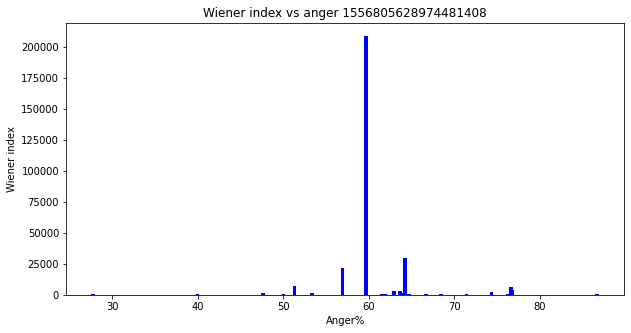

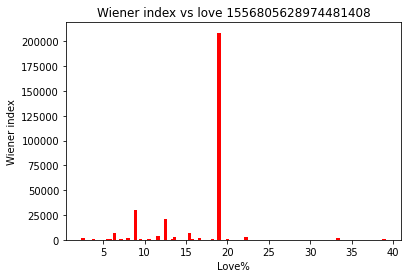

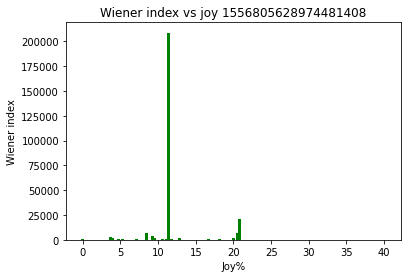

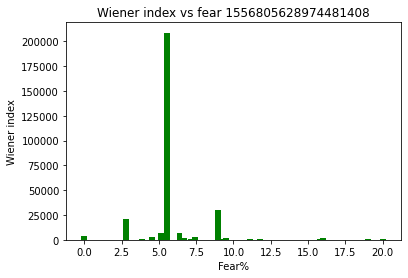

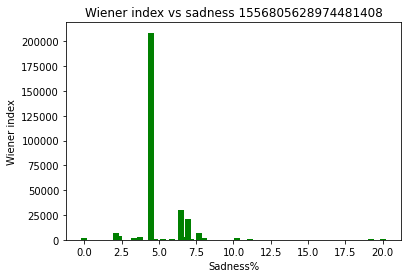

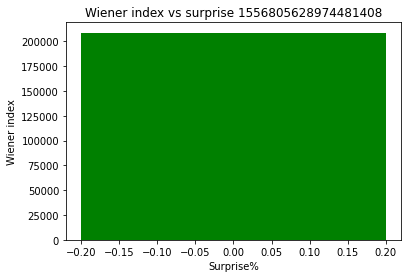

Average number of nodes in the reply tree of an influential node (Emotion-wise):  {'anger': 26.61111111111111, 'joy': 14.545454545454545, 'love': 15.0, 'sadness': 97.25, 'fear': 9.666666666666666}
Average direct responses to an influential node (Emotion-wise):  {'anger': 11.666666666666666, 'joy': 6.0, 'love': 8.2, 'sadness': 44.5, 'fear': 5.0}
Average length of the reply tree of an influential node (Emotion-wise):  {'anger': 7.333333333333333, 'joy': 4.545454545454546, 'love': 3.6, 'sadness': 11.0, 'fear': 4.666666666666667}
Average emotion distribution in influential nodes:  {'anger': 60.60112615631992, 'joy': 14.654862382954649, 'love': 16.581762599384913, 'sadness': 9.457567392827183, 'fear': 10.255977416963646}
Average number of users involved in an influential node: 1.7575682305751614


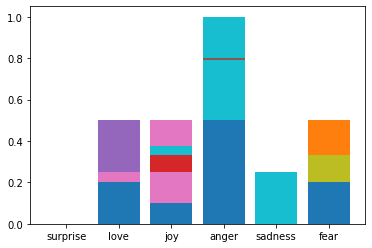

Original emotion:


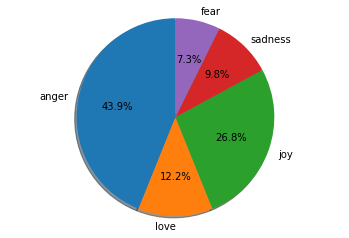

Propagated emotion:


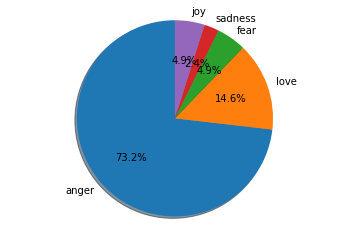

Higher than 60
[('id_660340f0e427e21d2dfa854a7221d77c', 1263), ('id_930b2770d8a66acae6d397a270c1996d', 137), ('id_d079490e913373001bef8e52ff875459', 70), ('id_07650979da272cd2c4aa11ac5c7ea444', 69), ('id_5a3dace73743d21bcf20027c62ffd9a4', 29), ('id_c1e4d80ef92599c0104a7d867d224831', 24), ('id_374382b517f705c1f49152a9040df0f3', 19), ('id_1e286ec01cba2e1c36c65283bc8e835a', 18), ('id_e337b8f4a78043a6a3c3d5faceb412aa', 13), ('id_6bb70eddc975f912a00f72edbfd738bf', 12), ('id_d9c02ea09cbb7dc1f0a535d192957007', 11), ('id_12ad2d61df9da8c9abdb0a28acb14dd1', 10), ('id_fb470e9b5d322c2145dbf4ea0fe01c49', 10), ('id_afbd4d5e1fd0c44599bfe626a6df51af', 9), ('id_4a0a39e8986e8ef345f63bd696b59ee6', 9), ('id_0fb81e25025bf3c47d5d1586caed02bc', 9), ('id_7cd49e7e57e06afaa6b8a0e0cd2d6853', 8), ('id_5f68a91005bf28c6a00e7d5203080548', 8), ('id_5c700f98e62d658c6a048a95db204316', 7), ('id_39a2be34e9fea2c52a8ad96369a3c259', 7), ('id_47569a575dce17f97e6ee64650bbfab8', 6), ('id_3e5166e400e9dfe3bb8714466cfb2cef', 6), 

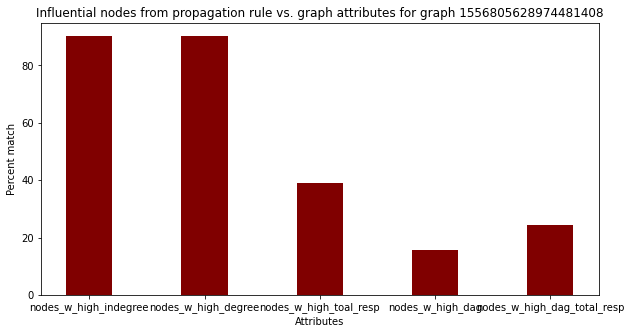

Emotion distribution across nodes: Counter({'anger': 1609, 'joy': 454, 'love': 345, 'fear': 125, 'sadness': 122})
Percentage distribution: [('anger', 60.602636534839924), ('joy', 17.09981167608286), ('love', 12.994350282485875), ('fear', 4.708097928436912), ('sadness', 4.595103578154426)]
{'eigen_v': 0.9804012648558494, 'distance_from_root': 0, 'type_of_node': 'R', 'type_of_node_factor': 1, 'page_rank': 0.2529086267325287, 'influential': 1, 'influence_factor': 0, 'total_responses': 2282, 'longest_path_length': 23.0, 'longest_path_length_total_Resp': 52486.0, 'emotion_board': {'surprise': 1, 'love': 12.155417520735032, 'joy': 6.6269047167196025, 'anger': 57.07929421110999, 'sadness': 3.380218350056959, 'fear': 6.031278569049594}, 'emotion_highest_score': 'anger'}
Graph:  1539095316661604352
Number of nodes:  1829
Number of edges:  1771
Emotion distribution across nodes: Counter({'anger': 1076, 'love': 244, 'joy': 225, 'sadness': 140, 'fear': 86})
Percentage distribution: [('love', 13.77

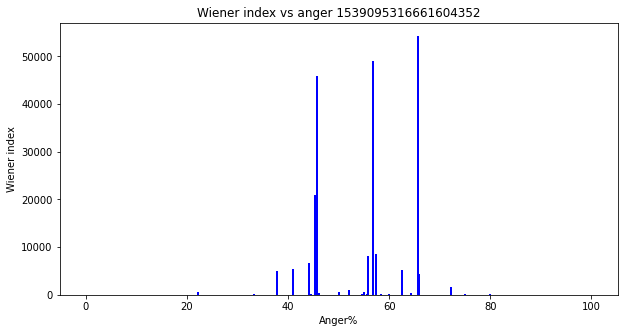

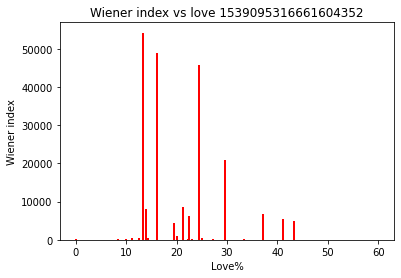

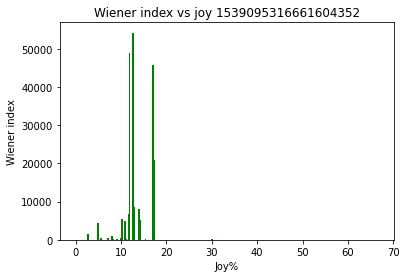

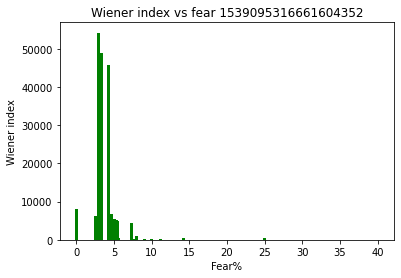

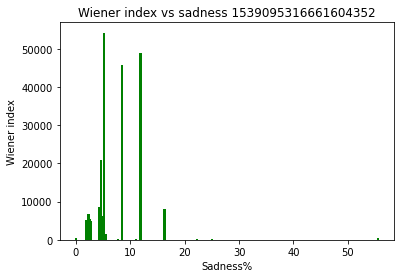

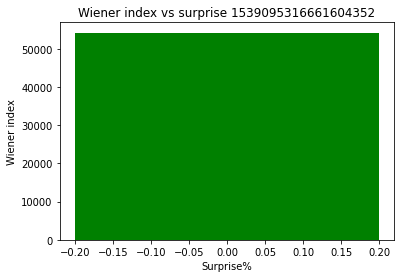

Average number of nodes in the reply tree of an influential node (Emotion-wise):  {'anger': 21.82608695652174, 'joy': 20.666666666666668, 'love': 22.88888888888889, 'sadness': 68.5, 'fear': 15.25}
Average direct responses to an influential node (Emotion-wise):  {'anger': 5.782608695652174, 'joy': 4.0, 'love': 10.88888888888889, 'sadness': 32.5, 'fear': 3.0}
Average length of the reply tree of an influential node (Emotion-wise):  {'anger': 6.0, 'joy': 6.0, 'love': 6.333333333333333, 'sadness': 9.0, 'fear': 5.5}
Average emotion distribution in influential nodes:  {'love': 23.81846057543799, 'anger': 55.48655291267983, 'joy': 17.67770711928731, 'sadness': 11.873812942701353, 'fear': 11.15605813359131}
Average number of users involved in an influential node: 2.535208323700672


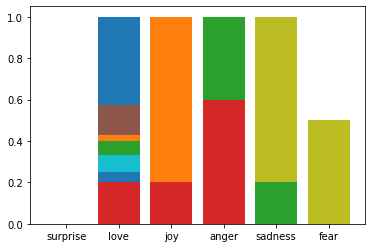

Original emotion:


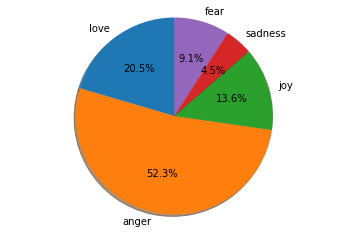

Propagated emotion:


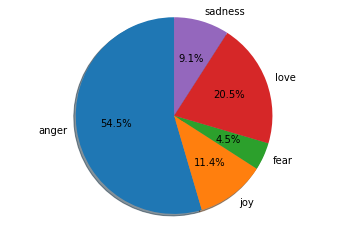

Higher than 60
[('id_86112cdc10757be9d1ac4718d17a859e', 937), ('id_1b19b2330df972b98f1319ee9ab50b4d', 61), ('id_edf97816daa509d96563d09013c2e94c', 43), ('id_2996666bf145e80294c68c119f16bacc', 38), ('id_2989acf2bd6d63b9dd934922dff1a89f', 26), ('id_f46369b67c772806083f61e7ffa58d8d', 10), ('id_ff736d569b59bd8f2c371c408dca47bc', 8), ('id_b6328ea3cb99742a86a8969df4c12631', 8), ('id_769724838389519cc18a9036c9c99606', 7), ('id_121905e06705e46b8ae909b017ba1565', 7), ('id_ed44f9a47252cb43664de48356a3e629', 7), ('id_5c011b7bdb8ab49357f8afdf7682597d', 7), ('id_a46b5184e4c003f0988d36d9d36f1cb8', 6), ('id_d7b90c4a0d22aa6079e43b5a008b4ba4', 6), ('id_aba214bfd7689abcff4ed45c7e339fd6', 6), ('id_9e8939c10ee2bacacb5b261e30f961d2', 5), ('id_65a0a5fd09b74afe5092b06f4524e534', 5), ('id_dce01f549be5e276ba030a91a108765f', 5), ('id_b438a2fd93445f3f82548df18ea7261f', 5), ('id_f33403e286645e8b0e65d7f1f84d9d70', 4), ('id_5946c81196dc2a947e1f34aa31081e9b', 4), ('id_d7fd7eb440af6202f02c1defaeefaec6', 4), ('id_831e

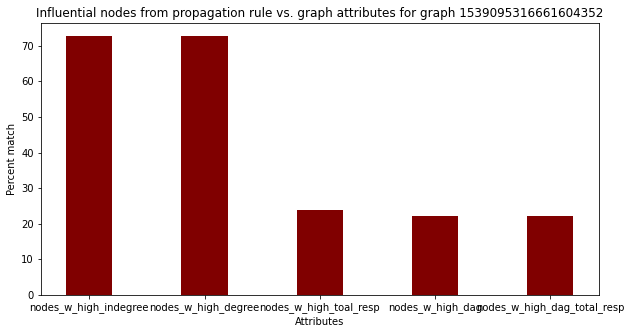

Emotion distribution across nodes: Counter({'anger': 1076, 'love': 244, 'joy': 225, 'sadness': 140, 'fear': 86})
Percentage distribution: [('love', 13.777526821005083), ('anger', 60.75663466967814), ('joy', 12.704686617730095), ('sadness', 7.905138339920949), ('fear', 4.8560135516657255)]
{'eigen_v': 0.9919064014763069, 'distance_from_root': 0, 'type_of_node': 'R', 'type_of_node_factor': 1, 'page_rank': 0.26093242213281737, 'influential': 1, 'influence_factor': 0, 'total_responses': 1653, 'longest_path_length': 19.0, 'longest_path_length_total_Resp': 31407.0, 'emotion_board': {'surprise': 1, 'love': 17.588764205962296, 'joy': 11.404653193841234, 'anger': 43.28408150900554, 'sadness': 8.177112298942438, 'fear': 4.810063933103563}, 'emotion_highest_score': 'anger'}
Graph:  1465572912987979777
Number of nodes:  1352
Number of edges:  1275
Emotion distribution across nodes: Counter({'anger': 785, 'love': 178, 'joy': 143, 'sadness': 101, 'fear': 68})
Percentage distribution: [('anger', 61.5

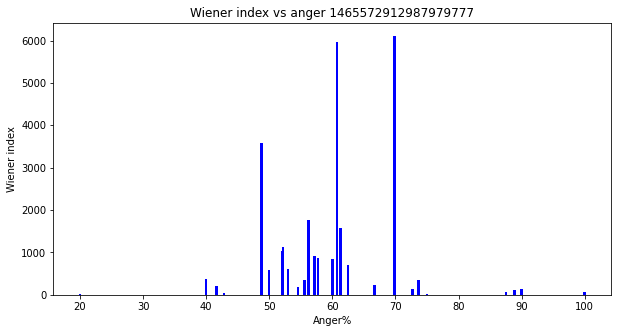

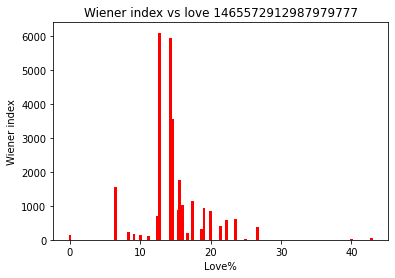

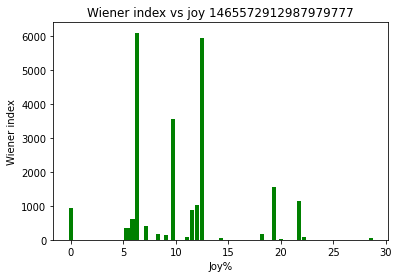

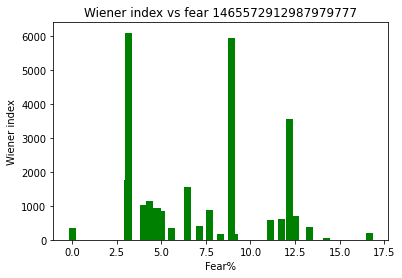

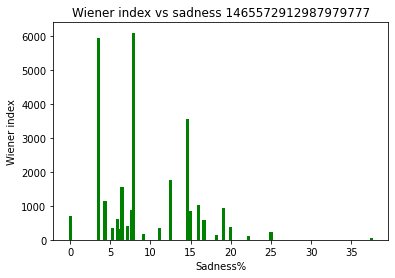

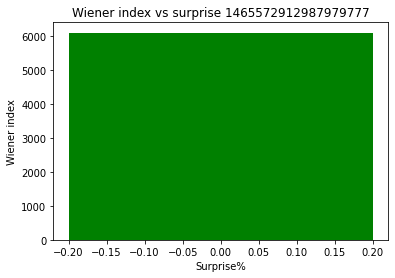

Average number of nodes in the reply tree of an influential node (Emotion-wise):  {'anger': 12.272727272727273, 'joy': 14.8, 'love': 8.545454545454545, 'sadness': 20.25, 'fear': 10.0}
Average direct responses to an influential node (Emotion-wise):  {'anger': 5.090909090909091, 'joy': 11.0, 'love': 5.2727272727272725, 'sadness': 7.25, 'fear': 3.0}
Average length of the reply tree of an influential node (Emotion-wise):  {'anger': 3.3333333333333335, 'joy': 2.4, 'love': 2.727272727272727, 'sadness': 7.25, 'fear': 5.333333333333333}
Average emotion distribution in influential nodes:  {'fear': 8.843288007433339, 'joy': 21.737698961909, 'anger': 60.689066135535136, 'love': 19.643542790304853, 'sadness': 14.833092811752906}
Average number of users involved in an influential node: 1.6537822394337283


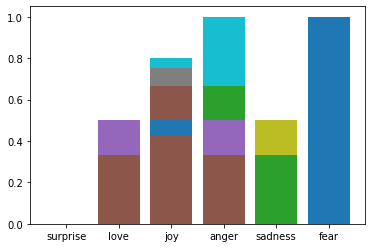

Original emotion:


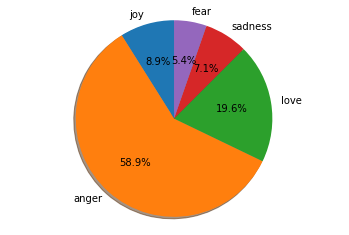

Propagated emotion:


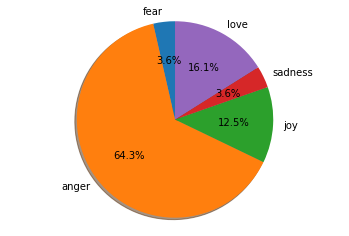

Higher than 60
[('id_906c0b103fa8210cb3ee86f2bb525f01', 640), ('id_cfab7cc161ceb5baade94dbe25b32936', 45), ('id_36980fa0e810e808d81ef7a67c6498bc', 19), ('id_4d692956d7bc500a3c93ee6736b1c961', 17), ('id_80d86b811f01721ddd02e316d6b3a2ba', 17), ('id_ddbbe0a6a23951db81877309826d9587', 14), ('id_398e016e5e079a4e6a540f8f0f7f2e63', 14), ('id_329ecbb98c92cb27e90c7ea7ac1c0025', 11), ('id_ce8f18302ed0cf120f52ddace1f33dd8', 10), ('id_f13f5aab3197820d0e839db9018c1ad3', 9), ('id_e663538bd0166ae0dfe89203f48d2b9c', 9), ('id_8b9da3e557bf753b57d66d8f13340110', 7), ('id_43b7f04a0ea5409b300f3a93fbc88b9d', 7), ('id_92ef68c2d7582993b0475c8b13b379fc', 7), ('id_0fab3b112998a91c5a867ce2706a7825', 7), ('id_b6f192e8518b5b3f0b9cedcb85f1f08b', 7), ('id_35732936d4aba8d7026f70d958db8321', 6), ('id_c7b7d1e878ca04d4a15f0efc9d8b08c1', 6), ('id_03415736b57c9896161dee624466f9e9', 6), ('id_54883067ab129c4d8d06e223c8e96603', 6), ('id_53d5b142ac1f074c9b8456c19d8490e5', 6), ('id_2575d1b712c0305a9522b4c3a4752498', 5), ('id_1

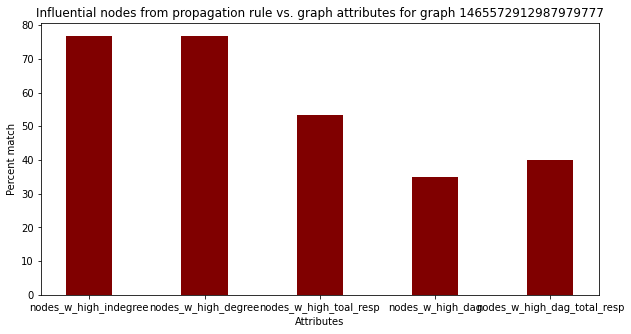

Emotion distribution across nodes: Counter({'anger': 785, 'love': 178, 'joy': 143, 'sadness': 101, 'fear': 68})
Percentage distribution: [('anger', 61.568627450980394), ('love', 13.96078431372549), ('joy', 11.215686274509803), ('fear', 5.333333333333334), ('sadness', 7.92156862745098)]
{'eigen_v': 0.9953205280912184, 'distance_from_root': 0, 'type_of_node': 'R', 'type_of_node_factor': 1, 'page_rank': 0.2744036937789965, 'influential': 1, 'influence_factor': 0, 'total_responses': 1135, 'longest_path_length': 11.0, 'longest_path_length_total_Resp': 12485.0, 'emotion_board': {'surprise': 1, 'love': 20.230524349659127, 'joy': 13.3185618901518, 'anger': 72.39052768092355, 'sadness': 5.608254381228017, 'fear': 5.086686440946537}, 'emotion_highest_score': 'anger'}
Graph:  1482856761153703937
Number of nodes:  1819
Number of edges:  1714
Emotion distribution across nodes: Counter({'anger': 1050, 'joy': 253, 'love': 198, 'sadness': 134, 'fear': 79})
Percentage distribution: [('fear', 4.60910151

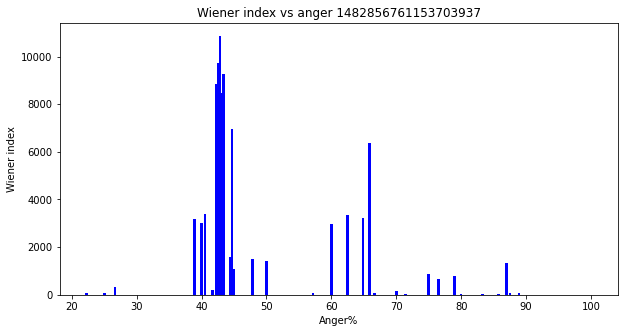

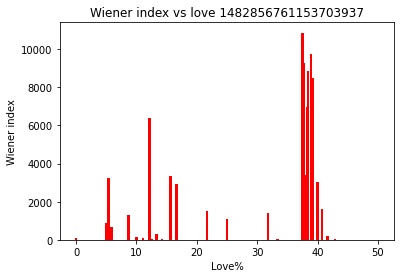

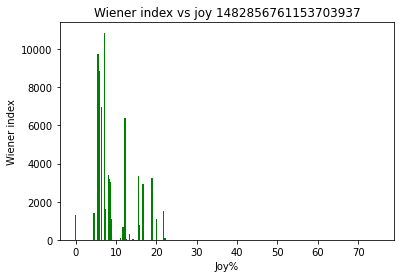

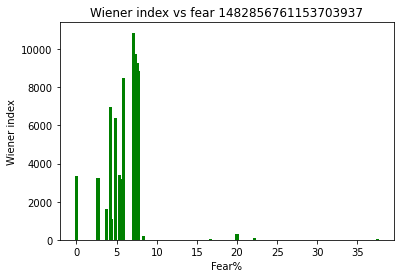

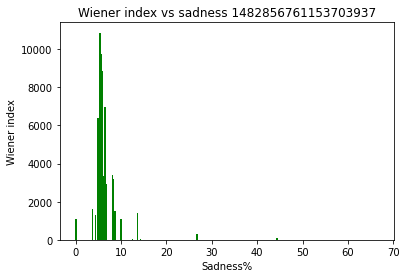

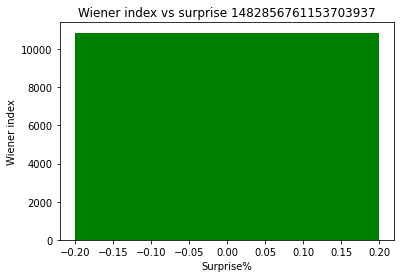

Average number of nodes in the reply tree of an influential node (Emotion-wise):  {'anger': 8.648148148148149, 'joy': 8.136363636363637, 'love': 13.176470588235293, 'sadness': 8.5, 'fear': 9.857142857142858}
Average direct responses to an influential node (Emotion-wise):  {'anger': 1.9074074074074074, 'joy': 2.4545454545454546, 'love': 2.1176470588235294, 'sadness': 1.8333333333333333, 'fear': 1.5714285714285714}
Average length of the reply tree of an influential node (Emotion-wise):  {'anger': 3.5185185185185186, 'joy': 3.3636363636363638, 'love': 4.117647058823529, 'sadness': 3.0, 'fear': 3.5714285714285716}
Average emotion distribution in influential nodes:  {'anger': 60.71088538041756, 'love': 30.38723509759361, 'joy': 25.347423785609244, 'sadness': 19.27437166397143, 'fear': 18.851411330589347}
Average number of users involved in an influential node: 3.8662079190256944


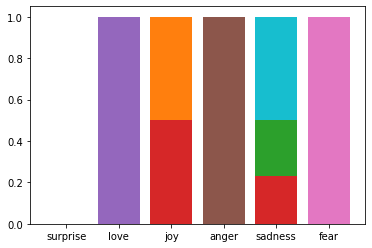

Original emotion:


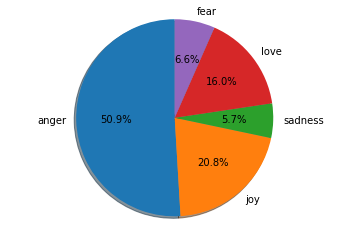

Propagated emotion:


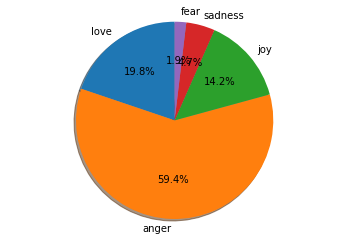

Higher than 60
[('id_be91de029445d16398c6e47f15560c48', 769), ('id_d1d8a6004afb0a320dc09e75dc9a076f', 102), ('id_85a4683ee8f02e8d395cfb93f961eb17', 64), ('id_733600045cbf96e1322afc8694c8b9ad', 43), ('id_e28c0a5788f94e673abc9e40c964496e', 20), ('id_cf461207994ac3a921951e2dca2b8aeb', 13), ('id_ad4d4cdb2bd6e153a67b066e74d4558d', 11), ('id_640926d1bdc151511e557efe134187bf', 10), ('id_2de944baaddc389d2972b68c19bf30a7', 10), ('id_adbd85507f49c1f86e425ba76702b366', 9), ('id_8fbad9b03c98e4b53faffb2b8b07cab5', 9), ('id_43bdae6905818ef75c38043b4786650d', 8), ('id_b54ade3cf1434ee28aa4b037f7ffb10f', 8), ('id_7f9c37c692dec706255b7c7532edc153', 7), ('id_07a24aa8668186d6f9f23d48663f3a32', 6), ('id_0befd5f40a695ad54dcc96398db1c332', 6), ('id_e1a07e803f046c3adb45b0cbac17f407', 6), ('id_c72ba42653733f4f189af6cd2edf3f2b', 6), ('id_41bf64f767a814bb89311c4b15b546dc', 5), ('id_5889bcc5eb88a6f4a64922f36fb533c5', 5), ('id_8f23c914fe7c028824aa3e48c394ad54', 5), ('id_8794ed5b66ed9e3650cf2e71724a1e6f', 5), ('id_

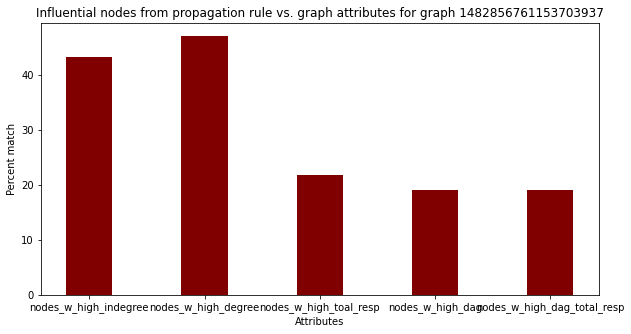

Emotion distribution across nodes: Counter({'anger': 1050, 'joy': 253, 'love': 198, 'sadness': 134, 'fear': 79})
Percentage distribution: [('fear', 4.609101516919487), ('joy', 14.760793465577596), ('love', 11.551925320886815), ('anger', 61.260210035005834), ('sadness', 7.8179696616102685)]
{'eigen_v': 0.1938830001610439, 'distance_from_root': 0, 'type_of_node': 'R', 'type_of_node_factor': 1, 'page_rank': 0.18851571266803147, 'influential': 1, 'influence_factor': 0, 'total_responses': 1003, 'longest_path_length': 16.0, 'longest_path_length_total_Resp': 16048.0, 'emotion_board': {'surprise': 1, 'love': 34.86068115289475, 'joy': 25.559832991989666, 'anger': 107.68717594059447, 'sadness': 10.189960139162663, 'fear': 4.899623384727977}, 'emotion_highest_score': 'anger'}
Graph:  1571305823837753345
Number of nodes:  4457
Number of edges:  4389
Emotion distribution across nodes: Counter({'anger': 2640, 'love': 523, 'sadness': 470, 'joy': 406, 'fear': 350})
Percentage distribution: [('sadness'

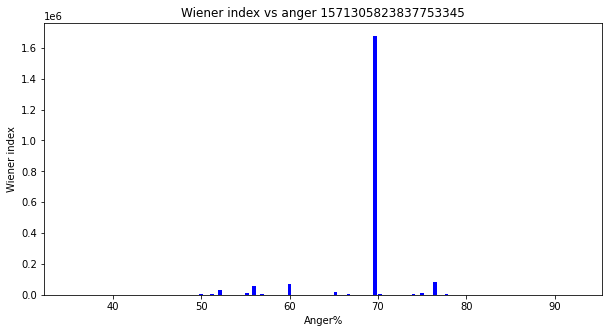

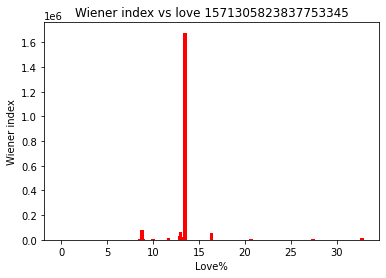

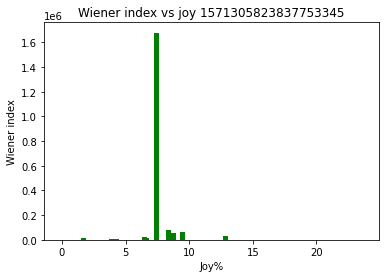

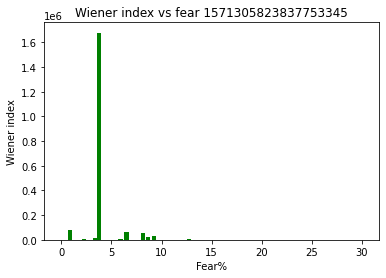

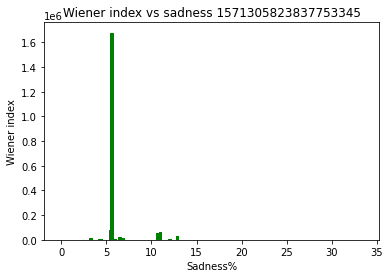

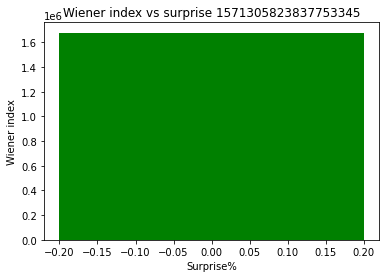

Average number of nodes in the reply tree of an influential node (Emotion-wise):  {'anger': 57.0, 'joy': 14.666666666666666, 'love': 27.22222222222222, 'sadness': 187.16666666666666, 'fear': 21.5}
Average direct responses to an influential node (Emotion-wise):  {'anger': 30.933333333333334, 'joy': 8.333333333333334, 'love': 10.0, 'sadness': 58.0, 'fear': 9.0}
Average length of the reply tree of an influential node (Emotion-wise):  {'anger': 5.466666666666667, 'joy': 5.0, 'love': 5.888888888888889, 'sadness': 7.0, 'fear': 4.5}
Average emotion distribution in influential nodes:  {'anger': 65.03798493887471, 'sadness': 9.117275700401773, 'love': 14.164261791052688, 'joy': 9.217750057207494, 'fear': 9.807872192123277}
Average number of users involved in an influential node: 1.4663488597878562


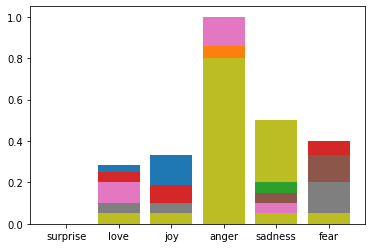

Original emotion:


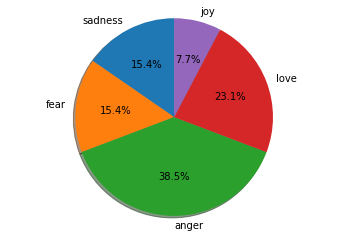

Propagated emotion:


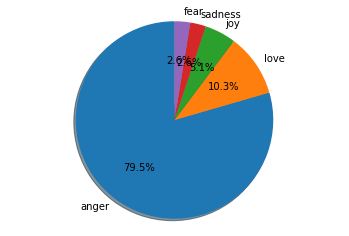

Higher than 60
[('id_c23d1f89dbeccffbc7088bfe242b8103', 2292), ('id_3749b1794cd1a4910fa93b8d53d85438', 174), ('id_51f8e82498c372982dde55c9791b4f25', 138), ('id_f2e5e1783a1a32d35d31694014a5ffea', 126), ('id_257c1c1765b9c6db4c9fbab12679c483', 119), ('id_9a5db14d59c722bfd09f3fa2512974ff', 49), ('id_796db4329b389e8478ddfbfaa94b3cb4', 26), ('id_4f0fc56be5dd19d5f14eb856d4de46b5', 23), ('id_4c562edc564d4345bfd0ffb7cad41844', 22), ('id_13232188d7825170f3a29311e5aab18b', 20), ('id_1775bd9bb0afaa311d04e1a2e2a67da0', 20), ('id_d747ae206e126018a9a25decaefaaa54', 19), ('id_f22f861345373aab9b013df5a92f70c4', 19), ('id_11569a6ef86748b62a4f6cab705b207d', 16), ('id_7231c3ccaa82fe5c9e84143c3c906abc', 14), ('id_fc8ba90b084cb6e84f9f968300fe3e73', 14), ('id_f12e0799b68abd8f0e5ba9c4baf380e8', 14), ('id_9c7d294d74ecdb60dfe69c729adc4d93', 13), ('id_37850b8644c6c43372a7926f70e1d19c', 13), ('id_926156885302e6b46a5033d533025170', 11), ('id_9ee4af793cfbe9c1b60ad6e4d998cdd1', 10), ('id_279337afd3d459429b260a01446a

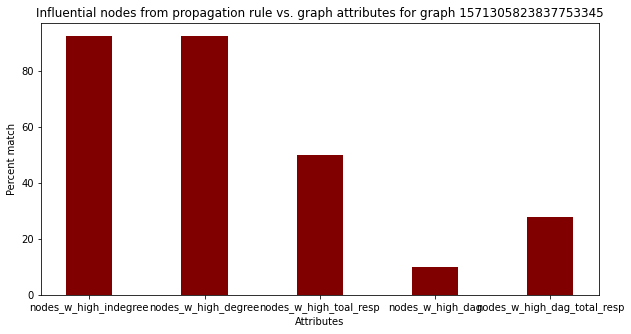

Emotion distribution across nodes: Counter({'anger': 2640, 'love': 523, 'sadness': 470, 'joy': 406, 'fear': 350})
Percentage distribution: [('sadness', 10.708589655958077), ('anger', 60.150375939849624), ('joy', 9.250398724082935), ('fear', 7.974481658692185), ('love', 11.916154021417178)]
{'eigen_v': 0.9737930494394988, 'distance_from_root': 0, 'type_of_node': 'R', 'type_of_node_factor': 1, 'page_rank': 0.2823963043014855, 'influential': 1, 'influence_factor': 0, 'total_responses': 4215, 'longest_path_length': 21.0, 'longest_path_length_total_Resp': 88515.0, 'emotion_board': {'surprise': 1, 'love': 13.726299337324555, 'joy': 7.405817274322743, 'anger': 81.66659341679933, 'sadness': 3.567082669976959, 'fear': 4.76539308845388}, 'emotion_highest_score': 'anger'}
Graph:  1461114694073139200
Number of nodes:  2853
Number of edges:  2563
Emotion distribution across nodes: Counter({'anger': 1553, 'love': 414, 'joy': 297, 'sadness': 150, 'fear': 148, 'surprise': 1})
Percentage distribution: 

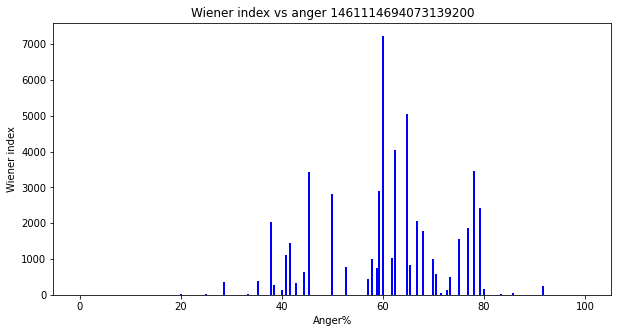

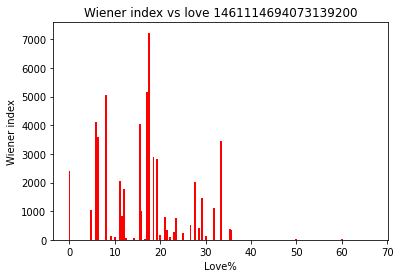

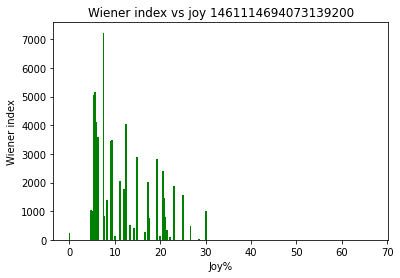

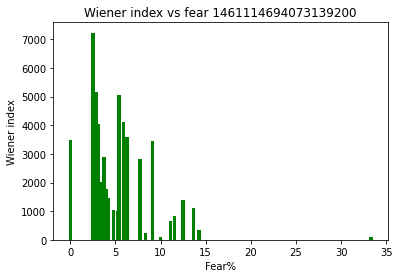

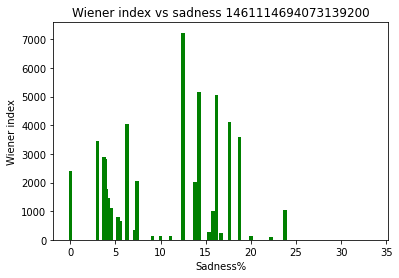

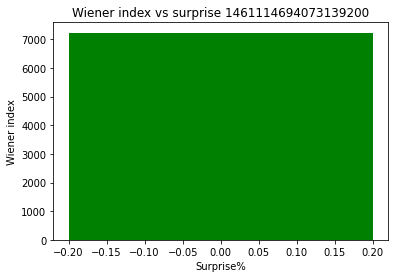

Average number of nodes in the reply tree of an influential node (Emotion-wise):  {'anger': 1.3134920634920635, 'joy': 0.7083333333333334, 'love': 0.8835616438356164, 'sadness': 2.7666666666666666, 'fear': 1.2448979591836735}
Average direct responses to an influential node (Emotion-wise):  {'anger': 0.29563492063492064, 'joy': 0.20833333333333334, 'love': 0.3082191780821918, 'sadness': 0.5833333333333334, 'fear': 0.5510204081632653}
Average length of the reply tree of an influential node (Emotion-wise):  {'anger': 0.7599206349206349, 'joy': 0.49166666666666664, 'love': 0.5273972602739726, 'sadness': 1.3166666666666667, 'fear': 0.5306122448979592}
Average emotion distribution in influential nodes:  {'anger': 91.961953523774, 'joy': 65.71576686865698, 'sadness': 60.679971833811194, 'love': 73.4031576255368, 'fear': 60.59047094296264}
Average number of users involved in an influential node: 1.2196048737004368


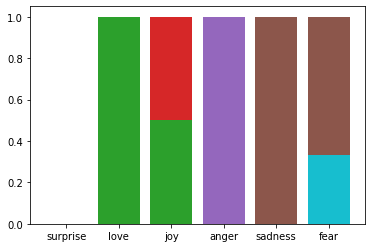

Original emotion:


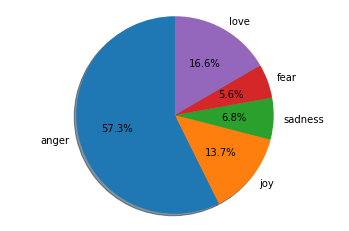

Propagated emotion:


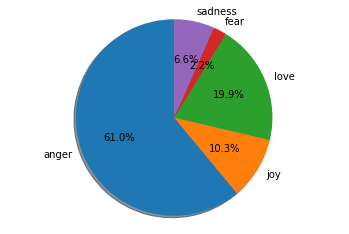

Higher than 60
[('id_04d5618222b996d615e7a272deac5963', 799), ('id_01e5161aa50958f015a6ea0842bf95c4', 74), ('id_eac14bcabb6667e77dabbf00d6526c25', 73), ('id_3a2678017826e3678a6e82b71b55ddce', 37), ('id_1da9b44a637cb2cc1cbf6360deb72863', 30), ('id_9bf75b8c0337499cd1dad89a1885f600', 27), ('id_85ea687a84764932f611ee9fbb98bfbb', 23), ('id_463aaf42b9e8facd8d2ac53876649ffa', 22), ('id_7ec99ff46eb48732a75cba669f6b0a7a', 19), ('id_0ce8123641b667de211110ad1470519d', 19), ('id_8ec9803da2075ef73dd95f93aafc9d16', 18), ('id_291f5a0d590890b25fcda4206bd3f36e', 17), ('id_5f62d85b2abf0023dd845ee37f4f0e1e', 17), ('id_ea3708a7014eeaa4e88bcf20c2c10011', 16), ('id_00e8f927a7b5a330c56ceb052429456a', 12), ('id_95630aa7770a7435085cce51b2967314', 11), ('id_faed3767c405e5db4a2f61261297b8b9', 10), ('id_04c58d54374f8e4abb7662a005a514b6', 10), ('id_543130803bd68e97411b7634daf895a8', 10), ('id_557879e525da25e0aac93aa475d4568f', 10), ('id_3fc3a5cca325638b92cc64ececa7fbd3', 10), ('id_6391eddfc385ec4925cebd356d2ced47'

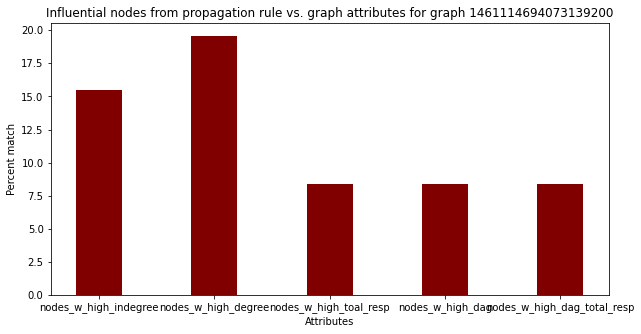

Emotion distribution across nodes: Counter({'anger': 1553, 'love': 414, 'joy': 297, 'sadness': 150, 'fear': 148, 'surprise': 1})
Percentage distribution: [('anger', 60.59305501365587), ('sadness', 5.852516582130316), ('love', 16.15294576667967), ('joy', 11.587982832618025), ('fear', 5.774483027701912), ('surprise', 0.03901677721420211)]
{'eigen_v': 3.8984589617378825e-05, 'distance_from_root': 0, 'type_of_node': 'R', 'type_of_node_factor': 1, 'page_rank': 0.11943597207315529, 'influential': 1, 'influence_factor': 0, 'total_responses': 1012, 'longest_path_length': 16.0, 'longest_path_length_total_Resp': 16192.0, 'emotion_board': {'surprise': 1.000006406702348, 'love': 44.53562042560945, 'joy': 23.56978827307643, 'anger': 135.72032327383232, 'sadness': 15.206069607450711, 'fear': 6.421168253552459}, 'emotion_highest_score': 'anger'}
Graph:  1539377610278731779
Number of nodes:  3343
Number of edges:  2934
Emotion distribution across nodes: Counter({'anger': 1945, 'love': 395, 'joy': 299,

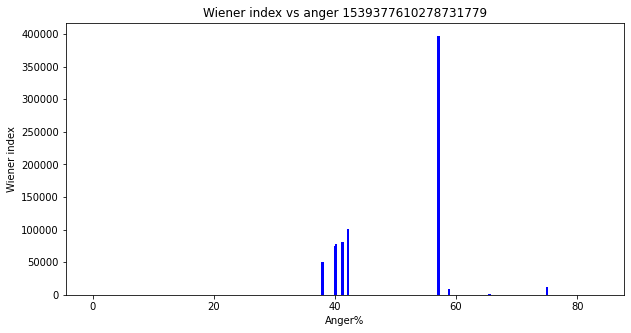

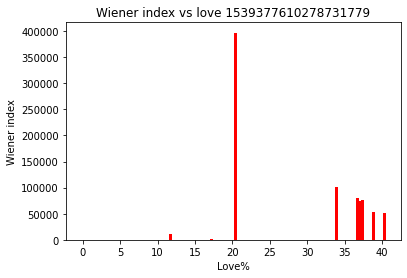

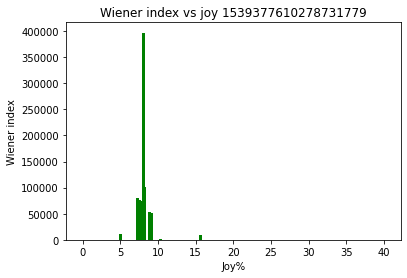

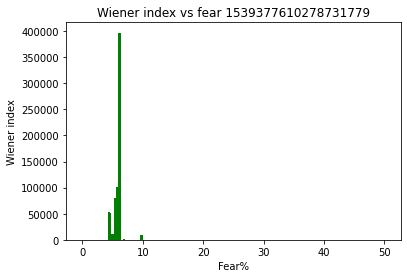

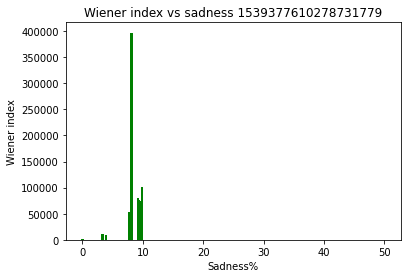

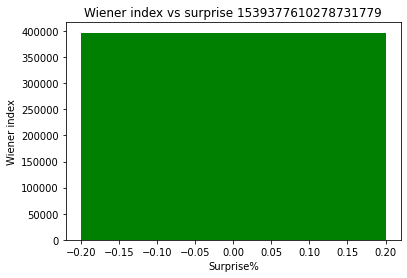

Average number of nodes in the reply tree of an influential node (Emotion-wise):  {'anger': 34.476190476190474, 'joy': 7.0, 'love': 25.833333333333332, 'sadness': 16.25, 'fear': 54.25}
Average direct responses to an influential node (Emotion-wise):  {'anger': 9.0, 'joy': 2.0, 'love': 4.166666666666667, 'sadness': 2.75, 'fear': 5.0}
Average length of the reply tree of an influential node (Emotion-wise):  {'anger': 7.333333333333333, 'joy': 4.0, 'love': 7.0, 'sadness': 6.75, 'fear': 13.0}
Average emotion distribution in influential nodes:  {'sadness': 13.211406470615293, 'fear': 14.51446371472611, 'love': 21.692188611784147, 'anger': 59.59471457498763, 'joy': 16.216568122235884}
Average number of users involved in an influential node: 4.026442622102303


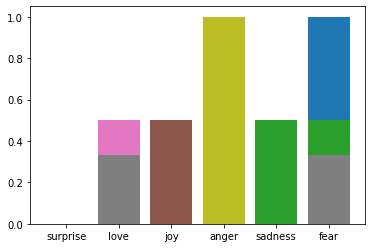

Original emotion:


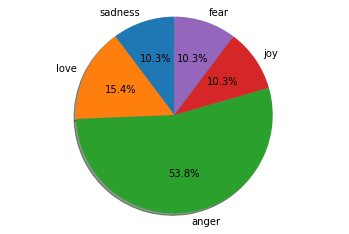

Propagated emotion:


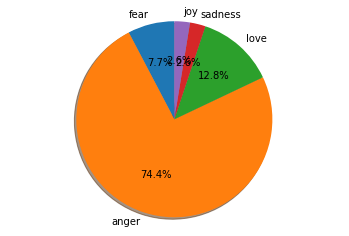

Higher than 60
[('id_8e5702f6dfbac3746625f59a35eefeb2', 1084), ('id_930f9e2ec1772fc1a801990e6505e1bc', 98), ('id_66dc0469afad92b10577699583b5bb57', 35), ('id_117721750ac7c7418a1023c1d676d15e', 31), ('id_60a0857b79f7cc5bc870f8c729109878', 30), ('id_023779d27d71387efd11ffa40fa8c38b', 18), ('id_5d05e921f4cdca87458b4559093712c3', 15), ('id_a374a2b772a899c18842b376b9cdd435', 15), ('id_9ca09d09604638b9bc102ef92051c186', 15), ('id_f8caa64b40f7324c83fe7e1dc55474cf', 13), ('id_9dde379ef050b188ccaffcc0f7d23caa', 13), ('id_1757d443623513037590e1e946fa5bf2', 12), ('id_afb218ee049a7362fd1d33986d2a3f17', 12), ('id_608202f042818e0f9168da091b9c7e35', 10), ('id_46c7e9f4c6a452771529e23cdde46463', 9), ('id_7d9c2741b94cf6338ab2b385e2e2e910', 9), ('id_ec389446b8b558801c6f703360e172b2', 9), ('id_a546dcc5d76aab4fd3671fce9ed0a7f3', 8), ('id_bc3234f161d8e1c3ba3bcd8502dfc581', 8), ('id_bd360e35ed41115131b9fab3d1a09fda', 8), ('id_91347ae789b4ef55069b14523a67f6ea', 7), ('id_03861e8e174578f6da2755354bd39b20', 7), 

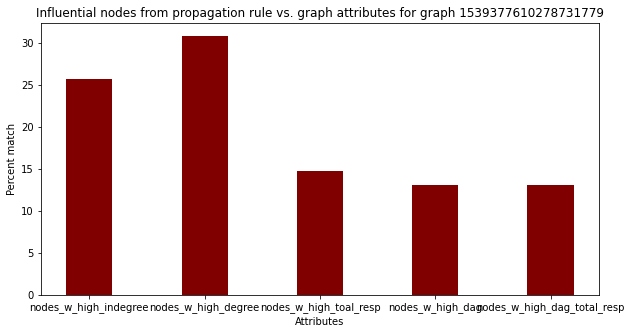

Emotion distribution across nodes: Counter({'anger': 1945, 'love': 395, 'joy': 299, 'sadness': 162, 'fear': 133})
Percentage distribution: [('anger', 66.29175187457396), ('love', 13.462849352419903), ('fear', 4.533060668029993), ('joy', 10.190865712338105), ('sadness', 5.521472392638037)]
{'eigen_v': 0.9714628995445884, 'distance_from_root': 0, 'type_of_node': 'R', 'type_of_node_factor': 1, 'page_rank': 0.14989888135933885, 'influential': 1, 'influence_factor': 0, 'total_responses': 1558, 'longest_path_length': 30.0, 'longest_path_length_total_Resp': 46740.0, 'emotion_board': {'surprise': 1, 'love': 9.36296071222982, 'joy': 3.86655926661599, 'anger': 49.91929441550781, 'sadness': 2.9234616893107708, 'fear': 6.742589636070614}, 'emotion_highest_score': 'anger', 'anger': 1}
Graph:  1563702309284384768
Number of nodes:  2651
Number of edges:  2553
Emotion distribution across nodes: Counter({'anger': 1451, 'joy': 617, 'love': 270, 'sadness': 127, 'fear': 88})
Percentage distribution: [('lo

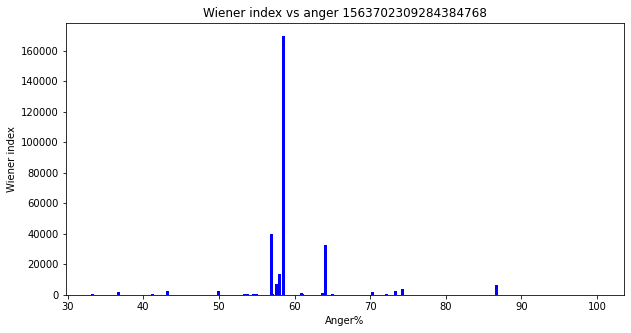

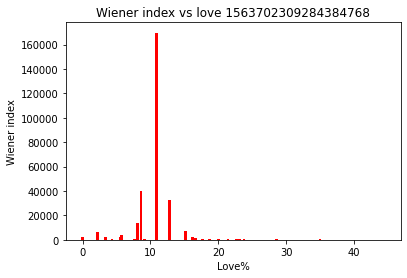

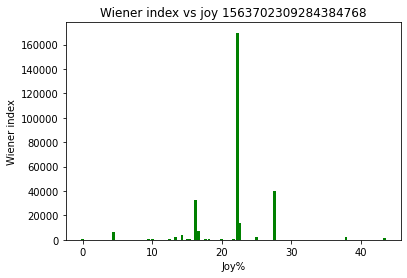

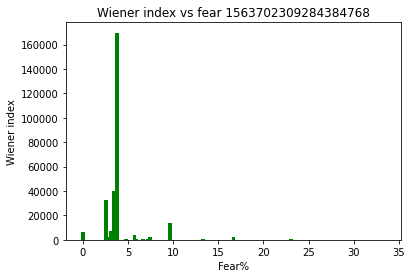

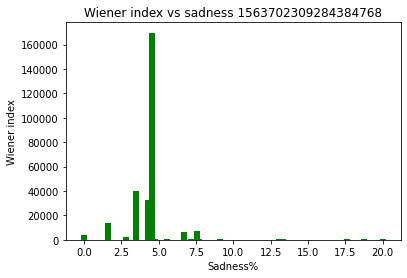

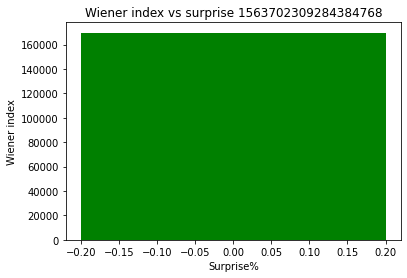

Average number of nodes in the reply tree of an influential node (Emotion-wise):  {'anger': 15.0, 'joy': 57.916666666666664, 'love': 42.0, 'sadness': 15.5, 'fear': 35.0}
Average direct responses to an influential node (Emotion-wise):  {'anger': 5.75, 'joy': 19.333333333333332, 'love': 25.0, 'sadness': 5.0, 'fear': 14.0}
Average length of the reply tree of an influential node (Emotion-wise):  {'anger': 4.791666666666667, 'joy': 7.166666666666667, 'love': 5.5, 'sadness': 4.0, 'fear': 5.0}
Average emotion distribution in influential nodes:  {'joy': 20.728930532884917, 'anger': 58.06005932100719, 'love': 16.14192625278934, 'sadness': 9.806253619963986, 'fear': 9.626275725497964}
Average number of users involved in an influential node: 1.8213666052851614


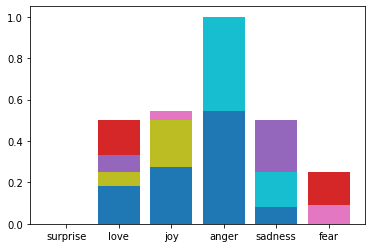

Original emotion:


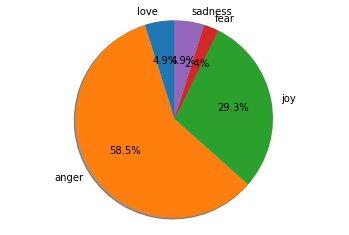

Propagated emotion:


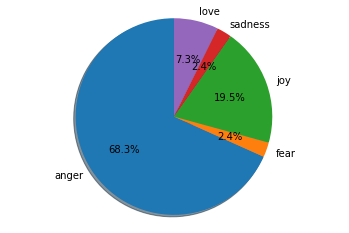

Higher than 60
[('id_dd0ef7914aead3cea11350984b720cdb', 1132), ('id_898e2034430e10cdc80c05c9a0746c67', 113), ('id_ca2810aaa9725cfb4dc07accbc209dc7', 42), ('id_fcef0617229a10cf9cc66418bd988452', 41), ('id_99c500705c6bfa6bc47926c96b2486fa', 35), ('id_46be2d13181f5f8a91660768f09319ad', 30), ('id_8710976ab1e2291051c760c0714ca824', 20), ('id_f5381e70bb675417be12f9cdf24bc237', 16), ('id_99be3b98c5fa52c6d03d7068ac88afd3', 14), ('id_1377b2be3d83a095dc45e4bb91889451', 12), ('id_006c1cfb611b9aee3e95a4666fa457a9', 11), ('id_0d52f7c2d4761adc94afdd693a6c09c2', 11), ('id_21a5b6f7dff64e0d3ca456efd22a8b1f', 10), ('id_4a7ff75b706cdabc2ce981e21b0f338f', 9), ('id_ff08ab79d79973e73587d3bb67ea72c4', 9), ('id_84029819ab556e3c95e500a8794778dc', 9), ('id_9461660d7b49b2a67da3f11e6ecb0e31', 8), ('id_c023e48d8f20137c04e9314dc7937135', 8), ('id_43618b20028271ed6e13162f3ba0f72b', 7), ('id_e0acc49f093f63c61464660c8d0f7102', 7), ('id_a02e17196170466b94364a3d387502ff', 7), ('id_4152fc6810b749924900f03aec596dce', 6), 

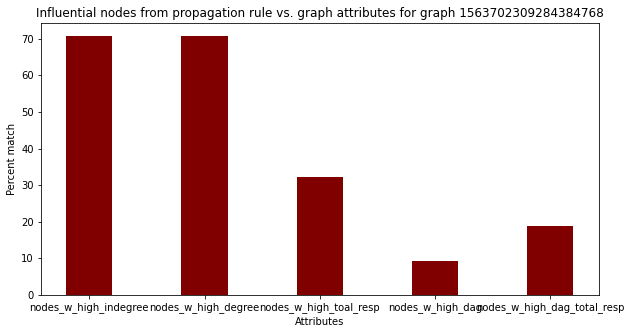

Emotion distribution across nodes: Counter({'anger': 1451, 'joy': 617, 'love': 270, 'sadness': 127, 'fear': 88})
Percentage distribution: [('love', 10.575793184488838), ('anger', 56.83509596553075), ('joy', 24.167645906776343), ('fear', 3.446925186055621), ('sadness', 4.974539757148453)]
{'eigen_v': 0.20233322176821408, 'distance_from_root': 0, 'type_of_node': 'R', 'type_of_node_factor': 1, 'page_rank': 0.23554374804251038, 'influential': 1, 'influence_factor': 0, 'total_responses': 2197, 'longest_path_length': 15.0, 'longest_path_length_total_Resp': 32955.0, 'emotion_board': {'surprise': 1, 'love': 8.583470084541744, 'joy': 20.05126473873214, 'anger': 56.1536145303773, 'sadness': 3.730425961798246, 'fear': 4.46556881238212}, 'emotion_highest_score': 'anger'}
Graph:  1474599376467083267
Number of nodes:  1906
Number of edges:  1788
Emotion distribution across nodes: Counter({'anger': 1123, 'joy': 297, 'love': 194, 'sadness': 104, 'fear': 70})
Percentage distribution: [('anger', 62.8076

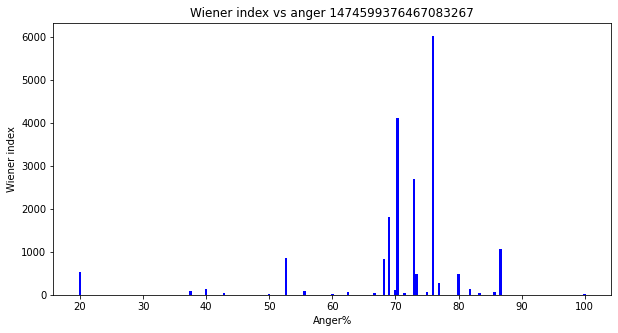

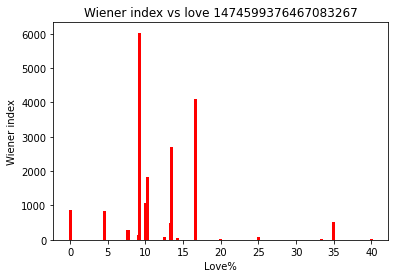

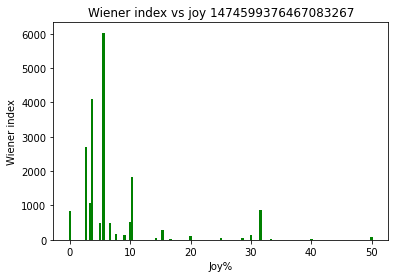

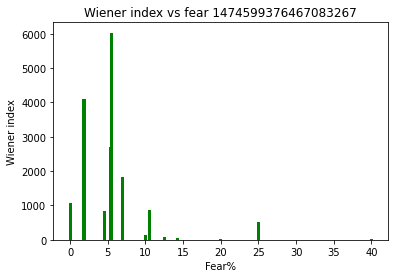

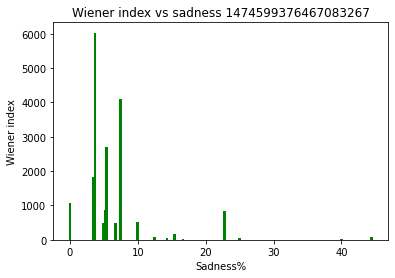

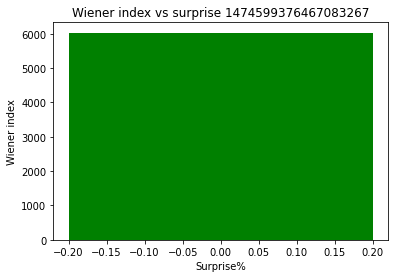

Average number of nodes in the reply tree of an influential node (Emotion-wise):  {'anger': 7.861111111111111, 'joy': 5.0, 'love': 8.857142857142858, 'sadness': 23.2, 'fear': 4.0}
Average direct responses to an influential node (Emotion-wise):  {'anger': 4.833333333333333, 'joy': 3.6363636363636362, 'love': 5.285714285714286, 'sadness': 9.2, 'fear': 2.0}
Average length of the reply tree of an influential node (Emotion-wise):  {'anger': 2.638888888888889, 'joy': 2.090909090909091, 'love': 2.857142857142857, 'sadness': 5.0, 'fear': 3.0}
Average emotion distribution in influential nodes:  {'sadness': 17.432006233821117, 'anger': 65.96171256009544, 'love': 19.768118206815522, 'joy': 20.124062986031124, 'fear': 14.420844739016244}
Average number of users involved in an influential node: 1.4073124466012965


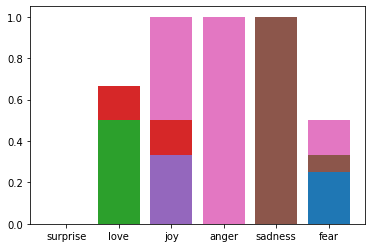

Original emotion:


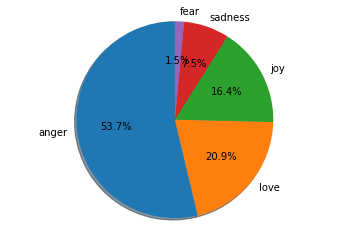

Propagated emotion:


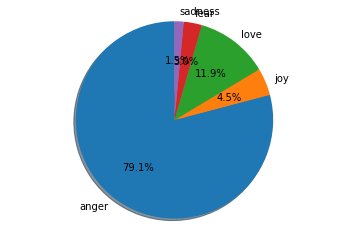

Higher than 60
[('id_7eab7892629d5db2758beb4d66e6c0ed', 1025), ('id_49b77c2656b21b258352bfe586a3ca2f', 36), ('id_559cdeb29dde139f76ee29b49bf25f7b', 23), ('id_67d22107c47f1d6754fe14cc93488097', 20), ('id_33e29e9e0e592191ff4abedb920240f7', 18), ('id_e1cd6d27319b9e495039cba9228e40bc', 17), ('id_6e0f106edc9238f2ed241e1b6b2cc46e', 15), ('id_d7cab39d5b571a58a0ee0b9d9b0ba7ac', 13), ('id_17bf5e7df134f0426d78d92a9aaadce6', 12), ('id_6e537ba51cb61a9bdff8ff39bf57f893', 11), ('id_919d06cdbd4375ea7b57109182bdea24', 10), ('id_61dd1c0e62f9508185c50c4390efa403', 9), ('id_83486d8bdbf196d4466c726b757c3c3a', 8), ('id_ddbd1fd63f375efe60b9c650fdcf5502', 7), ('id_c75556533f235a9877b54ac33fb78d64', 7), ('id_42e69c562cfd743f2ab1befd818f45db', 7), ('id_c54e4d4c7bf82e36bf8a1a5658f14e0b', 6), ('id_a99f1b9c809b404b9b22136dff9c2845', 5), ('id_e015a658a8e8581e1d8c6fbf374fed15', 5), ('id_d23741d20b138679fc102f18e76ac3af', 5), ('id_2993efe7ac4c4165d83992107daed94b', 5), ('id_d86f82c9b9d1777887df43129629f14b', 5), ('i

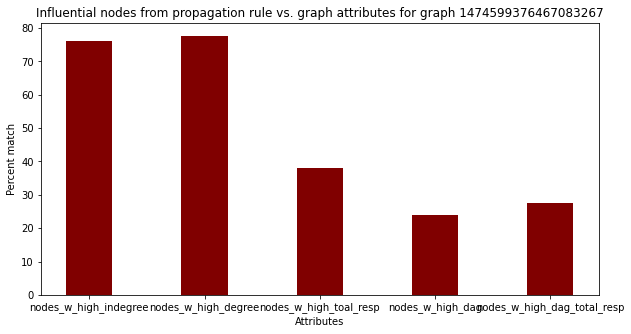

Emotion distribution across nodes: Counter({'anger': 1123, 'joy': 297, 'love': 194, 'sadness': 104, 'fear': 70})
Percentage distribution: [('anger', 62.80760626398211), ('fear', 3.9149888143176734), ('joy', 16.610738255033556), ('love', 10.850111856823267), ('sadness', 5.8165548098434)]
{'eigen_v': 0.9967021848204991, 'distance_from_root': 0, 'type_of_node': 'R', 'type_of_node_factor': 1, 'page_rank': 0.29760636174190486, 'influential': 1, 'influence_factor': 0, 'total_responses': 1558, 'longest_path_length': 10.0, 'longest_path_length_total_Resp': 15580.0, 'emotion_board': {'surprise': 1, 'love': 16.03593957462364, 'joy': 8.165457460005173, 'anger': 98.53175635281258, 'sadness': 4.094410635317975, 'fear': 4.791215810447185}, 'emotion_highest_score': 'anger'}
Graph:  1476048125076770816
Number of nodes:  2089
Number of edges:  1969
Emotion distribution across nodes: Counter({'anger': 1335, 'joy': 235, 'love': 207, 'sadness': 111, 'fear': 81})
Percentage distribution: [('love', 10.51295

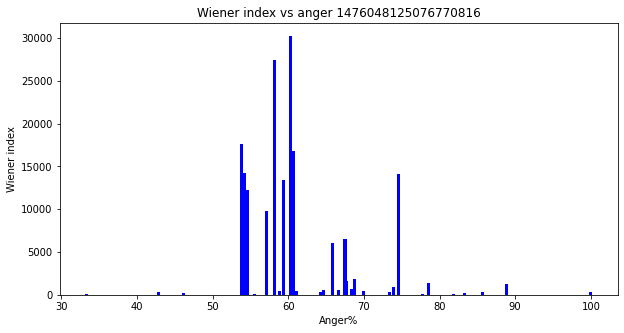

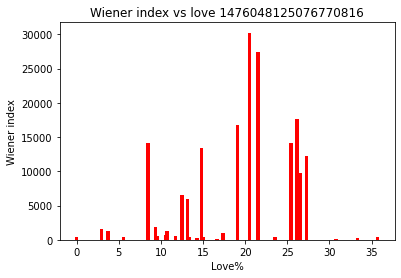

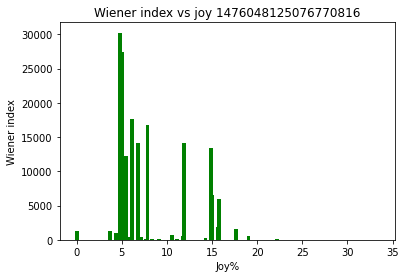

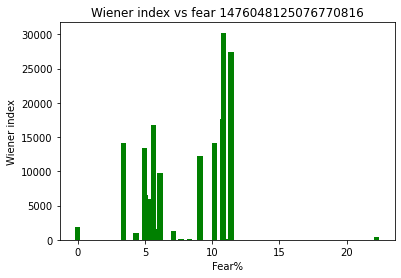

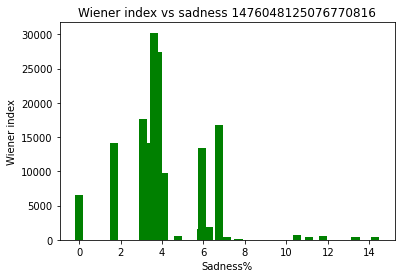

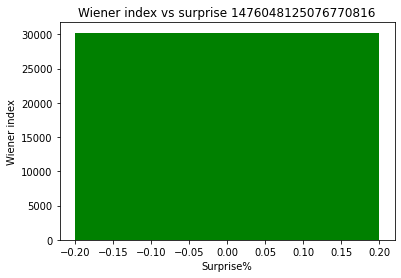

Average number of nodes in the reply tree of an influential node (Emotion-wise):  {'anger': 26.083333333333332, 'joy': 15.333333333333334, 'love': 34.0, 'sadness': 13.5, 'fear': 54.0}
Average direct responses to an influential node (Emotion-wise):  {'anger': 6.083333333333333, 'joy': 8.444444444444445, 'love': 15.0, 'sadness': 4.5, 'fear': 3.0}
Average length of the reply tree of an influential node (Emotion-wise):  {'anger': 7.208333333333333, 'joy': 3.7777777777777777, 'love': 6.0, 'sadness': 6.5, 'fear': 16.0}
Average emotion distribution in influential nodes:  {'anger': 66.19202722860341, 'sadness': 7.383388929368426, 'joy': 12.687418772302896, 'fear': 11.102004689165637, 'love': 18.530288001494622}
Average number of users involved in an influential node: 2.3073298029235785


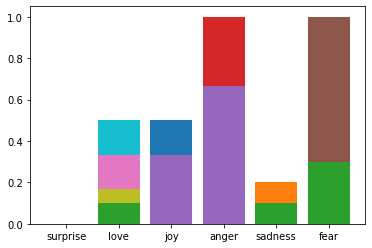

Original emotion:


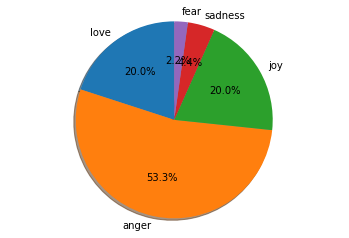

Propagated emotion:


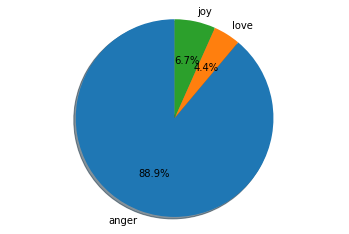

Higher than 60
[('id_128d11103f8b5e5cc052edc145c432d6', 899), ('id_7f79813775fc5a979b74b19117e0087c', 73), ('id_0d3cba1ca129ab2be34ed7f36b1290c8', 37), ('id_a01b2415620bd2c04e4bacc8f922e602', 20), ('id_e1a340dbd56fd39dde507c448464b0bb', 17), ('id_98dca507430242f4f9793b860d738c4d', 16), ('id_ce7a485b2d98008effd1a1034f0ac2cb', 15), ('id_f5e75127743040a8e00fecbcfc4d0d37', 15), ('id_8d6fc42786b24396c7d3bb7441190a39', 14), ('id_6b280b380ffae367fd04bf5f7adb16df', 12), ('id_a8ff516ce31369fe22b82f2882a82def', 10), ('id_fc43d5b5c287f14a417f44660bafd1a3', 10), ('id_cec65174bb9b032d39bf741025eca928', 10), ('id_02580ff5496f35c487f6bac7ac0dc4f7', 9), ('id_1aee9ed7228e2f028a5ba70eac56f4ef', 8), ('id_22d5006b62884d9db279099827192264', 7), ('id_33eafac3d311c32ee7a0a77fb54ed128', 7), ('id_dae325e5de50ecaaf5da151f2f043e23', 7), ('id_1369aebe668ec2cd5892f5e5d2c54f8a', 6), ('id_3f192488c99dab3b952a9926e4d2f354', 6), ('id_a3f2eadb83875d9c68483e6663d2c10c', 6), ('id_c1bf47b912a3b4841f09329ec270482a', 5), ('

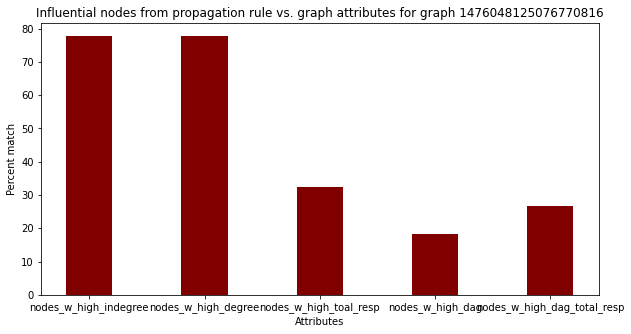

Emotion distribution across nodes: Counter({'anger': 1335, 'joy': 235, 'love': 207, 'sadness': 111, 'fear': 81})
Percentage distribution: [('love', 10.512950736414425), ('anger', 67.80091416962925), ('fear', 4.113763331640427), ('joy', 11.934992381919757), ('sadness', 5.6373793803961405)]
{'eigen_v': 0.9858335484204579, 'distance_from_root': 0, 'type_of_node': 'R', 'type_of_node_factor': 1, 'page_rank': 0.2318449191290889, 'influential': 1, 'influence_factor': 0, 'total_responses': 1642, 'longest_path_length': 21.0, 'longest_path_length_total_Resp': 34482.0, 'emotion_board': {'surprise': 1, 'love': 6.053600407812381, 'joy': 7.097359674604261, 'anger': 71.71261277523475, 'sadness': 1.7558197345587103, 'fear': 2.1277187278596053}, 'emotion_highest_score': 'anger'}


In [44]:
for key, value in data.items():
  
  print("Graph: ", key)
  print("Number of nodes: ", value.number_of_nodes())
  print("Number of edges: ", value.number_of_edges())
  G = emotional_impact_without_emotion_score(value, key)
  

In [ ]:
!zip -r /content/sample_data.zip /content/sample_data/interm


  adding: content/sample_data/interm/ (stored 0%)
  adding: content/sample_data/interm/number_of_direct_replies1539377610278731779.csv (deflated 51%)
  adding: content/sample_data/interm/dag_in_subgraph1539377610278731779.csv (deflated 54%)
  adding: content/sample_data/interm/number_of_nodes_in_subgraph1474599376467083267.csv (deflated 58%)
  adding: content/sample_data/interm/EmotionDistribution1465572912987979777.csv (deflated 73%)
  adding: content/sample_data/interm/number_of_direct_replies1476048125076770816.csv (deflated 53%)
  adding: content/sample_data/interm/number_of_nodes_in_subgraph1465572912987979777.csv (deflated 56%)
  adding: content/sample_data/interm/number_of_nodes_in_subgraph1571305823837753345.csv (deflated 45%)
  adding: content/sample_data/interm/dag_in_subgraph1465572912987979777.csv (deflated 63%)
  adding: content/sample_data/interm/number_of_direct_replies1563702309284384768.csv (deflated 54%)
  adding: content/sample_data/interm/number_of_direct_replies153

In [ ]:
for key, value in data.items():
  if str(1490146802309668867) == key:
    print("Graph: ", key)
    print("Number of nodes: ", value.number_of_nodes())
    print("Number of edges: ", value.number_of_edges())
    print(list(value.nodes(data=True)))
    #G = emotional_impact(value)
    # analysis(G)
    # Gn = emotional_impact_without_node_type_factor(value)
    # analysis(Gn)
    # Gs = emotional_impact_without_emotion_score(value)
    # analysis(Gs)
    # nx.write_gexf(Gs, key+".gexf")

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
for key, value in data.items():
  if str(1490146802309668867) == key:
    print("Graph: ", key)
    print("Number of nodes: ", value.number_of_nodes())
    print("Number of edges: ", value.number_of_edges())
    print(list(value.nodes(data=True)))
    for n in value.nodes(data=True):
      if n[1]['emotion'] == 'anger':
        print(value.in_degree(n[0]))
    #G = emotional_impact(value)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0
0
0
1
4
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
3
0
0
0
0
0
0
0
0
0
11
0
0
2
0
0
0
1
0
0
1
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
4
2
0
0
1
0
0
0
0
4
1
0
0
0
0
0
0
0
0
0
0
2
0
0
0
0
0
0
1
0
0
2
0
0
0
0
1
0
1
0
0
0
0
1
0
0
1
0
0
0
0
0
2
0
0
0
0
0
0
0
0
0
0
2
0
0
0
0
0
1
0
0
0
0
0
2
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
2
1
0
0
0
0
0
0
0
0
0
0
0
1
0
1
0
0
0
1
1
0
0
1
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
15
0
0
0
0
0
0
1
0
0
0
1
0
0
0
1
0
0
0
0
0
0
0
0
0
1
4
0
0
0
0
0
1
0
2
1
1
0
0
1
4
0
0
2
0
2
0
1
1
0
1
0
0
0
0
1
1
0
0
0
0
0
1
0
0
0
0
0
0
0
0
1
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
2
1
3
0
0
0
1
0
0
1
0
2
0
0
2
0
0
1
0
0
0
0
2
1
0
0
0
0
0
0
0
1
0
0
0
0
1
0
1
0
0
1
0
0
0
0
1
0
0
0
0
2
1
0
0
0
1
0
0
0
0
0
0
0
0
0
0
1
1
0
1
0
0
0
1
0
0
0
0
0
2
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
2
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


KeyError: ignored

In [ ]:
for key, value in data.items():
  if str(1490146802309668867) == key:
    print("Graph: ", key)
    print("Number of nodes: ", value.number_of_nodes())
    print("Number of edges: ", value.number_of_edges())
    print(list(value.nodes(data=True)))
    for n in value.nodes(data=True):
      if n[1]['emotion'] == 'love':
        print(value.in_degree(n[0]))

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1
0
1
2
0
0
0
1
0
0
0
0
0
1
0
1
0
1
0
0
0
0
0
0
0
0
0
0
0
0
1
0
1
0
0
0
0
0
0
1
0
2
0
0
0
0
0
0
0
2
0
0
0
0
0
0
0
2
0
2
0
0
0
2
0
1
1
0
0
0
0
0
0
0
0
0
0
0
1
1
2
0
0
0
1
1
1
0
0
0
1
1
0
1
1
1
0
0
0
0
0
1
3
2
0
1
0
0
0
0
1
2
0
1
1
0
0
1
0
0
0
0
3
3
1
0
0
1
1
0
0
0
1
0
0
0
0
0
0
1
0
1
0
0
0
0
1
0
0
0
1
0
0
1
0
1
0
1
0
0
0
1
0
0
0
0
0
0
0
1
0
0
1
1
0
1
1
0
0
6
0
0
0
0
1
1
1
1
1
0
0
0
0
0
1
1
1
0
0
0
0
0
1
0
0
0
0
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
1
2
0
0
0
1
2
1
1
0
0
3
0
0
1
1
0
1
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
1
0
2
0
0
0
0
0
0
0
3
0
0
0
0
1
0
0
0
2
0
0
0
0
0
0
0
1
0
1
0
0
0
0
0
2
1
0
0
0
1
1
0
1
0
0
0
0
1
1
0
2
0
1
1
0
1
0
0
0
2
0
0
0
0
0
1
1
0
1
0
3
0
0
0
0
1
1
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
1
0


KeyError: ignored

In [ ]:
# number of nodes
# number of users
# number of nodes per emotion
# avg responses recevied by nodes of six emotions
# avg length of reply tree/ number of nodes in the reply tree thread, for each emotion
# number of nodes per emotion that received a response with the same emotion
# run without emotion score


# for the xlsx............
# remove prints, and graph plots, run without total_response_thread
# number of influential nodes per emotion
# degree plot for the graph
# now since analysis of influential nodes is happening in a sep function:
# does anger receive angry response
# depth of anger
# breadth of anger
# presence of users
# multiple responses from the same user
# connected components
# run without total_responses

In [ ]:
def analysing_emotion_Responses(G):
  six_emotions = ['surprise', 'love', 'joy', 'anger', 'sadness', 'fear']
  nodes_of_em = []
  for em in six_emotions:
    print("em", em)
    for node in list(G.nodes(data=True)):
      if 'emotion' in node[1]:
        if node[1]['emotion'] == em:
          nodes_of_em.append(node[0])
    print(nodes_of_em) 
    if len(nodes_of_em) > 0:
      mean_resp = [number_pred(G, n) for n,v in G.nodes(data=True) if n in nodes_of_em]
      print("Avg responses receievd by:", em, mean(list(filter(lambda num: num != 0, mean_resp))))
      mean_resp_thread = [total_responses_thread(G, n) for n,v in G.nodes(data=True) if n in nodes_of_em]
      print("Avg total responses received by the thread for emotion:", em, mean(list(filter(lambda num: num != 0, mean_resp_thread))))
      mean_length_thread = [longest_path_graph(G, n) for n,v in G.nodes(data=True) if n in nodes_of_em]
      print("Avg length of the thread for emotion:", em, mean(list(filter(lambda num: num != 0, mean_length_thread))))

In [ ]:
def emotions_in_direct_replies(G, node):
  six_emotions = ['surprise', 'love', 'joy', 'anger', 'sadness', 'fear']
  emotion_dict = dict(zip(six_emotions, [0] * 6))
  emotions = nx.get_node_attributes(G, 'emotion')
  number_preds = number_pred(G, node[0])
  preds = list(G.predecessors(node[0]))
  if len(preds) > 0:

    for i in preds:
      current_value_emotion_in_emotion_dict = emotion_dict.get(emotions[i])
      emotion_dict.update({emotions[i]:float(current_value_emotion_in_emotion_dict) + 1})

    new_dict = {k:float(v) for k, v in emotion_dict.items()}
    emotion_highest_score = max(new_dict.items(), key=operator.itemgetter(1))[0]
    a = emotion_dict.values()
    counter = collections.Counter(a)
    print("Emotion distribution:", counter)
    G.nodes[node[0]]['emotion_board_preds'] = counter
  else:
    G.nodes[node[0]]['emotion_board_preds'] = {}

In [ ]:
def emotions_in_thread(G, node):
  six_emotions = ['surprise', 'love', 'joy', 'anger', 'sadness', 'fear']
  emotion_dict = dict(zip(six_emotions, [0] * 6))
  emotions = nx.get_node_attributes(G, 'emotion')
  number_preds = number_pred(G, node[0])
  ancs = [n for n,v in G.nodes(data=True) if n in list(nx.ancestors(G, node[0]))]
  if len(ancs) > 0:

    for i in ancs:
      current_value_emotion_in_emotion_dict = emotion_dict.get(emotions[i])
      emotion_dict.update({emotions[i]:float(current_value_emotion_in_emotion_dict) + 1})

    new_dict = {k:float(v) for k, v in emotion_dict.items()}
    emotion_highest_score = max(new_dict.items(), key=operator.itemgetter(1))[0]
    a = emotion_dict.values()
    counter = collections.Counter(a)
    print("Emotion distribution:", counter)
    G.nodes[node[0]]['emotion_board_thread'] = counter
  else:
    G.nodes[node[0]]['emotion_board_thread'] = {}

In [ ]:
def analysing_influential_nodes(G):
  for n in G.nodes(data=True):
    if ('influential' in n[1]):
      if (n[1]['influential'] == 1):
          emotions_in_direct_replies(G, n)

In [ ]:
for key, value in data.items():
  print("Graph: ", key)
  analysing_emotion_Responses(value)
  analysing_influential_nodes(value)

Graph:  1490146802309668867
em surprise
[]
em love
['id_ca96f8a99cae6fc9300033c34af540f7', 'id_cb40b2d7e2f3fcaff7b4609f277187fe', 'id_50e7bc168a4c7911c5a2a3bcbd3df103', 'id_f025fe57e61e74da1fd1d863cdc8b6bc', 'id_c21f39e0f6dadb933df65e13c704c80c', 'id_1d13dde1ba20b66253b4841359a71e6b', 'id_37251cfffea5b5fe9d9c10cfdf7e92d7', 'id_b580b328762595b1708c9e24e6497f3c', 'id_5873586abe56ce45b89e27f637ad43b5', 'id_6e8cee3c09766b1d64642061fb9fa1da', 'id_ddedb1f9383dff633aa0dac576849d90', 'id_5950ca13322d6462c47cbf9799b0634d', 'id_9435c21caae177cf903576c6ca4dc0e2', 'id_72b451686efcd06dcf7c04df3a346c64', 'id_e9f25b0ed0d65a7319274c28ee7329bf', 'id_d3d789594195eb714e5aef4acd970933', 'id_c3a387d0cc5496bff0cec3084764dce7', 'id_bb9d0e41d0ae1b289c2afcbd93840a0f', 'id_40f9f8eb38521bef85aa70b3780c752f', 'id_55305e12eda4a84ebe7bd37acc4c55da', 'id_de03f95f5b5e67ff913a53c13153e44d', 'id_38d3b35a44ec57a41f5a8df4934890cd', 'id_0cb9f2cf8be091accfc83bc68f058f25', 'id_9d441a081a03c0c3d06e69ca88cd8a48', 'id_84864fce

StatisticsError: ignored

In [ ]:
def emotion_cal_influential_nodes(G, influential_nodes): 
  for node in influential_nodes:
    print("For influential node: ", node)

    selected_nodes = [n for n,v in G.nodes(data=True) if n in list(nx.ancestors(G, node))]  
    print (selected_nodes)
    selected_nodes.append(node)
    H = G.subgraph(selected_nodes)
    num_nodes = H.number_of_nodes()
    num_edges = H.number_of_edges()
    print("Number of nodes: ", num_nodes)
    print("Number of edges: ", num_edges)
    if num_nodes > 0:
      He = emotional_impact(H)
      analysis(He)
      return 1

In [ ]:
nx.dag_longest_path_length(G1)

5

In [ ]:
nx.dag_longest_path(G1)

[22, 18, 13, 9, 4, 1]

In [ ]:
# 1000 or more
1571305823837753345 = "A re-elected Labor government will redevelop and expand Maroondah Hospital from the ground up. It will be renamed in honour of Her Majesty, Queen Elizabeth II."
1563702309284384768 = "We're making it free to study to become a nurse or midwife in Victoria."
1556805628974481408 = "We're making N95 masks free - starting today. Over the next few weeks we'll be handing out over 3 million free N95 and KN95 masks at testing sites, on public transport and through community health services."
1539377610278731779 = "In our state, nobody has the right to spread racism, hate or antisemitism. Ever. That's why last night we passed legislation to ban the Nazi symbol. And now, it's the law."
1539095316661604352 = "We're putting a mental health worker in every government school in the state. Every primary school. Every secondary school. Every specialist school. And it's going to make such a difference."
1534718570504273920 = "To Victoria's healthcare workers. Announcing winter retention and surge payments for hospital and ambulance workers."
1490146802309668867 = "It took a broken back to make me miss a Midsumma. But this year I'm back to march with LGBTIQ+ Victorians - today, and every day.  Because in Victoria, equality is not negotiable."
1482856761153703937 = "I've got some good news. 3 million free rapid antigen tests have landed in Victoria, and 41 million more are on the way."
1476048125076770816 = "It's good to set a resolution or two you'll actually tick off. Put your third dose on the list."
1474599376467083267 = "Merry Christmas Victoria"
1465572912987979777 = "The last few days are a reminder that this isn't over yet and our response needs to change as the virus changes. That's why - as a precaution - we're making changes to quarantine for some international arrivals to keep Victorians safe until we know more about Omicron."
1461114694073139200 = "At 11.59pm tonight restrictions are lifting in Victoria. There will be no density limits. No capacity limits. No restrictions on how many people can visit you at home. No masks in most places. And if you want to celebrate - you can hit the dance floor too."

11sep...queen's death tweet

In [ ]:
# 800 or more
1555012681408868352 = "We're making it absolutely clear - consent can never be assumed."
1551463006416285696 = "Not so humble brag. Victoria has the best performing economy in the country."
1549191686857064448 = "Today we finished removing our 65th level crossing. They're dangerous. They're congested. And now they're gone for good."
1546396355194941440 = "From today everyone over 30 can get their winter dose of a COVID vaccine. Get it done to protect yourself - and our healthcare workers."
1531441134245130240 = "We've just announced that from tomorrow flu shots will be free for every Victorian."
1521788960925941760 = "Popped into Ballarat Hospital today to let them know they're going to be getting more healthcare workers and nurses to help lighten the load. And to simply say thanks."
1491622481836142597 = "We didn't need a plebiscite to tell us that marriage equality was the right thing to do. We sure as hell don't need an inquiry to tell us that these laws will harm trans kids."
1491331667231129600 = "All kids deserve protection. Gay kids, trans kids - all kids, no exceptions. If the Federal Government wants to change that, then we will do everything in our power to protect LGBTIQ+ Victorians."
1489465175857983490 = "We're making a big boost to our Omicron response. $1.4bn for more ambos, more respiratory clinics, more PPE, more care if you need it. And we're extending the Surge Allowance for frontline doctors, nurses and ambos. Because they care for us - and we'll back them 100%"
1463636448138067969 = "90% of Victorians are fully vaccinated. 9 in 10 Victorians who have done the right thing to protect themselves, their families and the entire state. Because of you, we're open and getting back to the things we love. And I couldn't be prouder."
1459023781196800003 = "Today we've announced that Victoria will adopt an affirmative consent model. For too long, the burden of proof has fallen on the victims and survivors of sexual violence. It's not right, and it has failed victims and survivors. So we're fixing it."


In [ ]:
# 500 or more
1572125002484576256 = "Just the way it should be. More than half of labour candidates in election are women."
1570247257181794304 = "If re-elected we'll establish new Paramedic Practitioner roles in Victoria. They'll be able to treat patients - without needing to take them to hospital. It'll be better for patients, better for our busy EDs - and it just makes sense."
1564770049226747904 = "Last night something big happened in Parliament. Affirmative consent is now the law in Victoria."
1561168473644236800 = "Not rail or hospitals. Both."
1559112600612642818 = "There's only a handful of places in the world that can manufacture mRNA vaccines. And soon – we'll be one of them. Today @AlboMP  and I signed a partnership with Moderna to open an mRNA vaccine manufacturing facility at Monash University Clayton"
1558999919658434560 = "Those glasses were trendy back then, I swear. Things change I guess. Just like getting your L's and P's - starting today they're free."
1545188168869490689 = "We're locking in Free RATs at schools and pre-schools until the end of the year."
1528175966484590592 = "I’ve been in touch with my mate @AlboMP to congratulate him. Australians have voted for higher wages, for good jobs, for better healthcare and a decent retirement. And they’ve voted for a Labor Prime Minister to get on and deliver it."
1518383107988422656 = "Lest we forget."
1516925923345715201 = "Victoria, meet your new trams. We're building them right here – for Victorians, by Victorians. And there's 100 of them on the way."
1513675632118759426 = "It's official: the 2026 Commonwealth Games will be the Regional Victoria games."


In [ ]:
# 200 or more
1572474737565274118 = "Victoria, meet Melbourne Airport's station. Airport Rail has been talked about since before the airport even opened. And now it's happening."
1572057675772596224 = "Our Hospital Plan for the North is big. But that's exactly what it needs to be. Because Melbourne's north is growing, and its hospitals need to as well."
1571697010667061249 = "If the claims from the last round of vouchers are anything to go by, we're about to have a run on dumplings. Our voucher program is back - all over Victoria, any day of the week. Get your mates together and book it in. 25% is on us."
1567287594186317826 = "To the 90,000 students sitting their GAT test today - good luck. And remember: whether you're off to TAFE, uni, or work next year - we're with you every step of the way."
1564099075641085952 = "Free TAFE has helped 115,000 Victorians train and get into some of our most in-demand jobs. Free nursing and midwifery will do the same."
1561462274128515072 = "Today 64 of our newest paramedics are hitting the road for the very first time. Congratulations - and thank you so much."
1561238057021743111 = "We're opening five new Priority Primary Care Centres near hospitals in Ballarat, Sunshine, Epping, Clayton and at the Royal Melbourne. They'll be the place to go when you need urgent care for things like fractures, minor infections and burns - and they'll be open by November."
1560110665188093952 = "Triple tunnel, thirty metres below the CBD. Terrific."
1537178352884551680 = "Some things are bigger than state boundaries. Giving kids the very best start in life is one of them. We're joining with NSW to start the biggest ever reform to early education. It'll be better for kids, cheaper for families, and give women more choice about returning to work."
1536157637888184320 = "We're opening 8 more permanent Breastscreen clinics in some of Victoria's fastest growing suburbs. Because early cancer detection saves lives."



In [ ]:
# 100 or more
1571698429126119424 = "We said we’d remove 50 level crossings by 2022, & we smashed that with 66 already gone for good. We’re on track to remove 85 by 2025 – but we aren’t stopping there. We’re removing 8 more from the Upfield Line – making local roads safer & paving the way for more trains, more often"
1564442777022517249 = "New South Wales and Victoria are establishing 50 Priority Primary Care Services - half on either side of the Murray. They're for patients who need urgent care, but not quite lights and sirens - and they'll be absolutely free."
1557579990585454594 = "The kids said this was a big deal. Dua Lipa performing at the Palias Theatre."
1557540720051126272 = "We're opening a second dedicated elective surgery centre so Victorians can get the care they need. The new Blackburn Public Surgical Centre will have two new operating theatres - and we'll have it up and running by October."
1542327946982989824 = "Our $250 Power Saving Bonus starts tomorrow. Every household, no strings attached."
1529619296753971200 = "Two artworks by Wurundjeri artist William Barak are officially returning to Country. Until this morning, the pieces have been in the hands of a Swiss family. But after a successful auction bid this morning, it's been confirmed the artwork is coming home."


In [ ]:
#covid-reopening and vaccination
1451326508786544649 = "As my kids say - there's a big vibe today. You can feel the optimism. You can sense the pride in what's been achieved. And after everything it's taken to get here, we absolutely deserve to feel that way."
1452069313477689345 = "It's a great weekend in Victoria - and next weekend is going to be even better. With vaccination rates heading towards 80% double dosed, we can take the next steps in opening up in time for next weekend - and outline what life will be like at 90% fully vaccinated."
1449967295048998913 = "Yesterday the number of Victorians who booked in a vaccination appointment doubled, compared to the day before. We're heading towards being one of the most vaccinated places in the world - and I couldn't be prouder."
1447361029474697218 = "To get back to the pub, back to big family dinners, back to live music and back to all the things we love - your vaccination is your ticket. Get double dosed, so we can all get back to the things we've missed: http://coronavirus.vic.gov.au/vaccine"
1443457309359808512 = "I won't sugar-coat it, today's numbers were hard. This clearly isn't where we want to be - it's obvious this virus is moving fast, and we're racing against it's spread to protect our state"
1440264905307811850 = "Anger isn't going to make this pandemic end any quicker. Acts of violence like we've seen in the city in the last two days isn't going to stop people ending up in ICU, or be any help to the nurses treating them. Literally only one thing will - getting vaccinated."
1439806184488267777 = "I've got some good news. Starting today hundreds of thousands of doses of Moderna will be delivered to 721 pharmacies across Victoria - and then into Victorians' arms. Just like the other vaccines: it's safe, it's effective, and every dose gets us closer to opening up."
1439418426850570244 = "Today we are releasing our roadmap. As well as laying out how we will deliver the National Plan, the roadmap lets Victorians know when we can catch up with friends and family, and get back to the things we love."
1436224114897817628 = "If you want to get on the beers, we've all got to get on the vaccines."
1432899675682529283 = "On the advice of the Chief Health Officer, Victoria's lockdown will be extended to slow the spread and keep Victorians safe. Due to the level of community transmission and number of unlinked cases, almost all restrictions will remain in place."



SyntaxError: ignored